In [38]:
from AL_methods import *
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [39]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [40]:
data_dir = "/content/drive/MyDrive/"
training_path = "Event3_TP_B.CSV"
df = pd.read_csv(data_dir + training_path, skiprows=[0,1,2,4])

df

,Time,C_W919_W910_1_W910_A,C_W919_W910_1_W910_B,C_W919_W910_1_W910_C,C_W919_W910_1_W910_N,V_W-115KV2_AN,V_W-115KV2_BN,V_W-115KV2_CN,C_W957_W950_1_W950_A,C_W957_W950_1_W950_B,...,V_FD2B5_AN,V_FD2B5_BN,V_FD2B5_CN,C_FD3B4_FD3B5_1_FD3B4_A,C_FD3B4_FD3B5_1_FD3B4_B,C_FD3B4_FD3B5_1_FD3B4_C,C_FD3B4_FD3B5_1_FD3B4_N,V_FD3B4_AN,V_FD3B4_BN,V_FD3B4_CN
0,0,-0.001117,0.000795,0.001051,0.000243,1.38849,0.361076,-1.186239,0.000444,0.000481,...,-0.088815,-0.042072,-0.162626,-0.002162,-0.001989,0.001964,-0.000011,0.155188,-0.11165,0.023068
1,208,9.352501,-4.304360,-5.144902,0.319372,34541.80000,-15825.850000,-17082.810000,46.050460,-22.238640,...,390.515200,1.566911,-389.253900,3.336518,-0.115099,-3.320205,0.029933,2018.510000,63.53440,-2062.298000
2,417,-22.430290,11.109540,10.867570,1.738492,151485.60000,-64921.180000,-81696.840000,11.150850,-3.098541,...,9020.013000,-222.725300,-9476.238000,32.150500,1.094313,-33.751270,0.156708,12470.580000,714.73400,-13337.190000
3,625,-42.495390,18.666790,23.457910,1.658324,173885.40000,-66805.880000,-106459.000000,-18.311300,11.265630,...,10419.650000,936.707700,-11753.950000,67.563890,5.640487,-74.118830,0.244317,14464.310000,2096.18800,-16673.080000
4,833,-52.198100,19.936660,32.169000,0.650063,99493.91000,-25811.540000,-82806.520000,-59.529630,29.248800,...,8733.869000,1907.246000,-11090.140000,82.416900,13.258050,-96.495240,0.167763,8599.119000,3281.01000,-11914.810000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96000,19999872,-44.939040,35.195690,9.743884,-0.006694,93525.61000,-51996.300000,-41586.200000,-22.058710,19.700850,...,9833.264000,-2221.726000,-7580.952000,101.162900,-30.572290,-70.556610,-0.001233,10050.220000,-1334.66900,-8708.773000
96001,20000080,-45.904180,32.578530,13.326900,-0.088404,93700.42000,-45718.830000,-48035.450000,-22.777260,18.543910,...,9545.197000,-1413.373000,-8091.087000,98.989050,-22.671950,-76.253590,-0.006177,9681.189000,-478.79700,-9194.001000
96002,20000289,-46.584390,29.757470,16.833290,-0.167800,93296.70000,-39161.720000,-54188.580000,-23.355640,17.271290,...,9198.172000,-596.009300,-8551.751000,96.204660,-14.628050,-81.474760,-0.011010,9252.572000,380.08980,-9622.316000
96003,20000497,-46.982260,26.750570,20.240090,-0.245655,92318.63000,-32359.910000,-60008.170000,-23.790640,15.890770,...,8794.430000,225.215500,-8959.437000,92.822670,-6.497145,-86.198670,-0.015788,8766.753000,1236.29700,-9991.190000


In [41]:
# remove first 0.25 seconds to allow system to stabilise before using data
data = preprocess(df, time=0.25e6, remove_neutral=True)
data

,C_W919_W910_1_W910_A,C_W919_W910_1_W910_B,C_W919_W910_1_W910_C,V_W-115KV2_AN,V_W-115KV2_BN,V_W-115KV2_CN,C_W957_W950_1_W950_A,C_W957_W950_1_W950_B,C_W957_W950_1_W950_C,V_W951_AN,...,C_FD2B2_FD2B1_1_FD2B1_N,C_FD2B5_FD2B6_1_FD2B5_B,C_FD2B5_FD2B6_1_FD2B5_C,C_FD2B5_FD2B6_1_FD2B5_N,C_FD3B4_FD3B5_1_FD3B4_B,C_FD3B4_FD3B5_1_FD3B4_C,C_FD3B4_FD3B5_1_FD3B4_N,V_FD3B4_AN,V_FD3B4_BN,V_FD3B4_CN
1201,-41.71764,26.27050,15.451680,93621.34,-41693.10,-51978.56,-20.33806,15.32270,5.036430,93621.34,...,0.000127,-12.215260,-59.30908,0.005448,-17.316600,-80.07730,-0.009566,9427.356,101.3871,-9518.610
1202,-42.09753,23.59913,18.508600,92855.53,-34969.94,-57935.31,-20.76017,14.14497,6.645474,92855.53,...,0.000175,-6.167848,-62.87028,0.004002,-9.176995,-84.98125,-0.015121,8958.220,962.6187,-9908.562
1203,-42.21817,20.77549,21.450610,91519.53,-28028.32,-63536.71,-21.05339,12.87754,8.214645,91519.53,...,0.000220,-0.076075,-66.04097,0.002604,-0.980830,-89.36223,-0.020566,8434.266,1817.8210,-10236.970
1204,-42.07956,17.82537,24.267470,89621.66,-20917.74,-68748.48,-21.21772,11.53212,9.733654,89621.66,...,0.000261,6.012002,-68.80682,0.001158,7.219684,-93.19022,-0.025899,7858.274,2661.6330,-10502.550
1205,-41.68170,14.76169,26.936220,87166.08,-13676.07,-73533.20,-21.25155,10.11390,11.192210,87166.08,...,0.000301,12.066810,-71.14991,-0.000288,15.376700,-96.44380,-0.031066,7233.422,3489.0320,-10703.220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96000,-44.93904,35.19569,9.743884,93525.61,-51996.30,-41586.20,-22.05871,19.70085,2.367553,93525.61,...,0.000374,-22.243770,-52.28340,0.007714,-30.572290,-70.55661,-0.001233,10050.220,-1334.6690,-8708.773
96001,-45.90418,32.57853,13.326900,93700.42,-45718.83,-48035.45,-22.77726,18.54391,4.253131,93700.42,...,0.000388,-16.355300,-56.43934,0.006364,-22.671950,-76.25359,-0.006177,9681.189,-478.7970,-9194.001
96002,-46.58439,29.75747,16.833290,93296.70,-39161.72,-54188.58,-23.35564,17.27129,6.111698,93296.70,...,0.000387,-10.367030,-60.24058,0.004966,-14.628050,-81.47476,-0.011010,9252.572,380.0898,-9622.316
96003,-46.98226,26.75057,20.240090,92318.63,-32359.91,-60008.17,-23.79064,15.89077,7.935538,92318.63,...,0.000370,-4.315920,-63.67281,0.003568,-6.497145,-86.19867,-0.015788,8766.753,1236.2970,-9991.190


In [42]:
# window = 350
# w = 1

# cov_fn = covariance_pair
# thresholds_cov, cov_multi_list = get_threshold_stat_only(data, cov_fn, cols,
#               window=window, w=w, adj_list=adj_list, quantile=1, axis=1, stat_list=None, plot=True, collate_fn="sum")
# thresholds_cov_99, cov_multi_list = get_threshold_stat_only(data, cov_fn, cols,
#               window=window, w=w, adj_list=adj_list, quantile=0.99, axis=1, stat_list=cov_multi_list, collate_fn="sum")
# thresholds_cov_95, cov_multi_list = get_threshold_stat_only(data, cov_fn, cols,
#               window=window, w=w, adj_list=adj_list, quantile=0.95, axis=1, stat_list=cov_multi_list, collate_fn="sum")

In [43]:
len(adj_list)

93

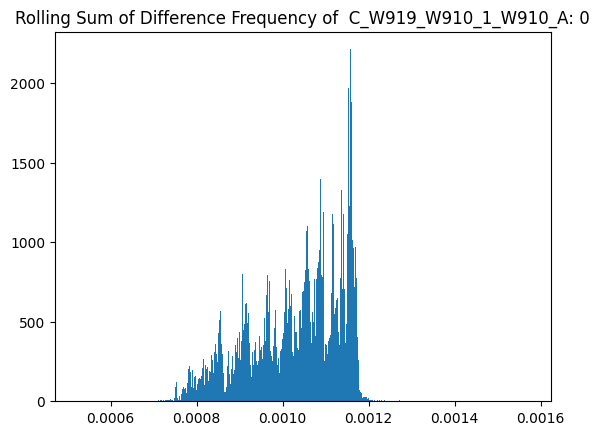

******************************************************************************


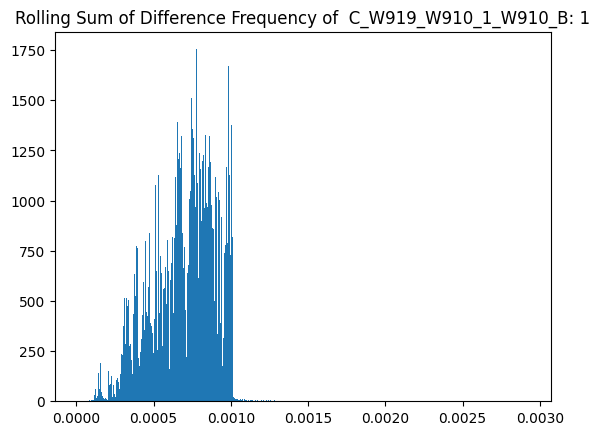

******************************************************************************


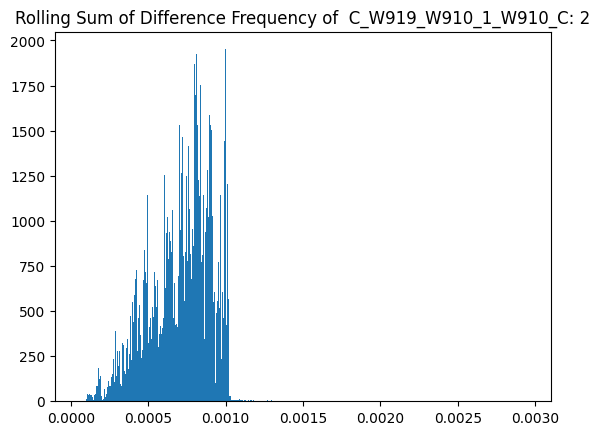

******************************************************************************


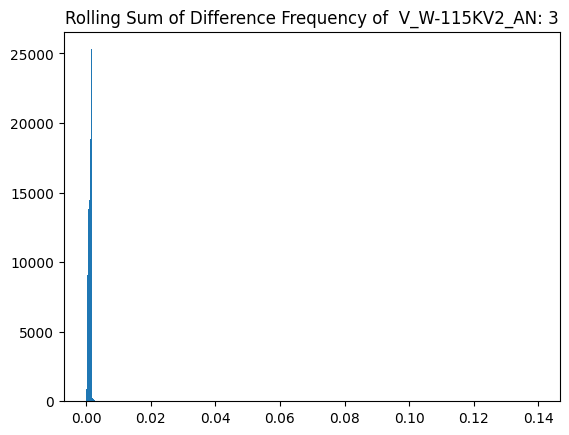

******************************************************************************


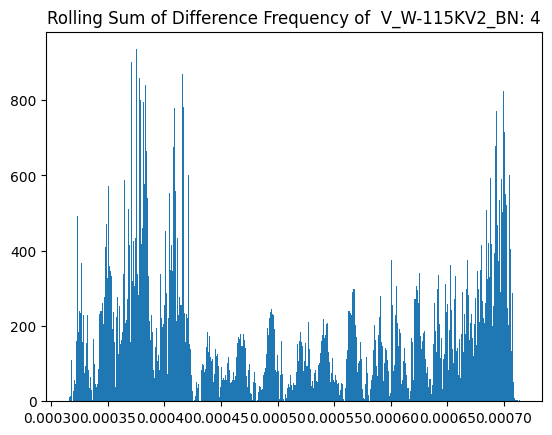

******************************************************************************


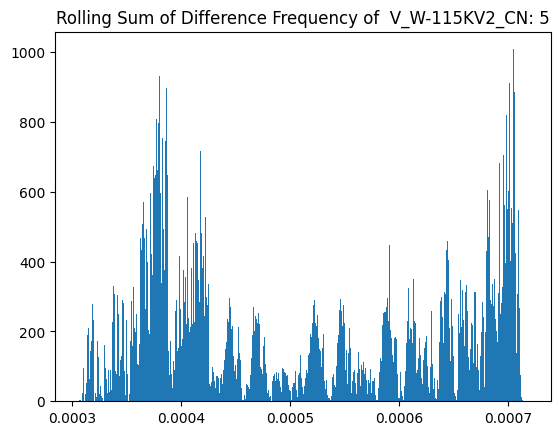

******************************************************************************


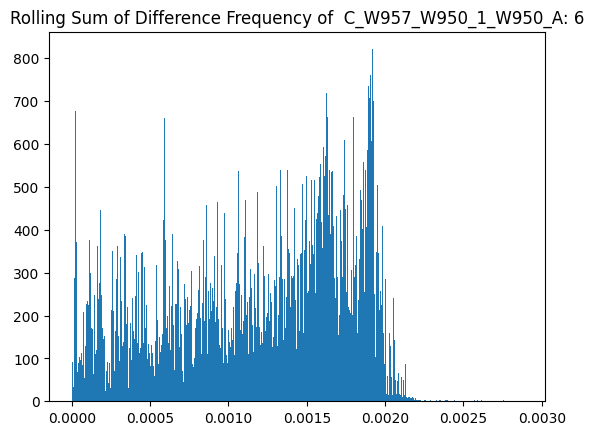

******************************************************************************


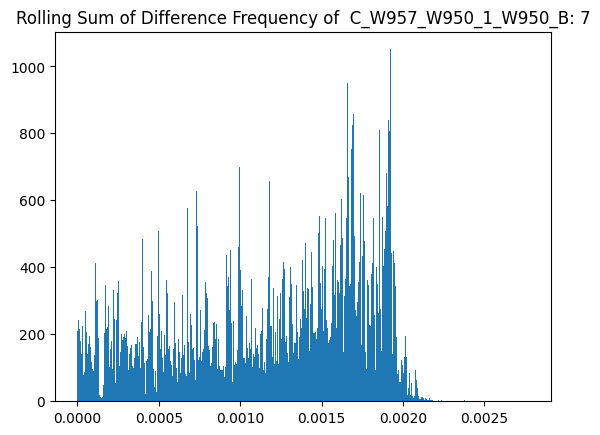

******************************************************************************


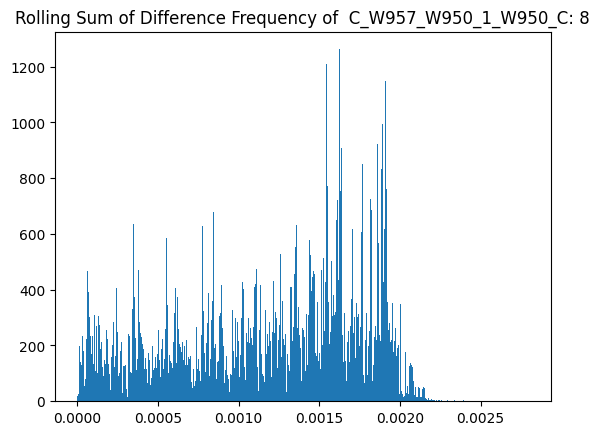

******************************************************************************


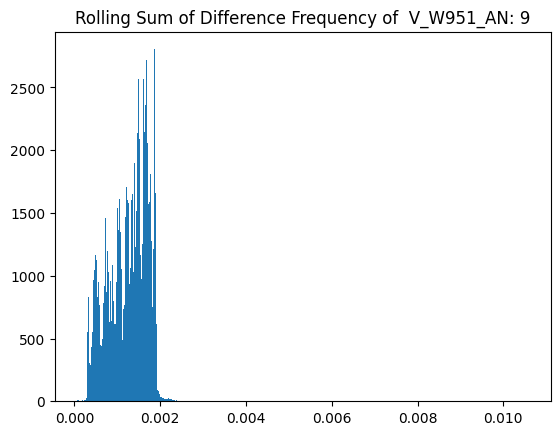

******************************************************************************


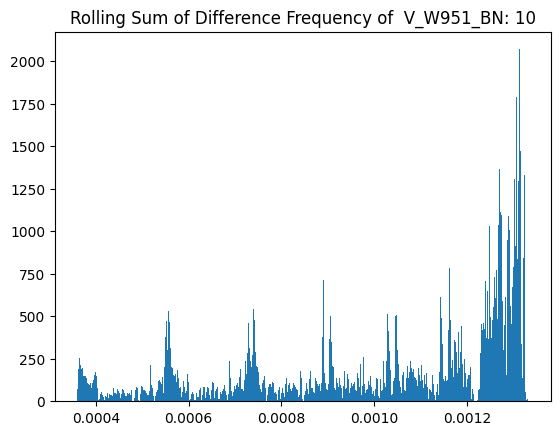

******************************************************************************


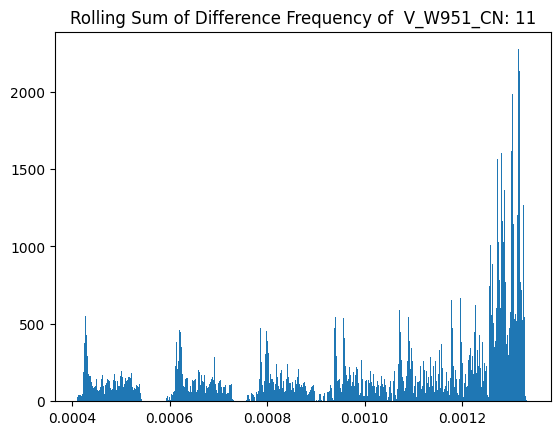

******************************************************************************


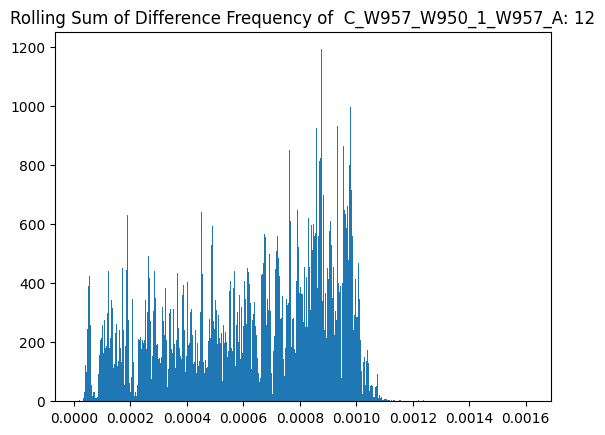

******************************************************************************


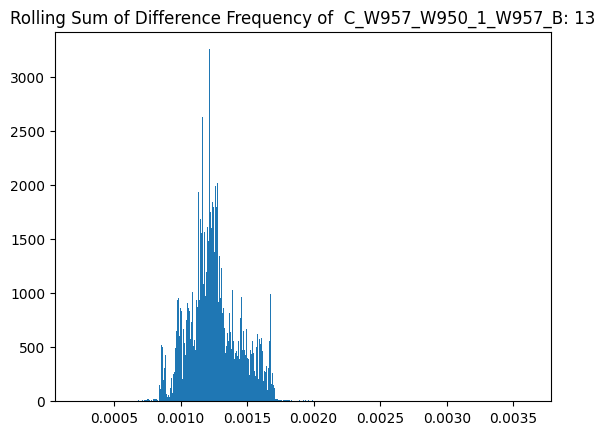

******************************************************************************


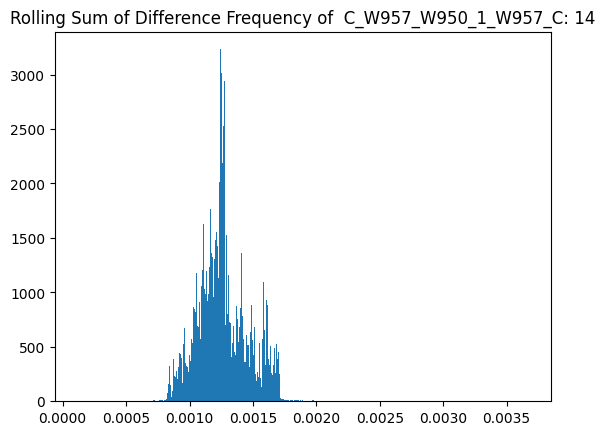

******************************************************************************


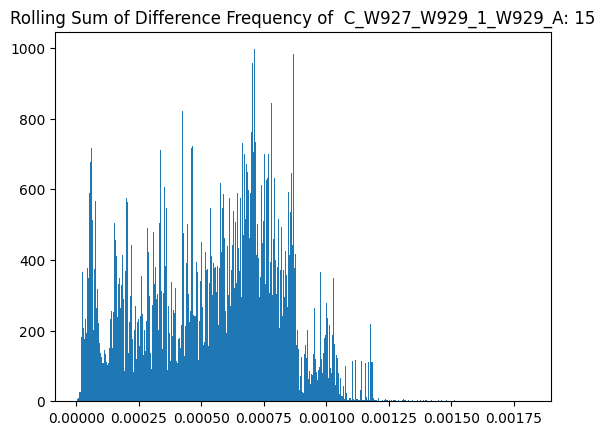

******************************************************************************


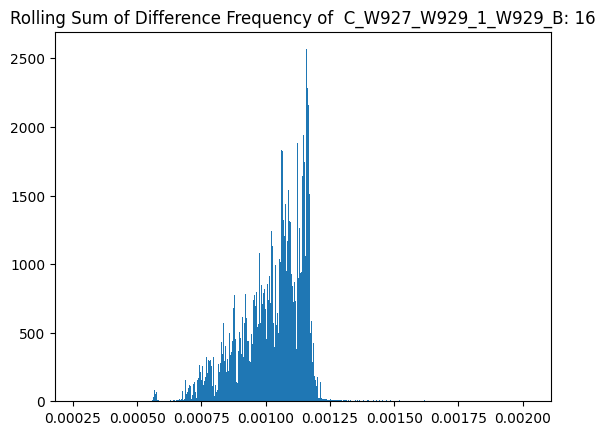

******************************************************************************


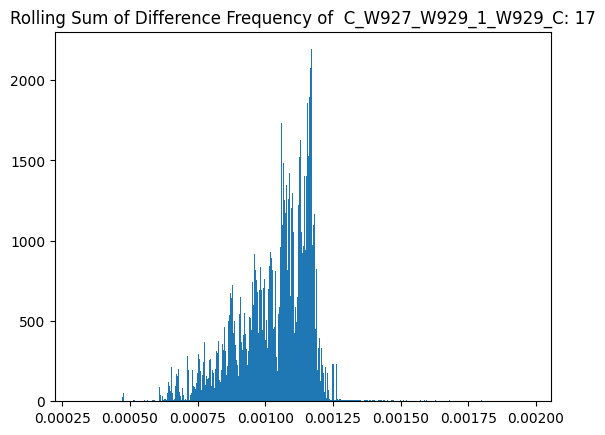

******************************************************************************


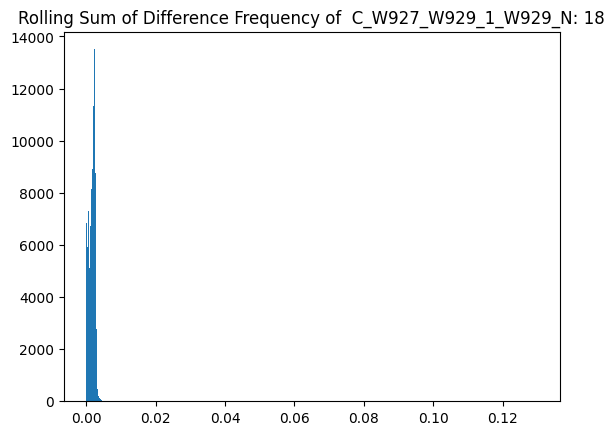

******************************************************************************


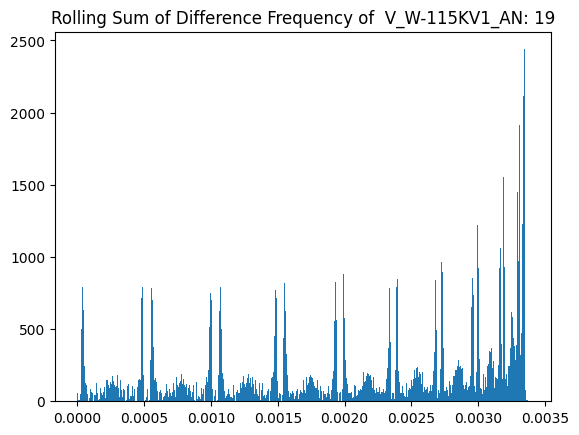

******************************************************************************


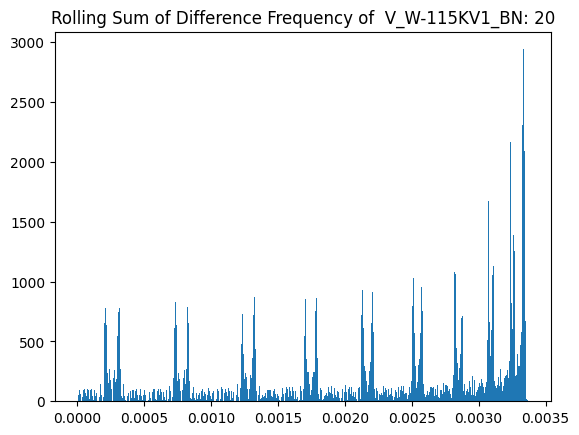

******************************************************************************


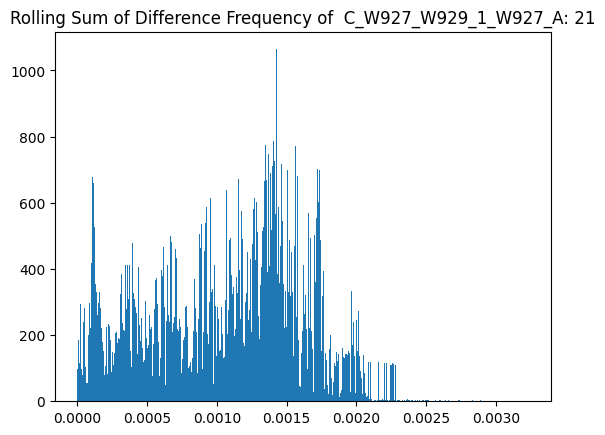

******************************************************************************


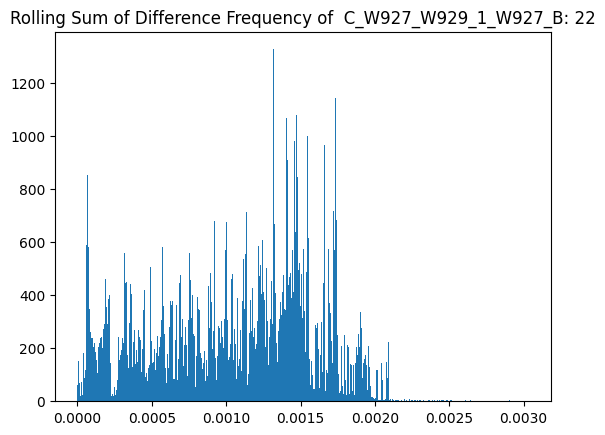

******************************************************************************


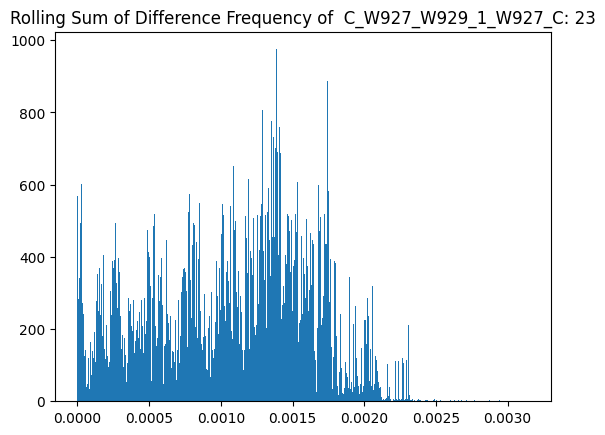

******************************************************************************


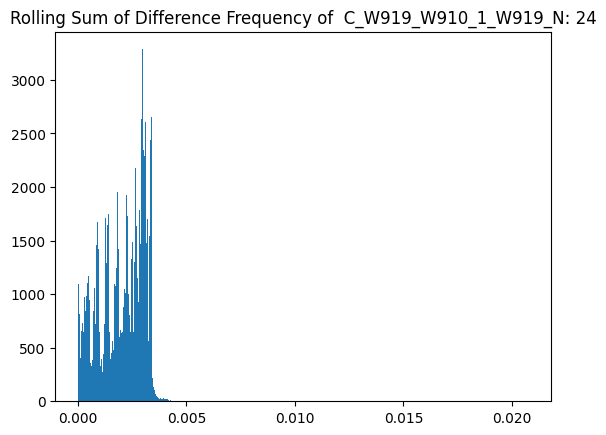

******************************************************************************


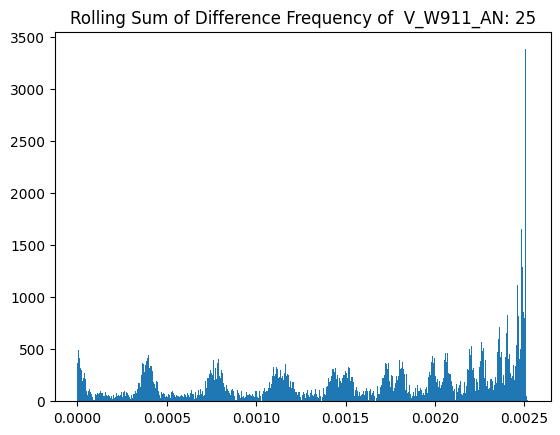

******************************************************************************


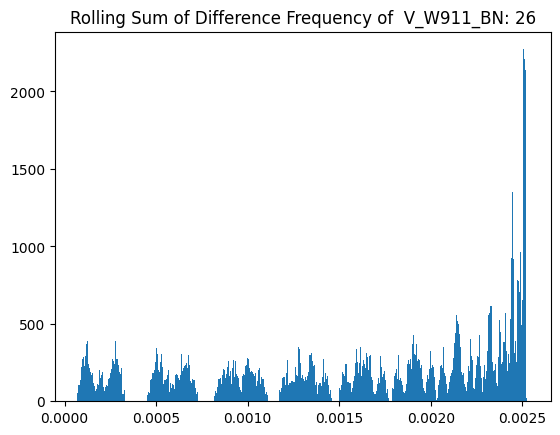

******************************************************************************


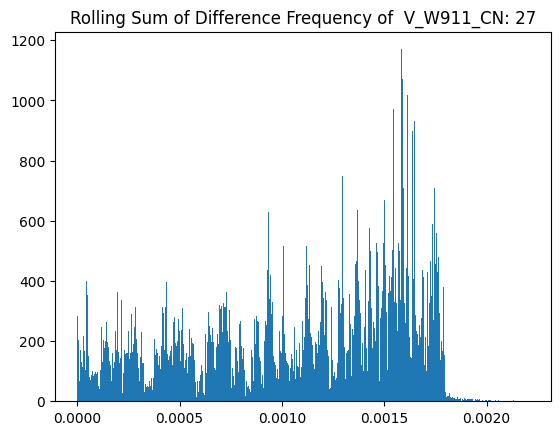

******************************************************************************


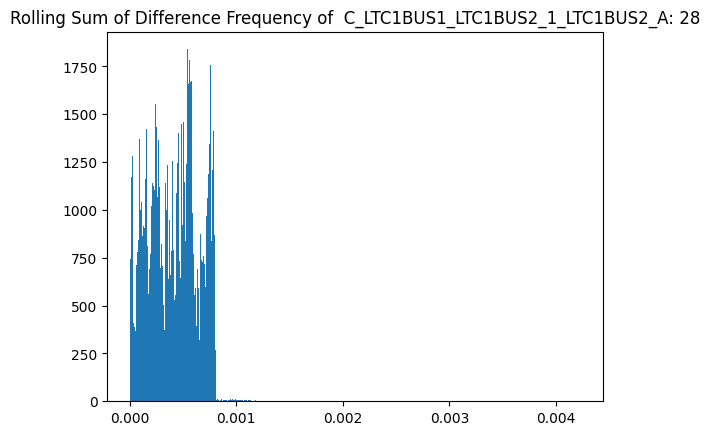

******************************************************************************


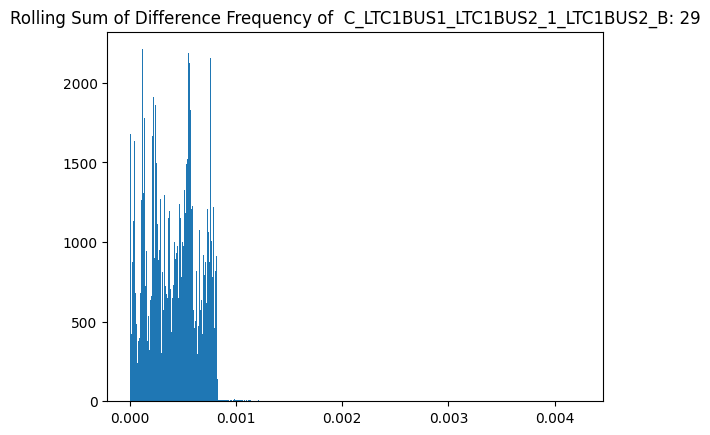

******************************************************************************


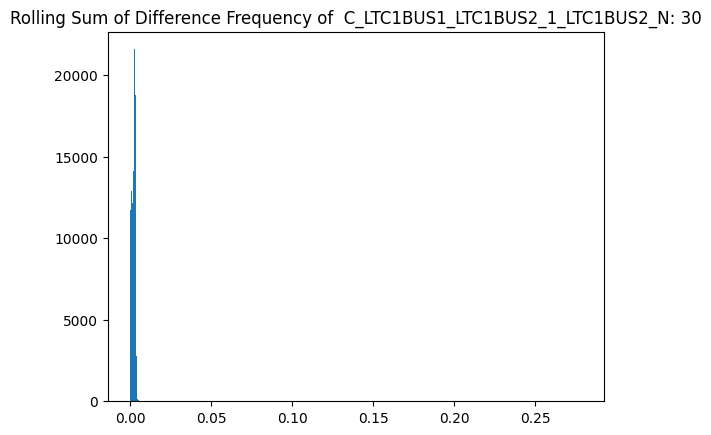

******************************************************************************


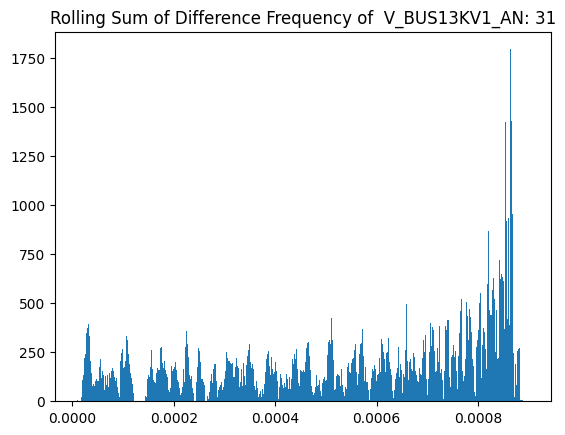

******************************************************************************


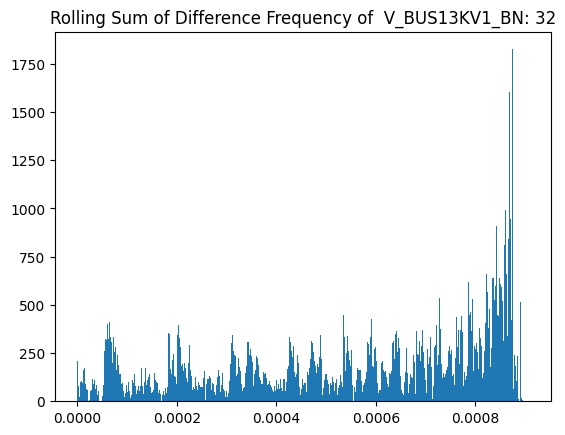

******************************************************************************


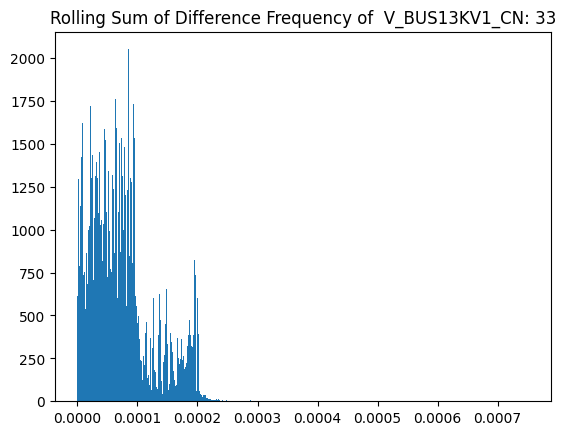

******************************************************************************


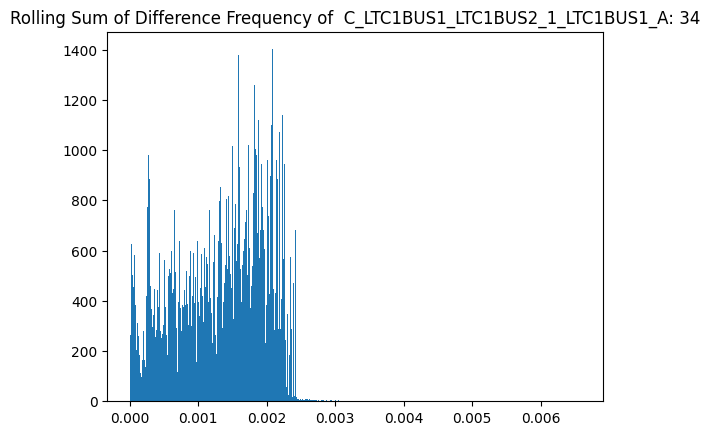

******************************************************************************


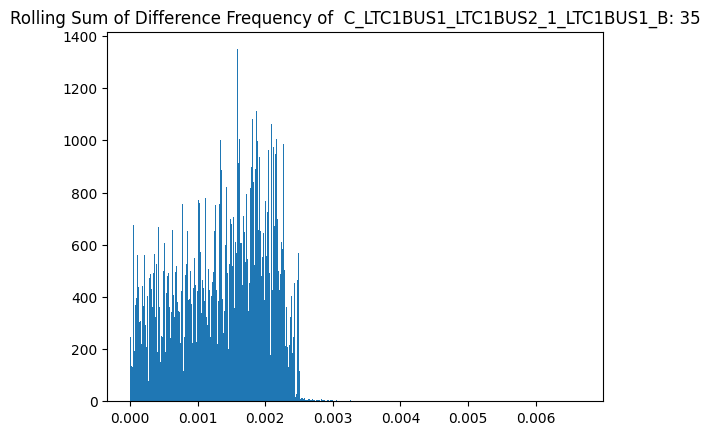

******************************************************************************


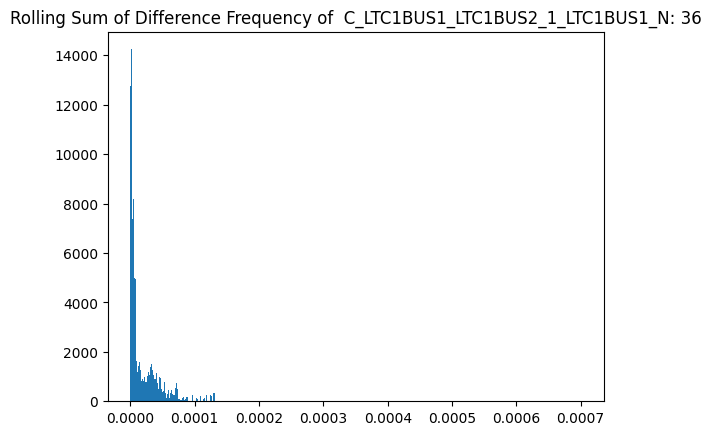

******************************************************************************


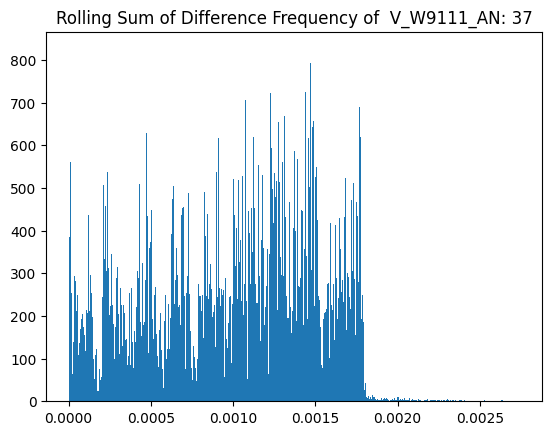

******************************************************************************


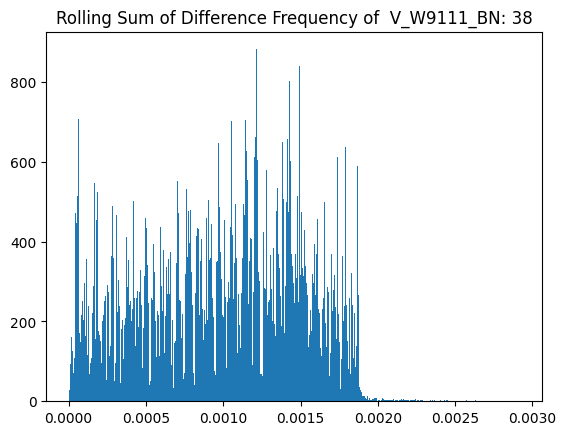

******************************************************************************


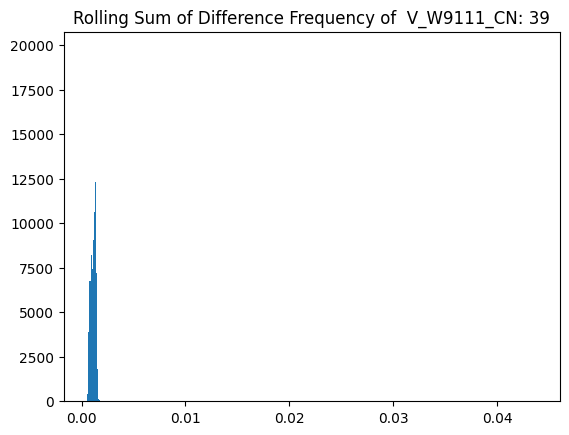

******************************************************************************


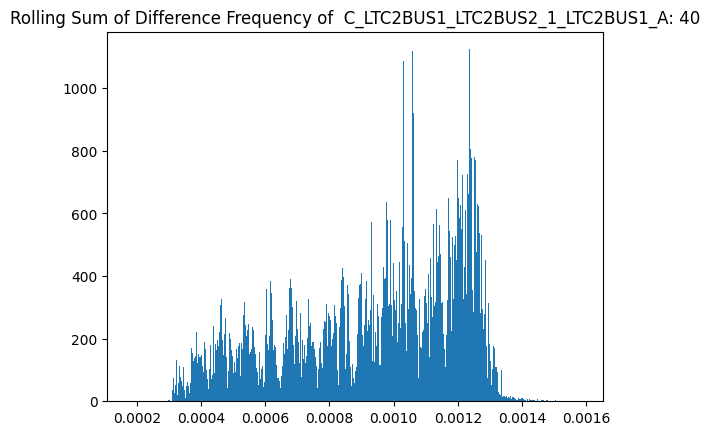

******************************************************************************


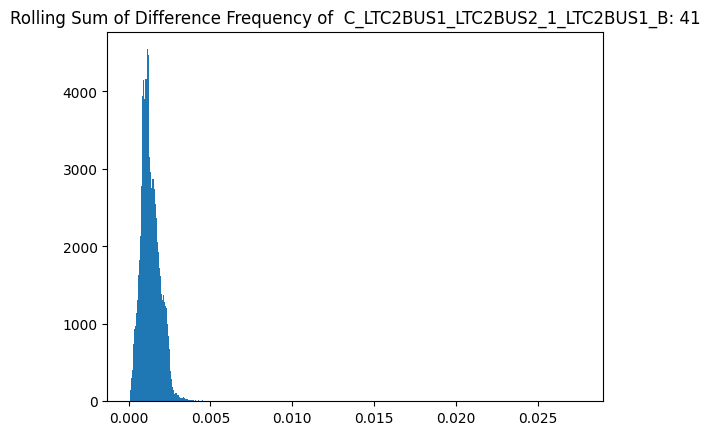

******************************************************************************


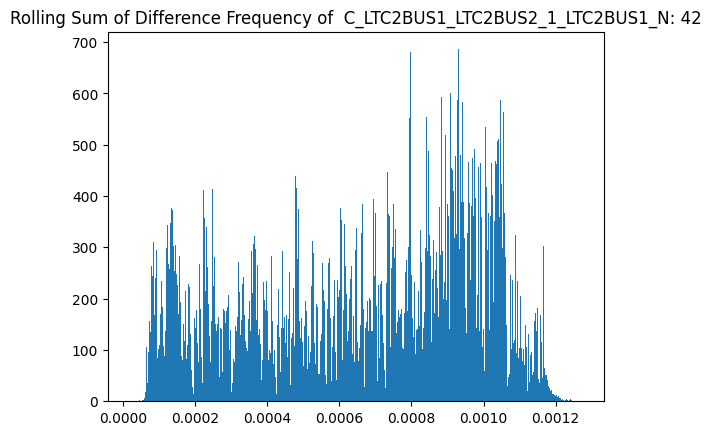

******************************************************************************


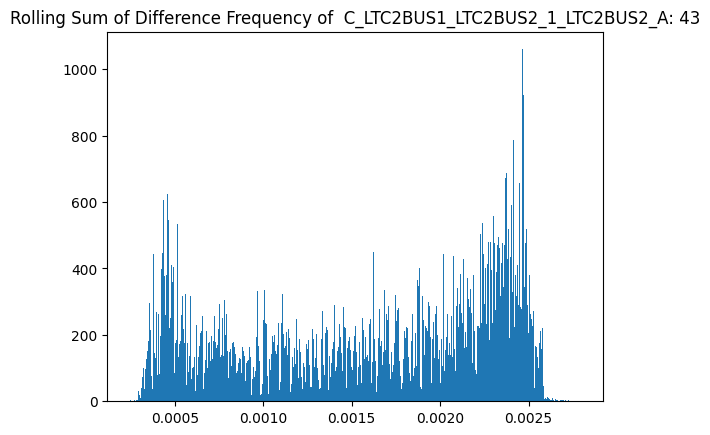

******************************************************************************


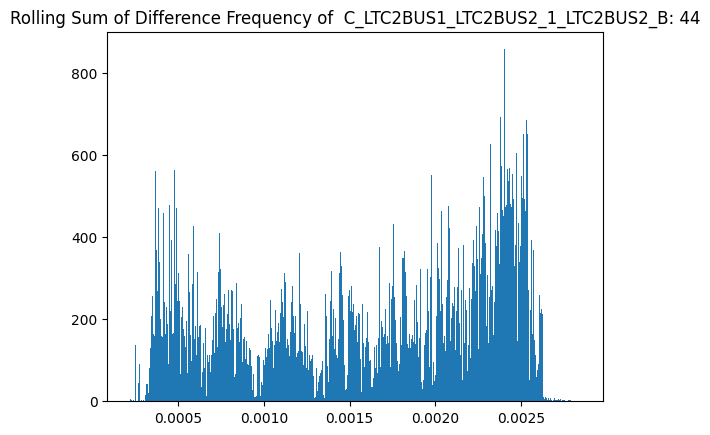

******************************************************************************


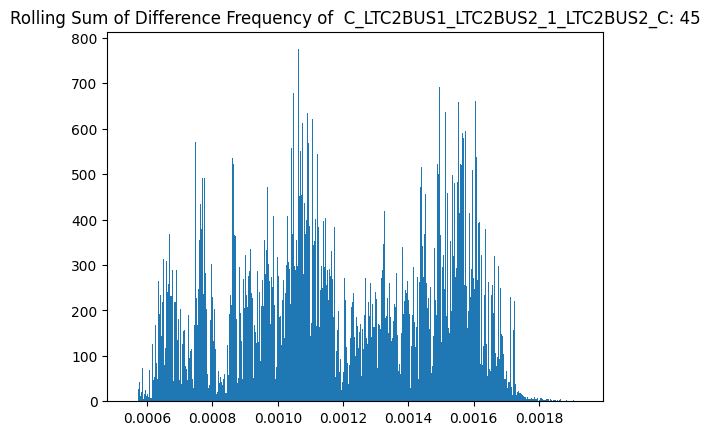

******************************************************************************


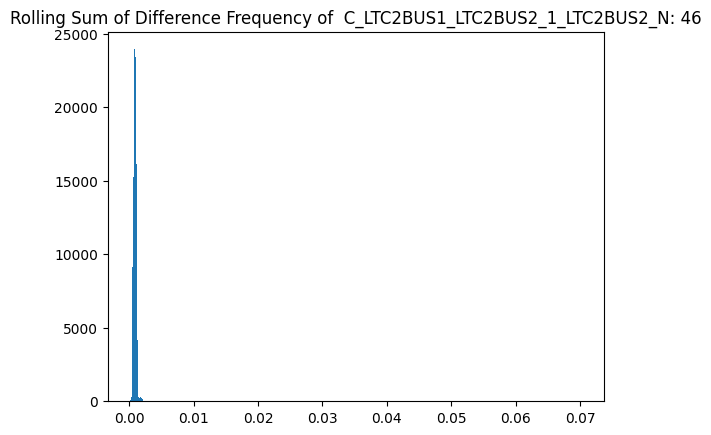

******************************************************************************


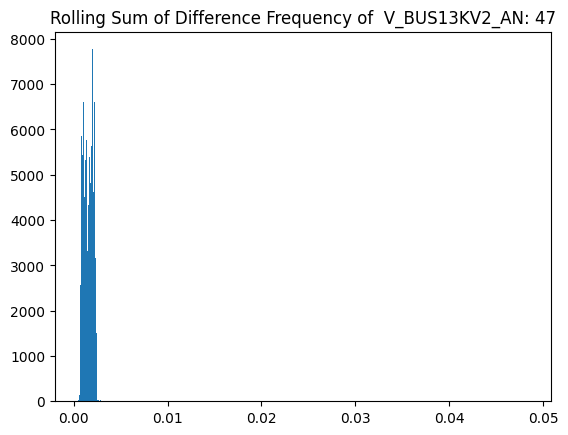

******************************************************************************
[nan nan nan ... nan nan nan]
[48]


/usr/local/lib/python3.10/dist-packages/matplotlib/axes/_axes.py:6762: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
/usr/local/lib/python3.10/dist-packages/matplotlib/axes/_axes.py:6763: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))


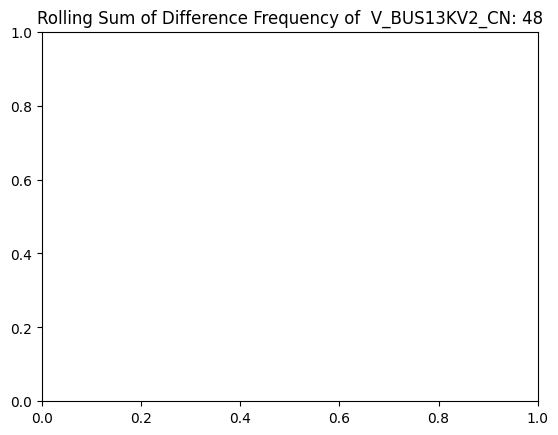

******************************************************************************
[nan nan nan ... nan nan nan]
[49]


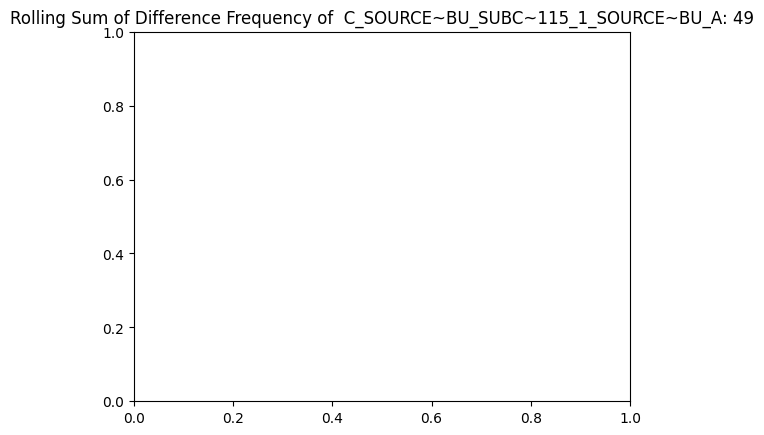

******************************************************************************


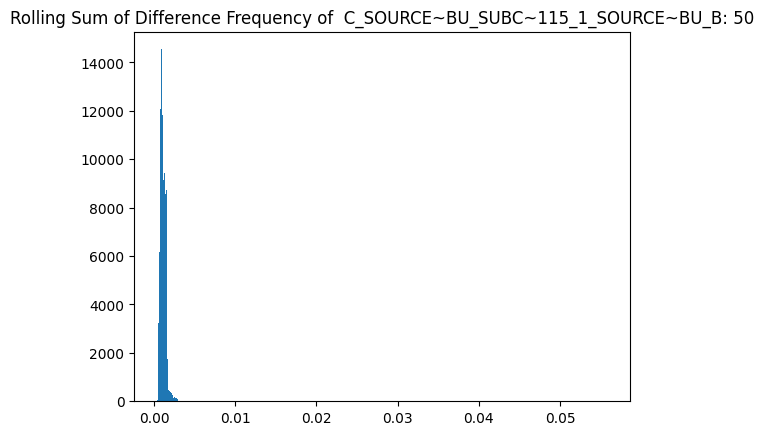

******************************************************************************


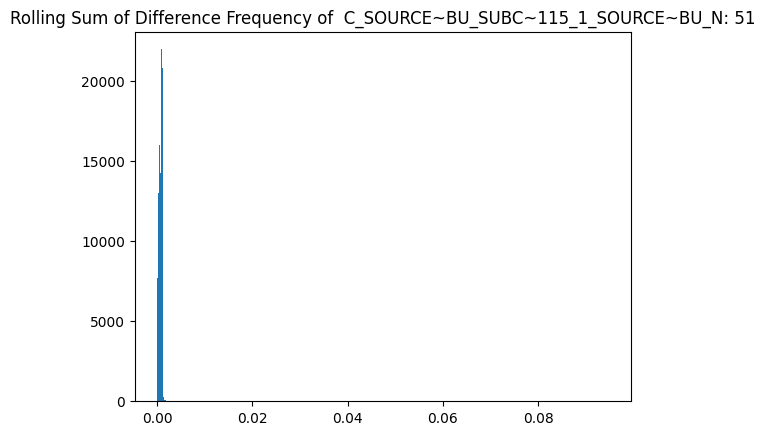

******************************************************************************


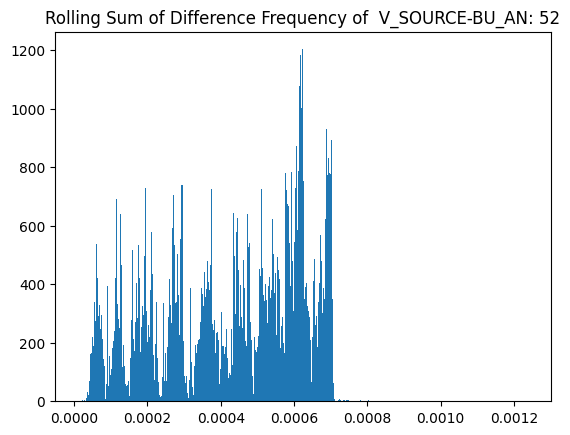

******************************************************************************


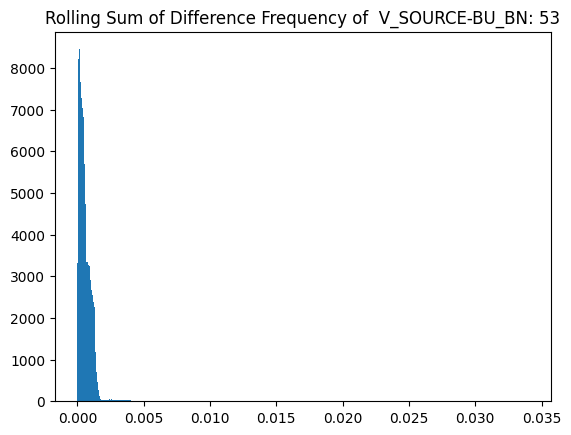

******************************************************************************


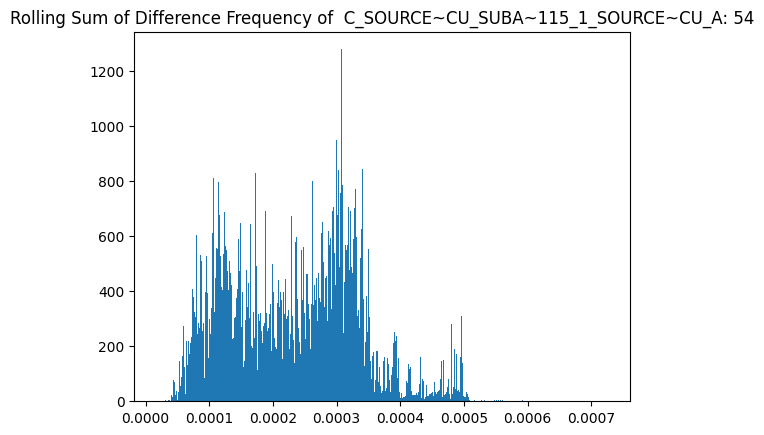

******************************************************************************


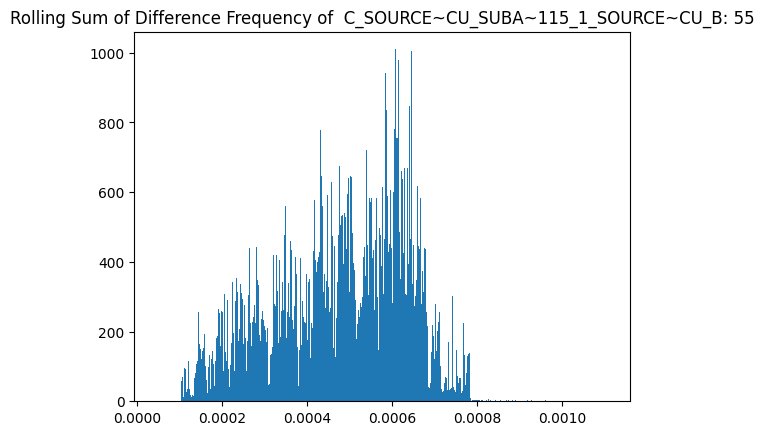

******************************************************************************


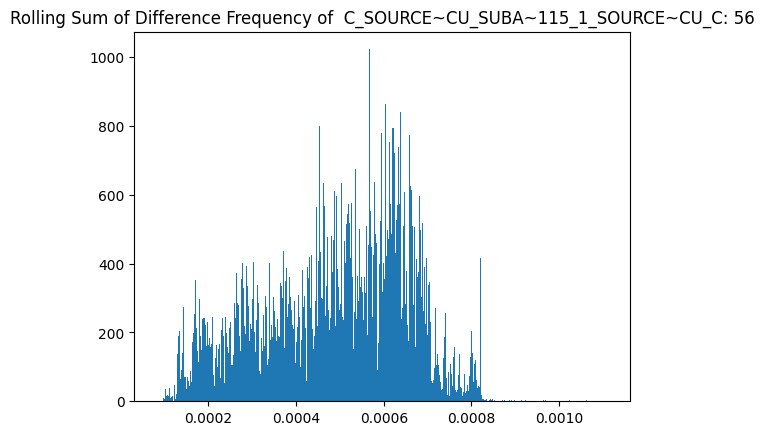

******************************************************************************
[nan nan nan ... nan nan nan]
[57]


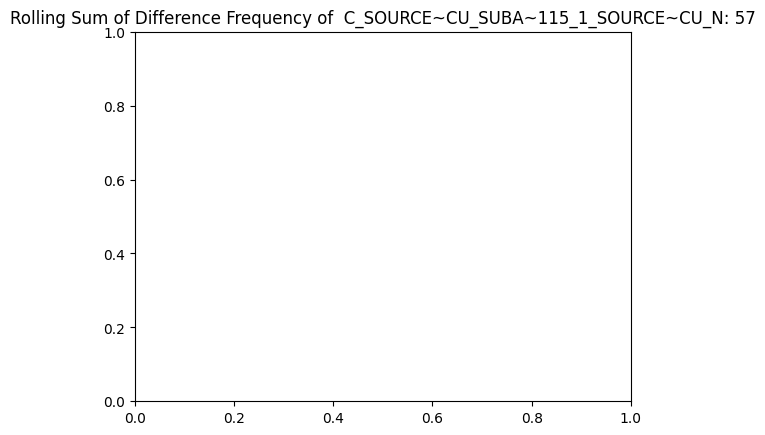

******************************************************************************
[nan nan nan ... nan nan nan]
[58]


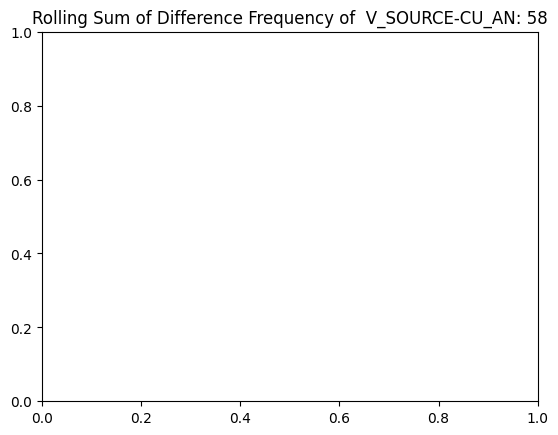

******************************************************************************


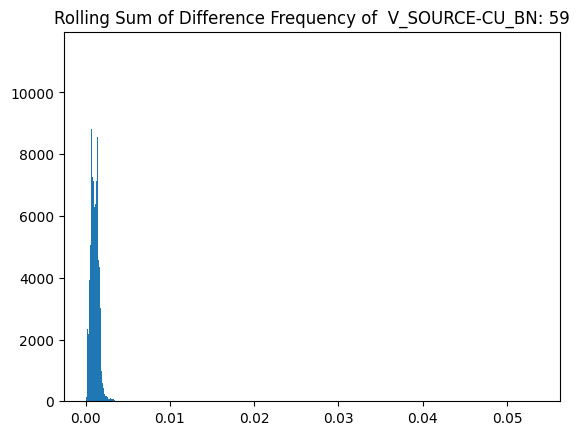

******************************************************************************


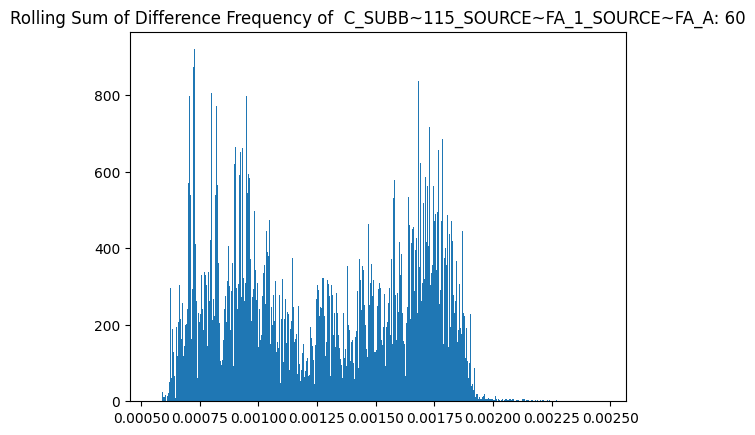

******************************************************************************


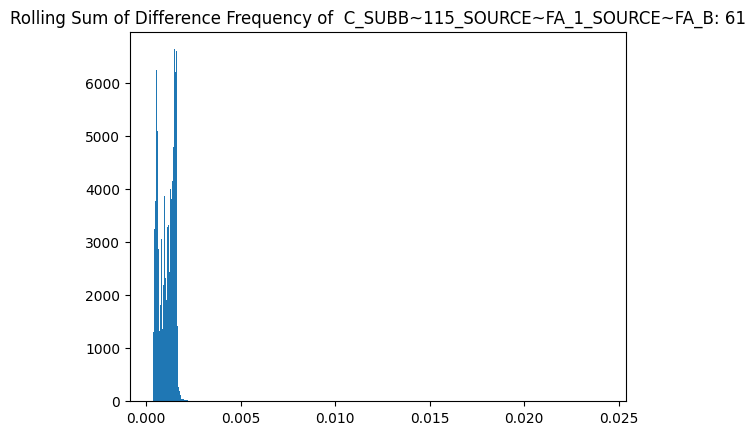

******************************************************************************


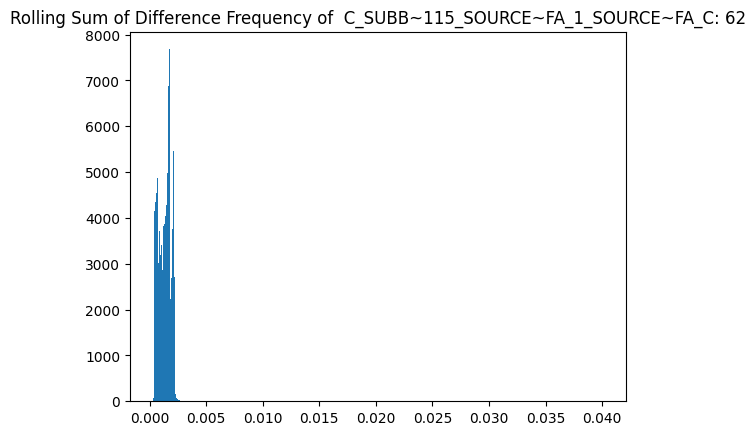

******************************************************************************


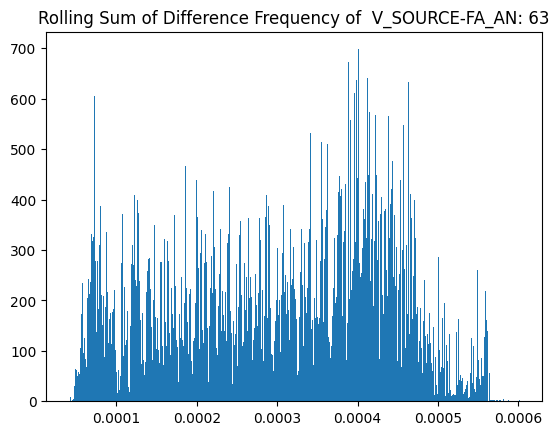

******************************************************************************


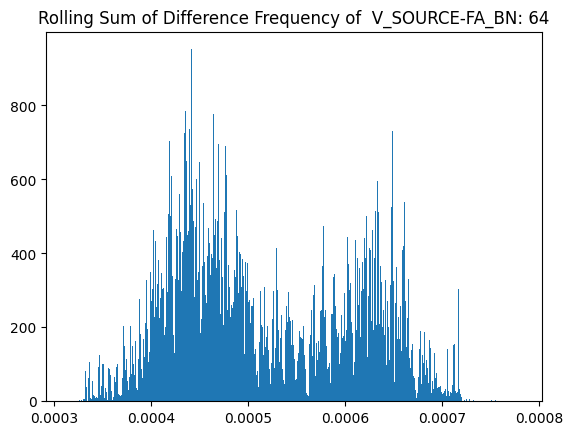

******************************************************************************


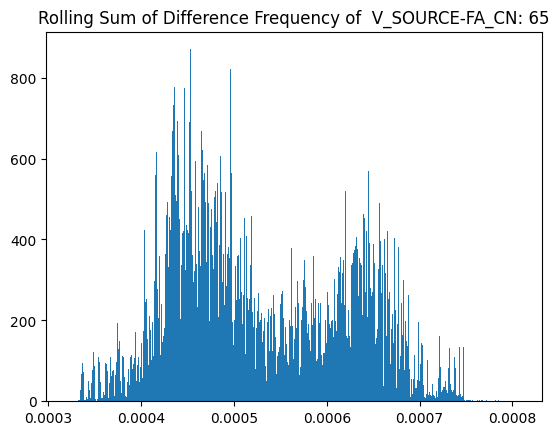

******************************************************************************


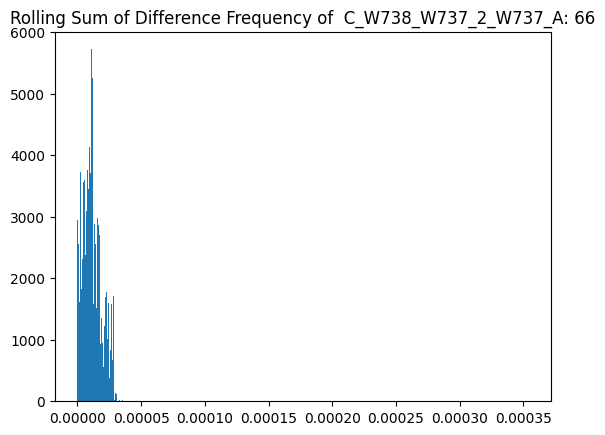

******************************************************************************


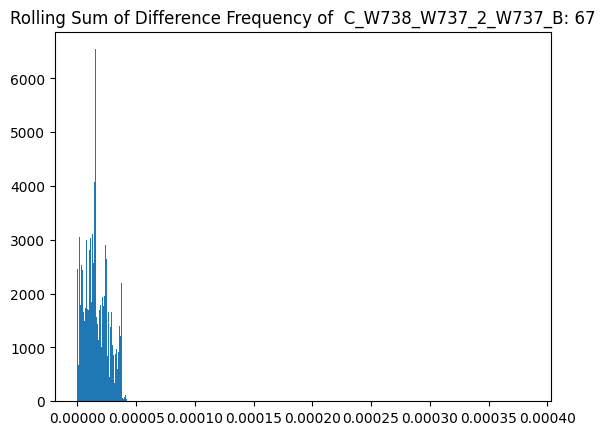

******************************************************************************


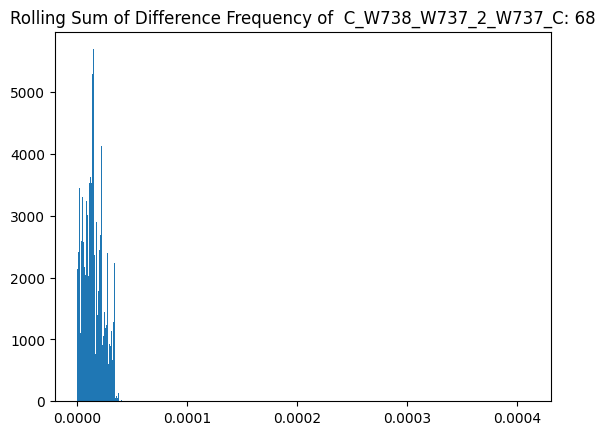

******************************************************************************


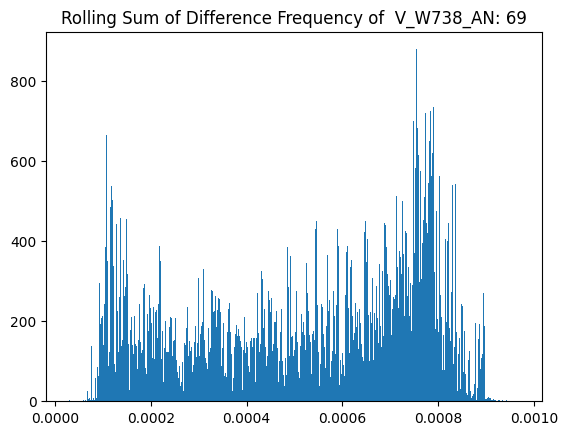

******************************************************************************


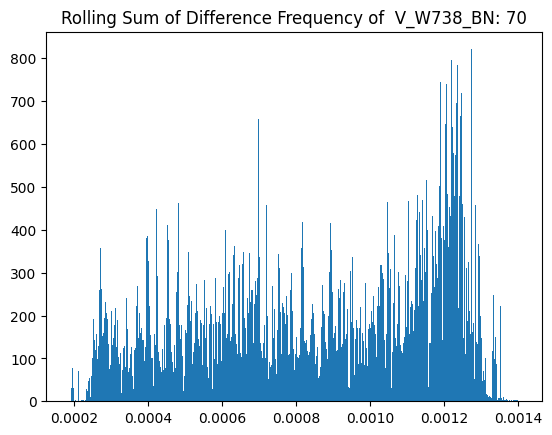

******************************************************************************


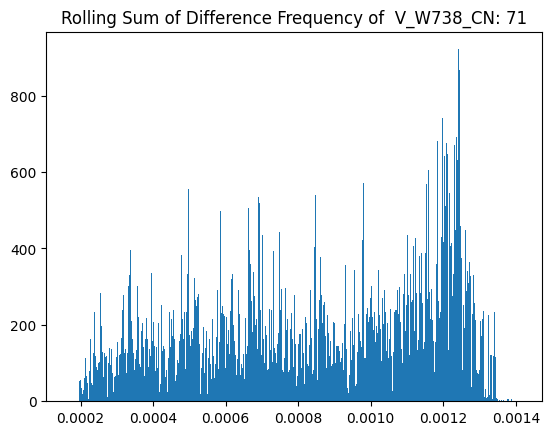

******************************************************************************
[nan nan nan ... nan nan nan]
[72]


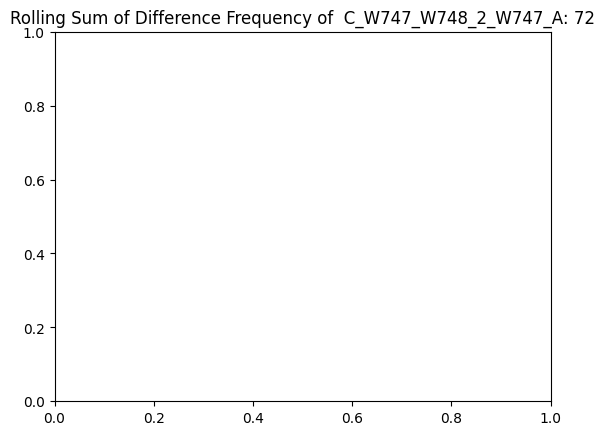

******************************************************************************
[nan nan nan ... nan nan nan]
[73]


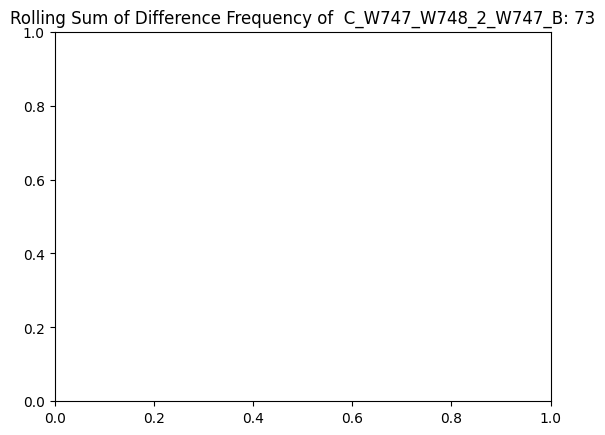

******************************************************************************


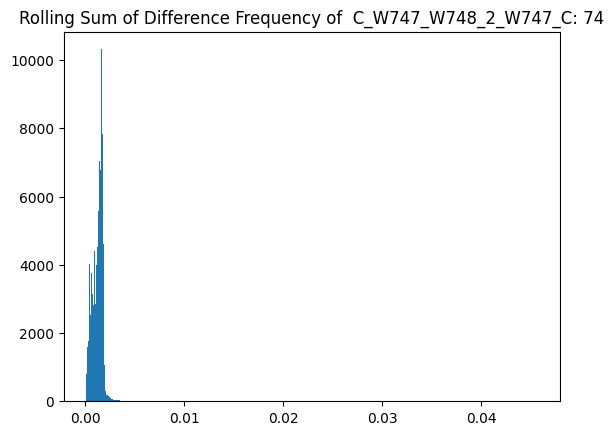

******************************************************************************


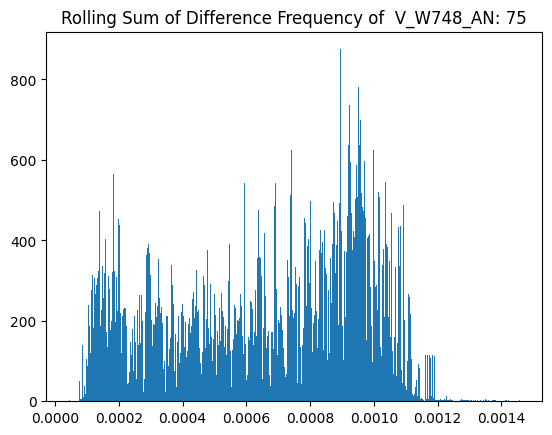

******************************************************************************


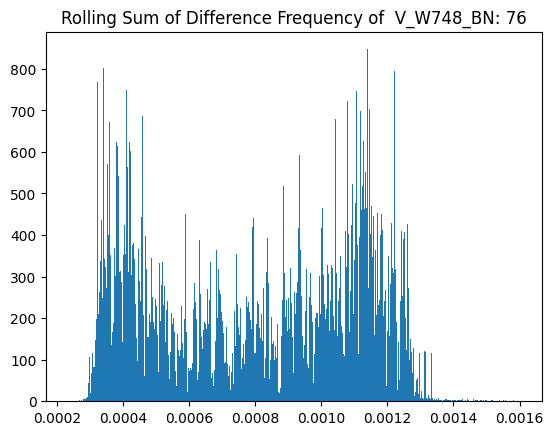

******************************************************************************


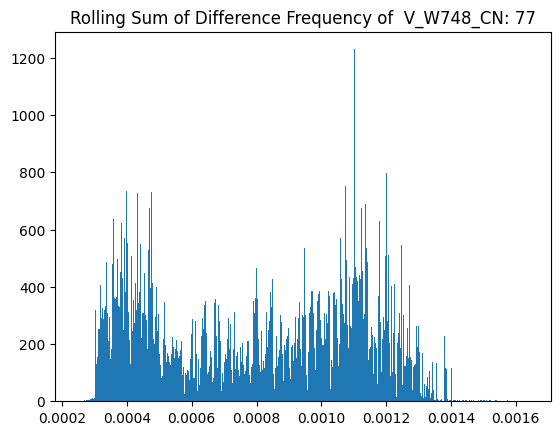

******************************************************************************


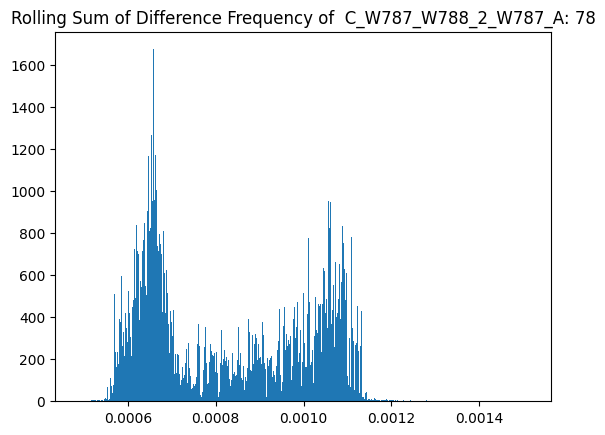

******************************************************************************


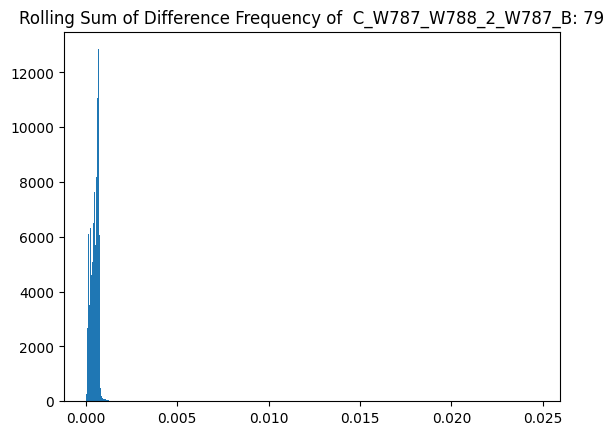

******************************************************************************


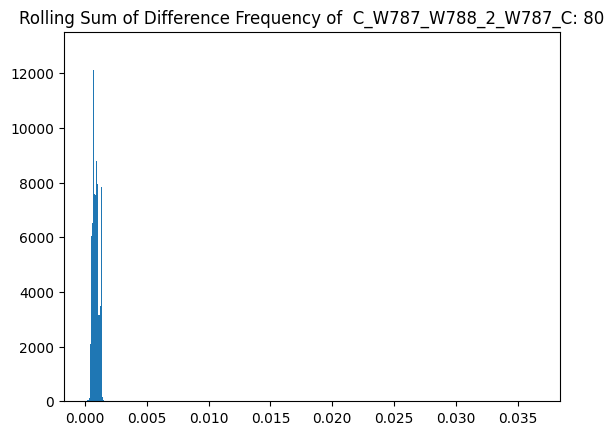

******************************************************************************


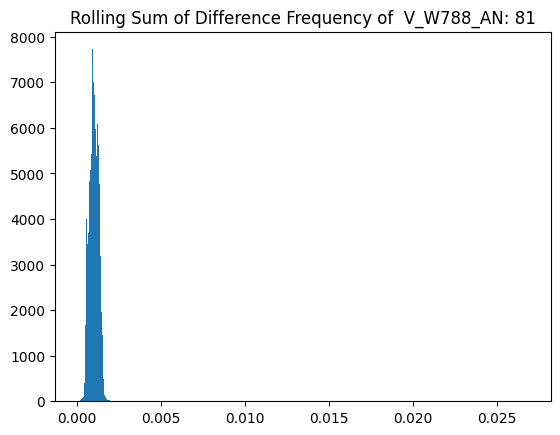

******************************************************************************


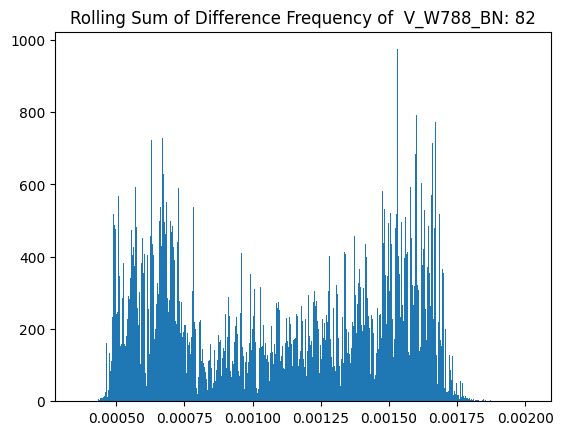

******************************************************************************


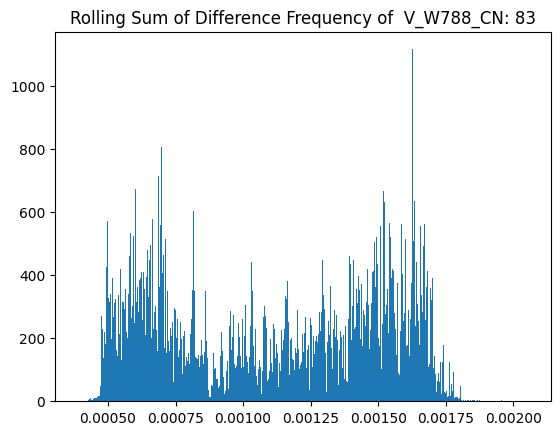

******************************************************************************


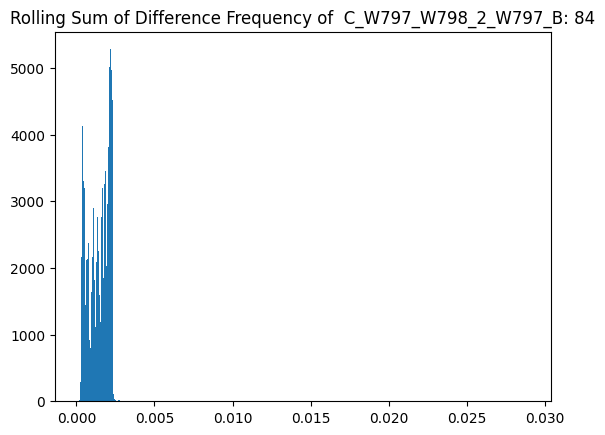

******************************************************************************


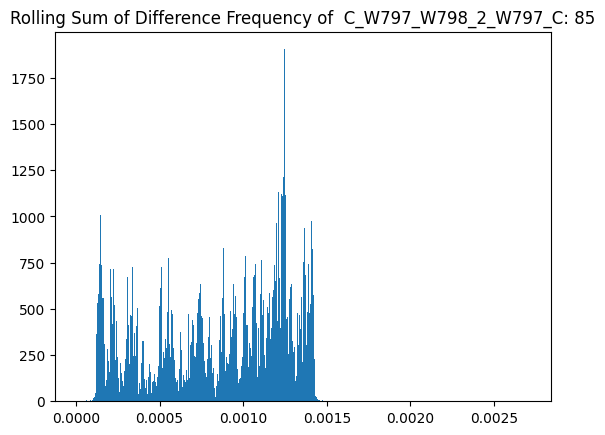

******************************************************************************


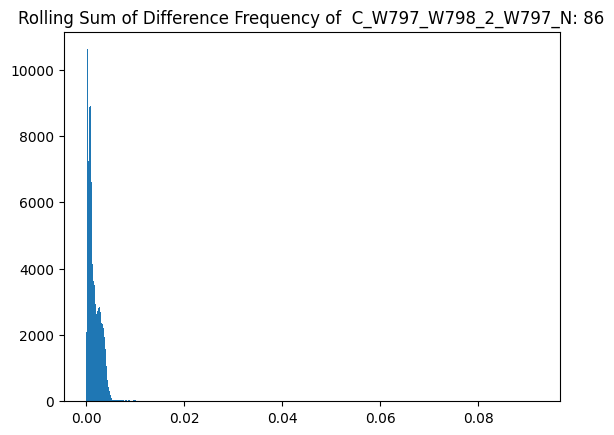

******************************************************************************
[nan nan nan ... nan nan nan]
[87]


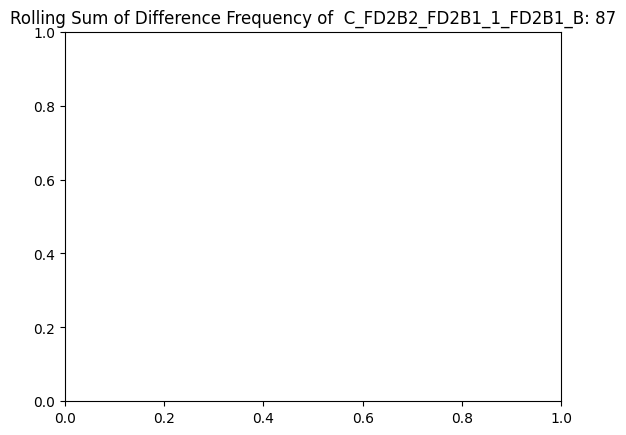

******************************************************************************
[nan nan nan ... nan nan nan]
[88]


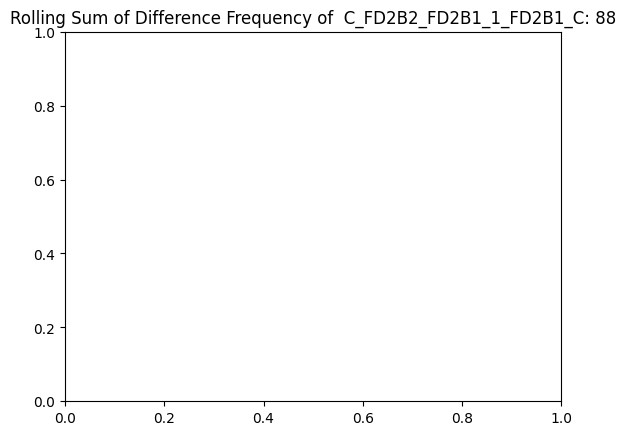

******************************************************************************


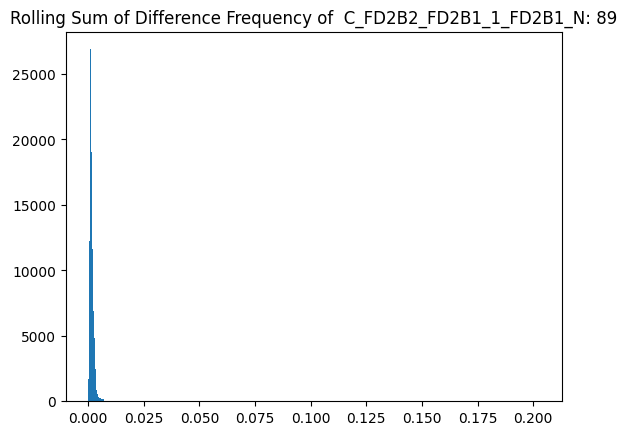

******************************************************************************


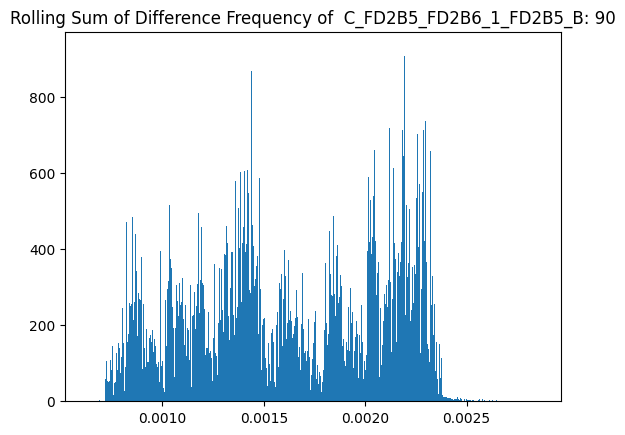

******************************************************************************


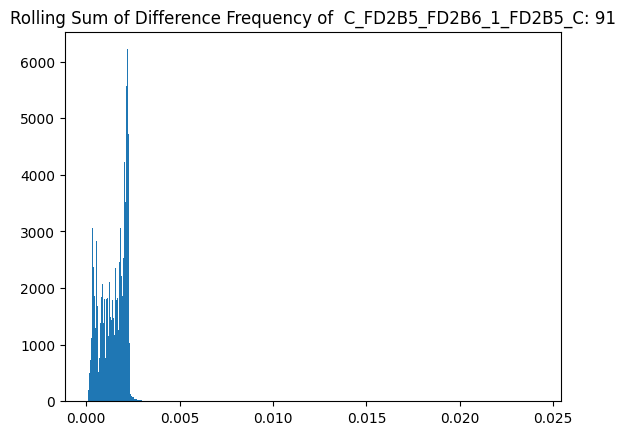

******************************************************************************


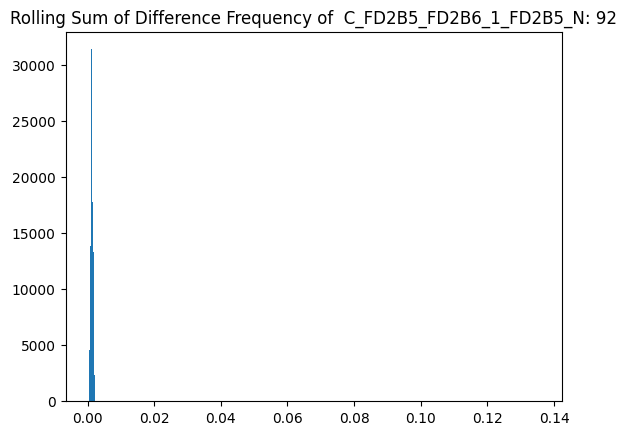

******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
****************************************************

In [44]:
window = 350
w = 1
cols = data.columns

corr_fn = correlation_pair
thresholds_corr, corr_multi_list = get_threshold_stat_only(data, corr_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=1, axis=1, stat_list=None, plot=True, collate_fn="sum")
thresholds_corr_99, corr_multi_list = get_threshold_stat_only(data, corr_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=0.99, axis=1, stat_list=corr_multi_list, collate_fn="sum")
thresholds_corr_95, corr_multi_list = get_threshold_stat_only(data, corr_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=0.95, axis=1, stat_list=corr_multi_list, collate_fn="sum")

In [45]:
len(thresholds_corr)

93

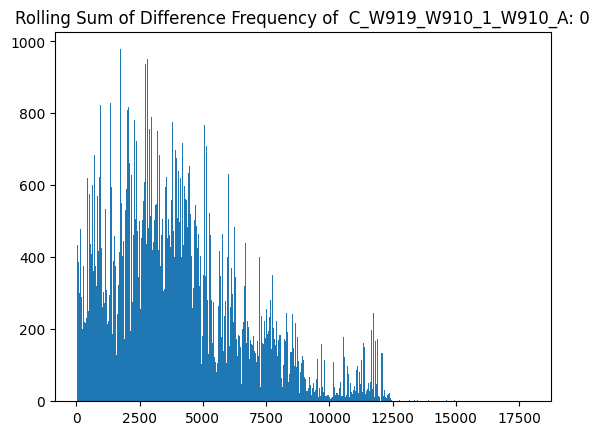

******************************************************************************


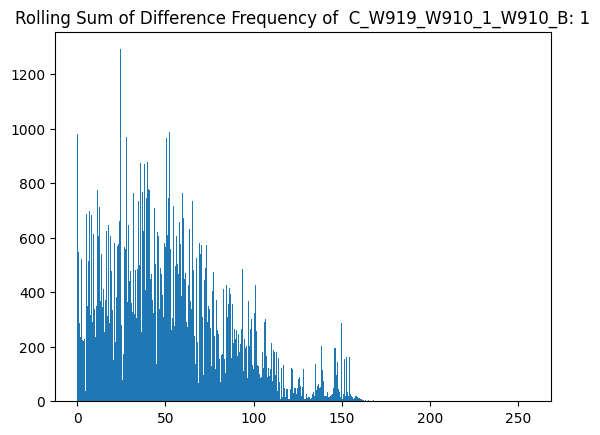

******************************************************************************


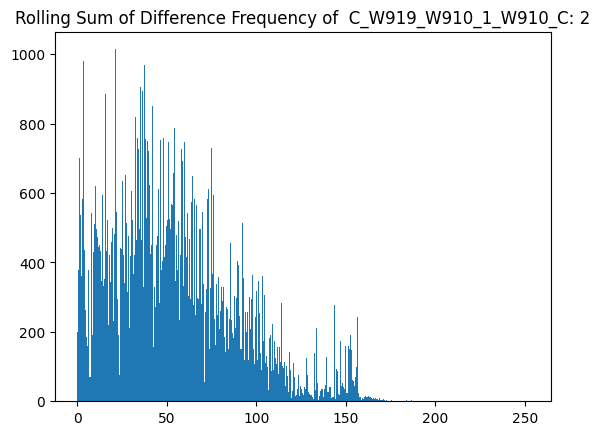

******************************************************************************


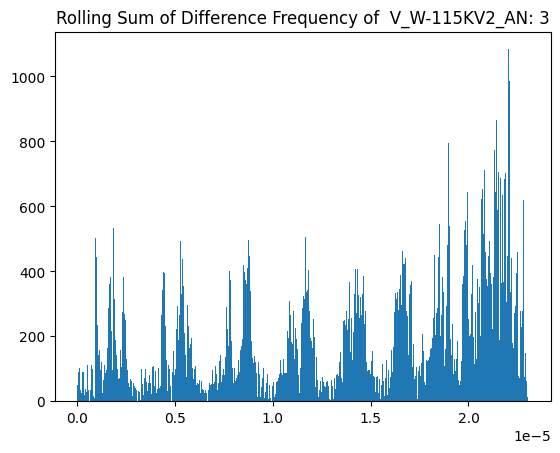

******************************************************************************


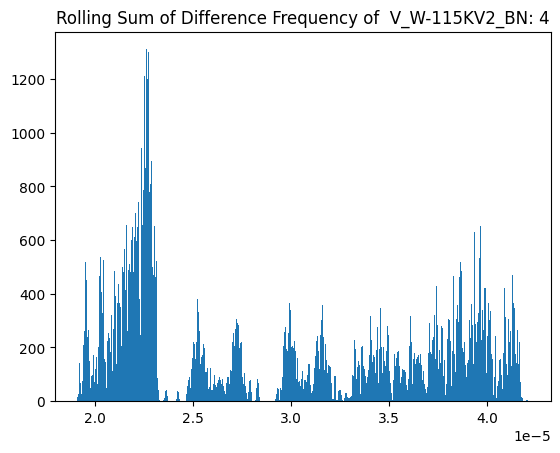

******************************************************************************


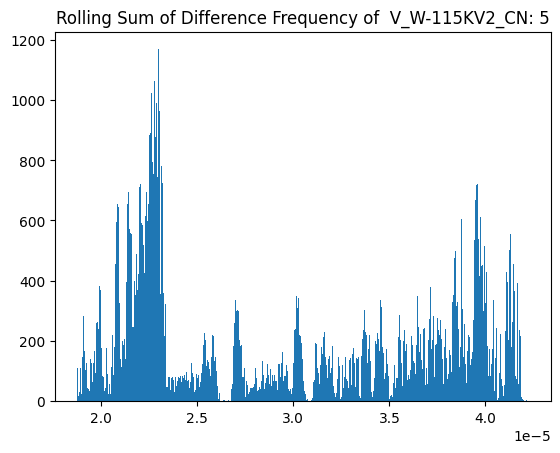

******************************************************************************


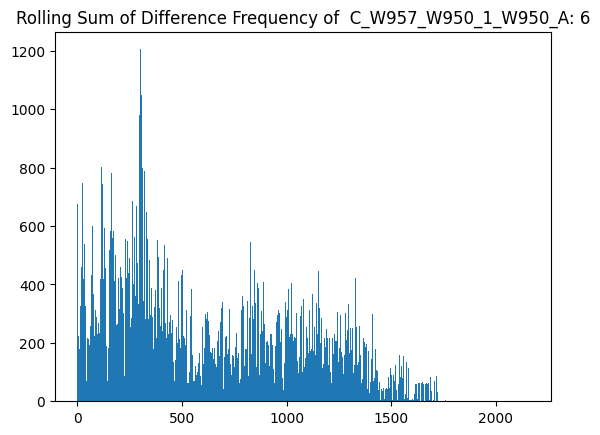

******************************************************************************


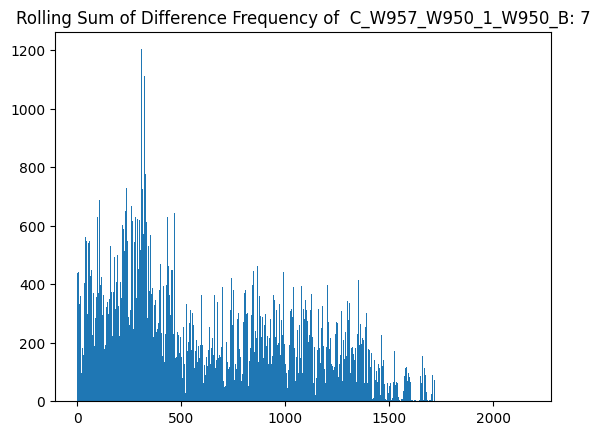

******************************************************************************


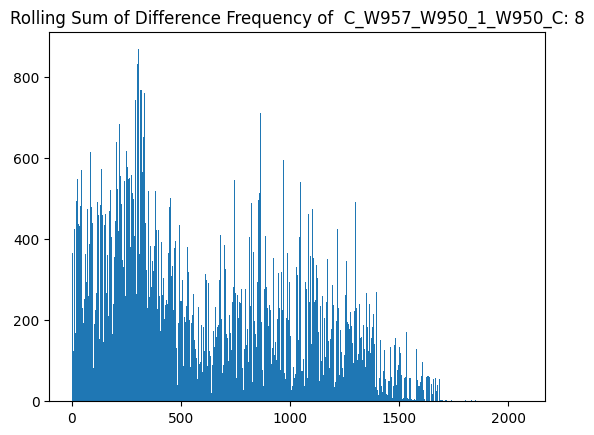

******************************************************************************


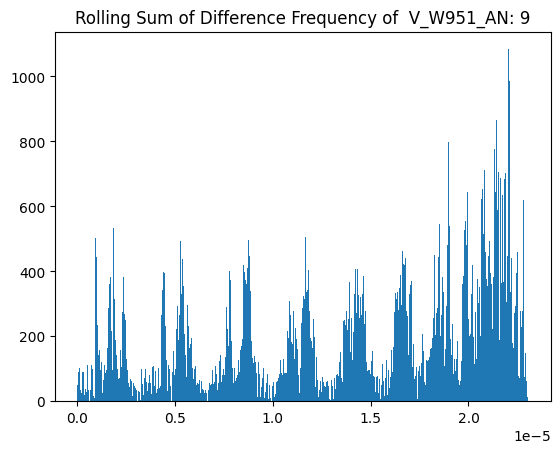

******************************************************************************


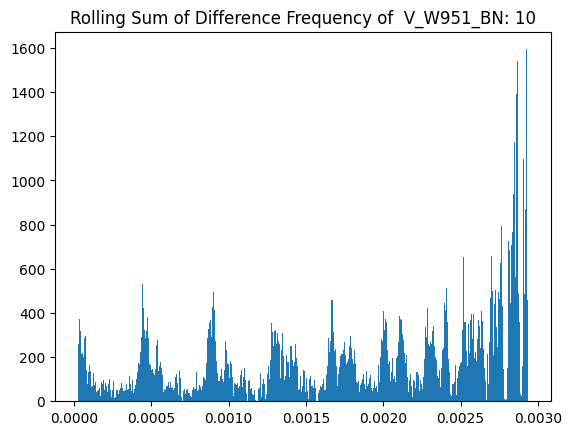

******************************************************************************


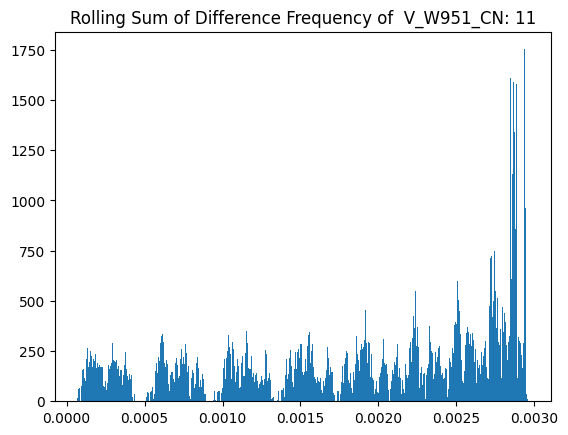

******************************************************************************


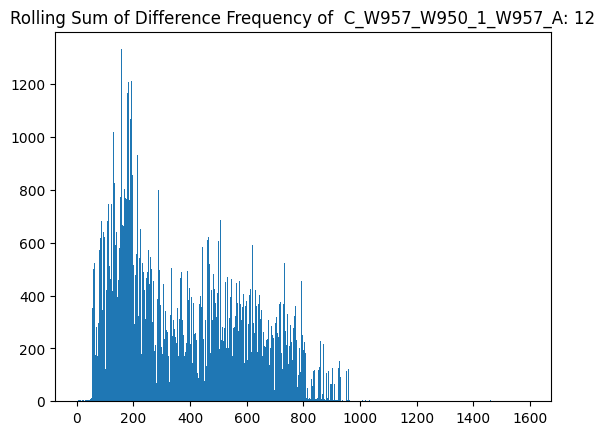

******************************************************************************


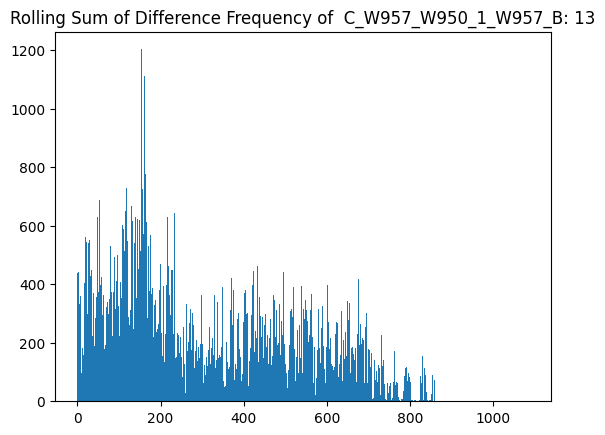

******************************************************************************


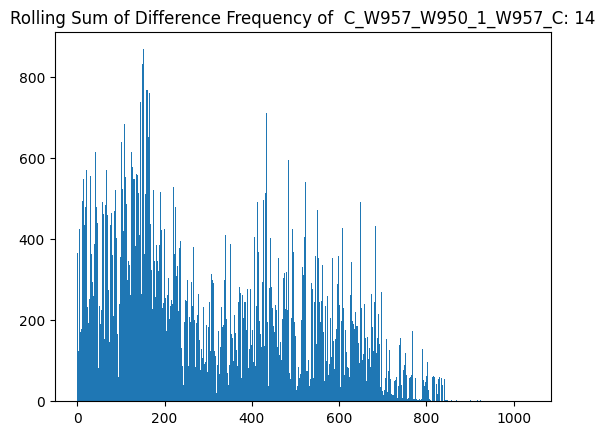

******************************************************************************


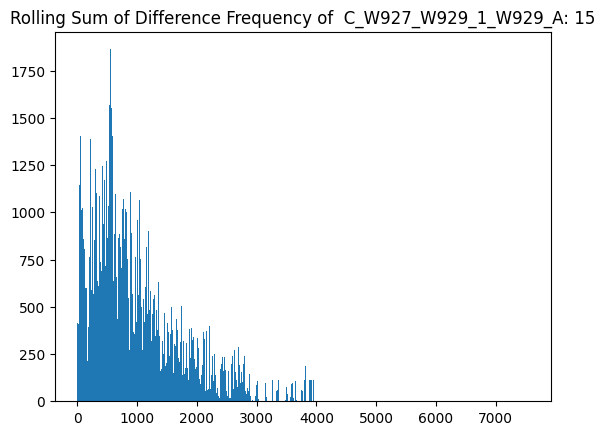

******************************************************************************


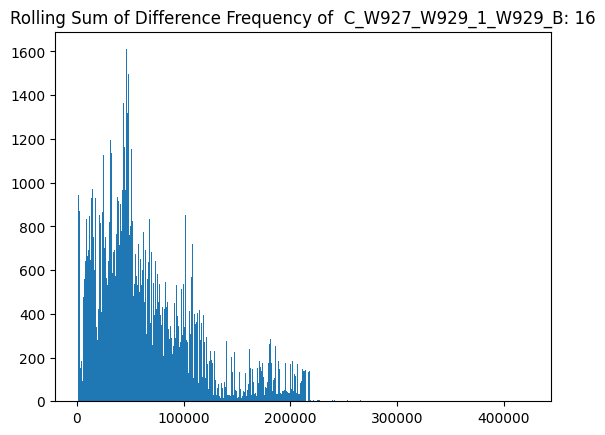

******************************************************************************


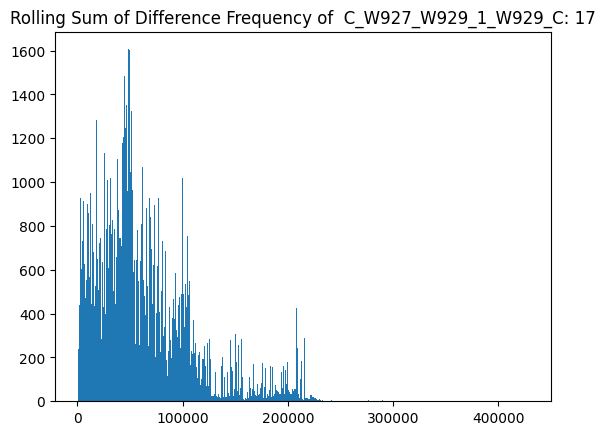

******************************************************************************


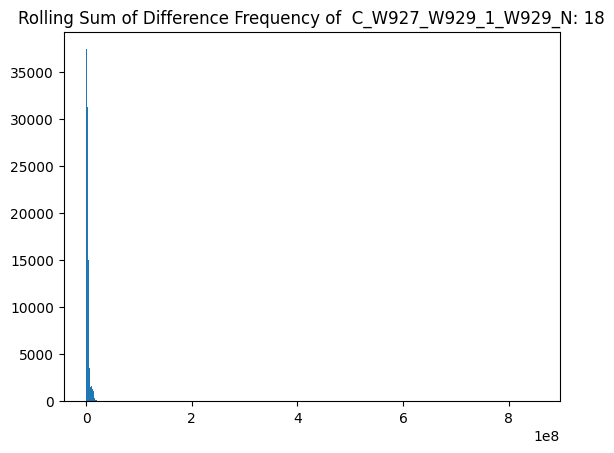

******************************************************************************


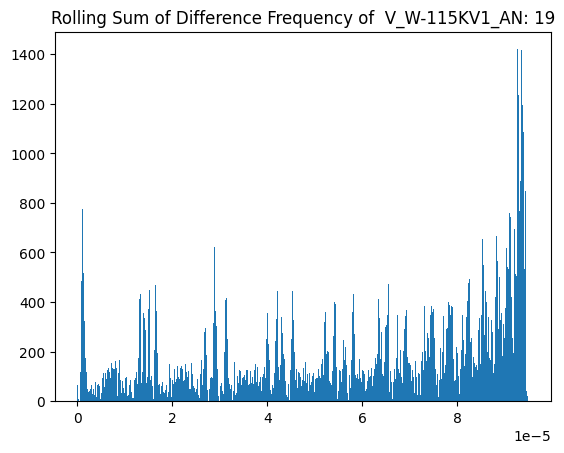

******************************************************************************


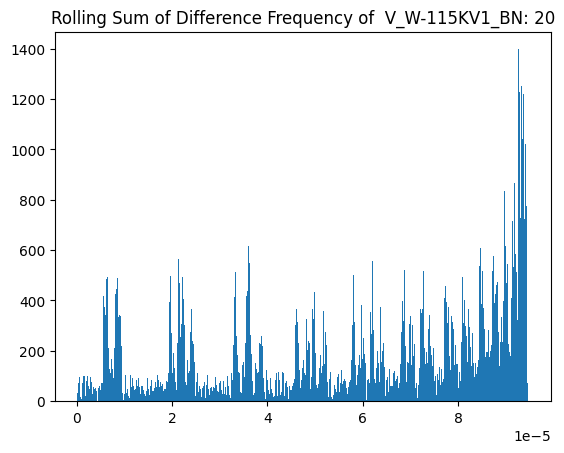

******************************************************************************


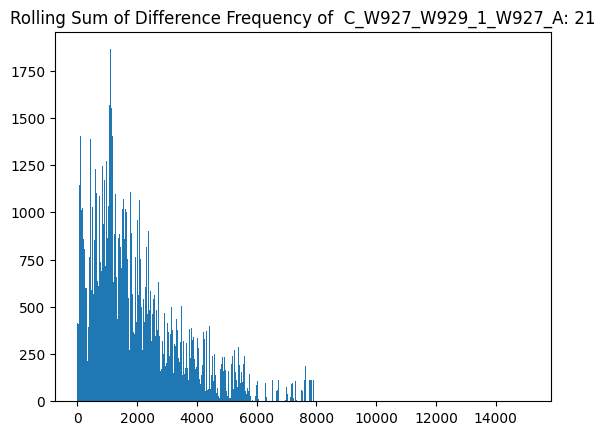

******************************************************************************


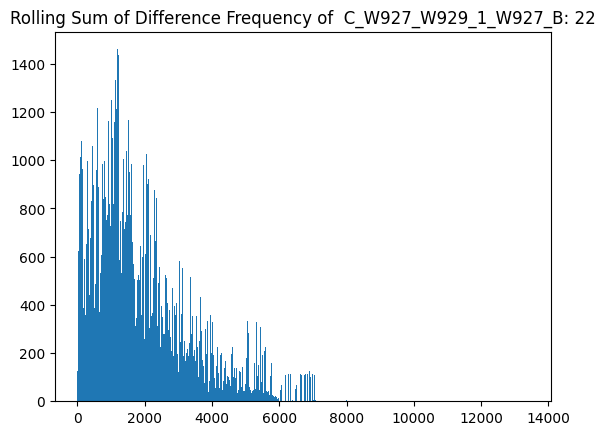

******************************************************************************


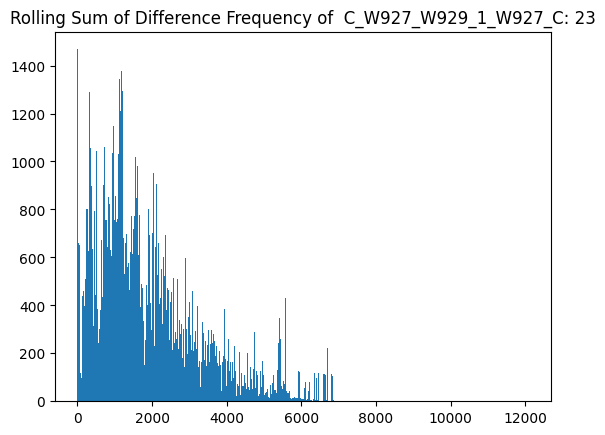

******************************************************************************


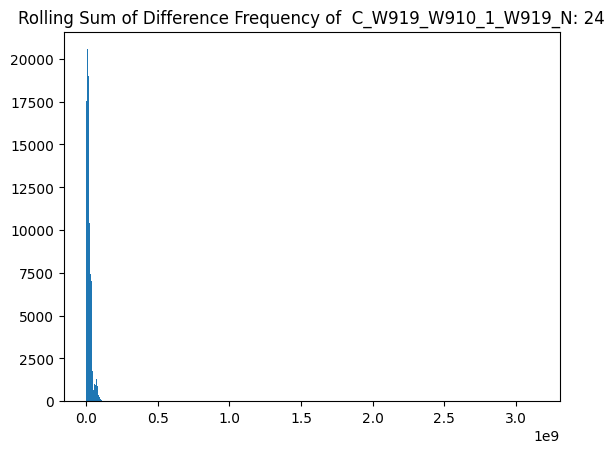

******************************************************************************


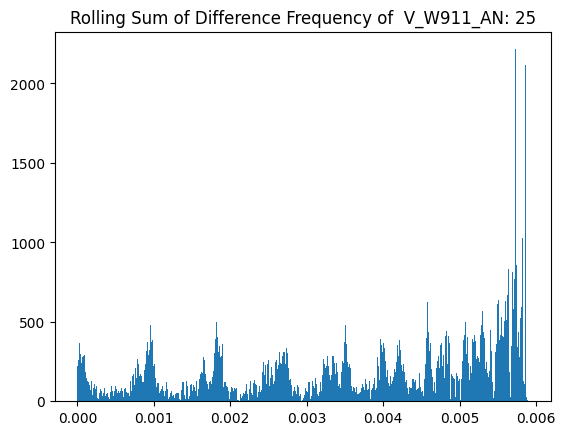

******************************************************************************


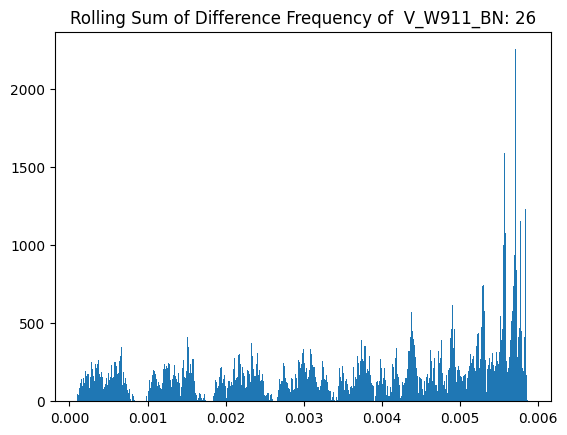

******************************************************************************


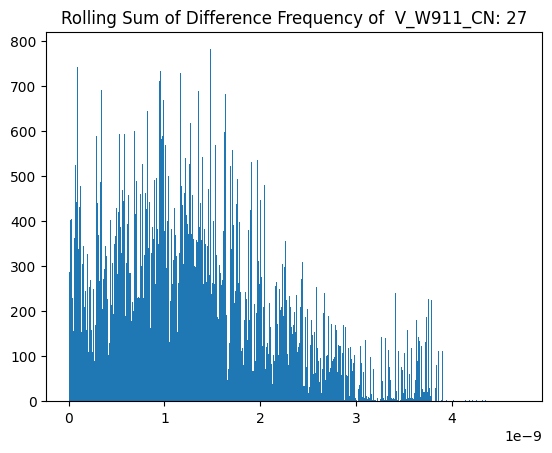

******************************************************************************


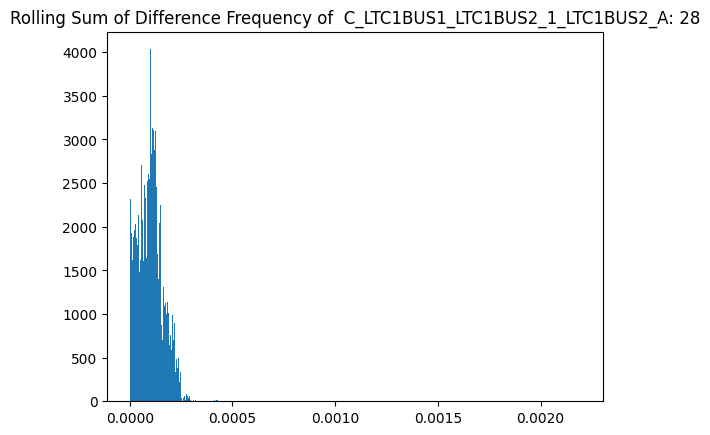

******************************************************************************


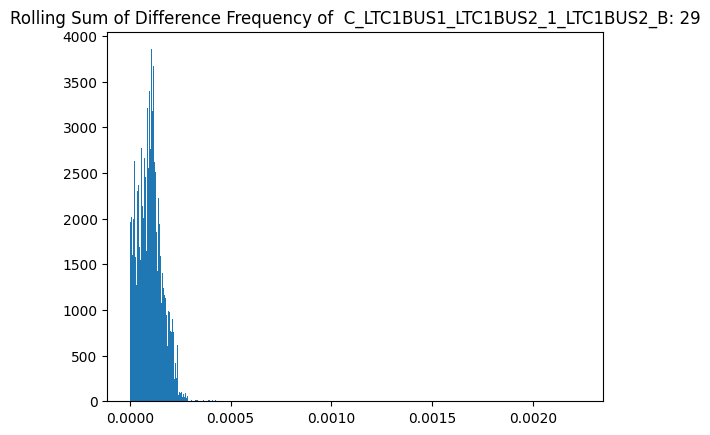

******************************************************************************


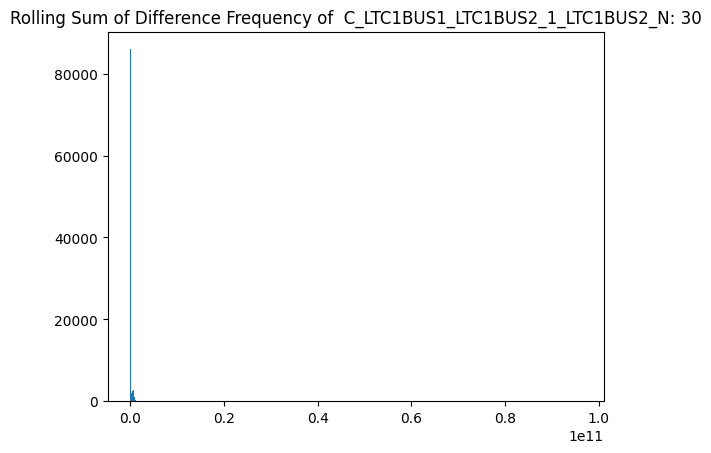

******************************************************************************


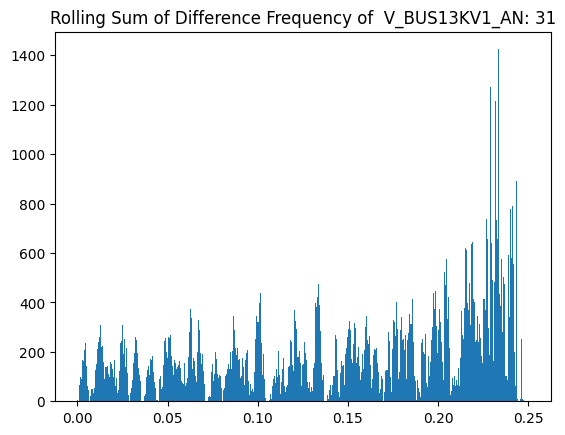

******************************************************************************


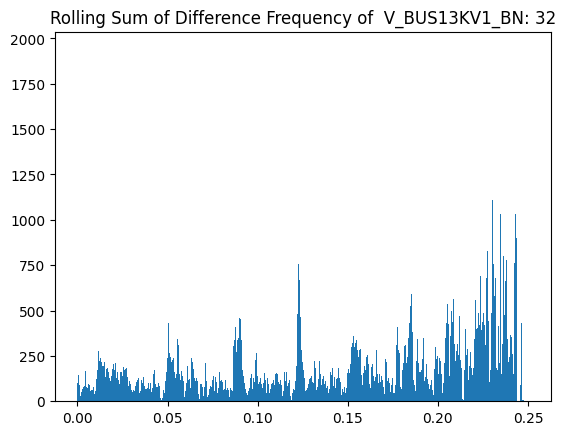

******************************************************************************


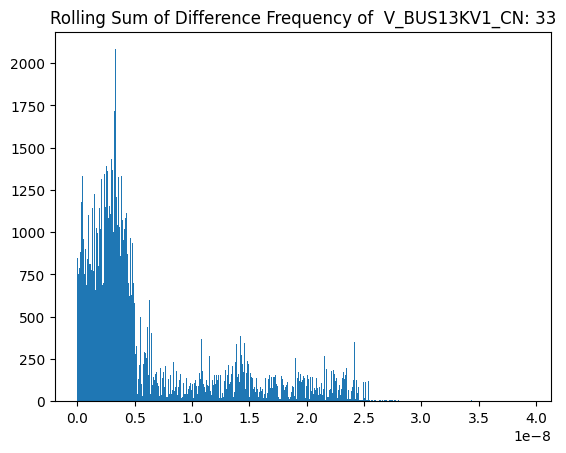

******************************************************************************


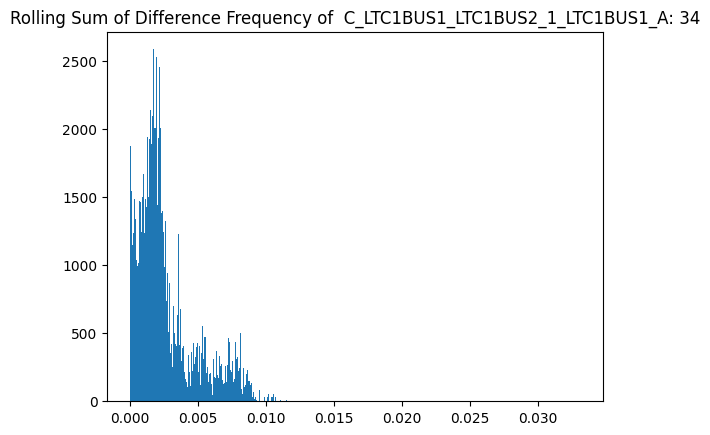

******************************************************************************


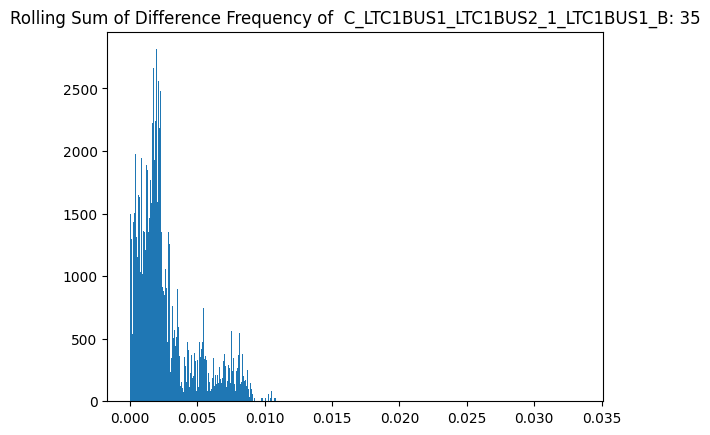

******************************************************************************


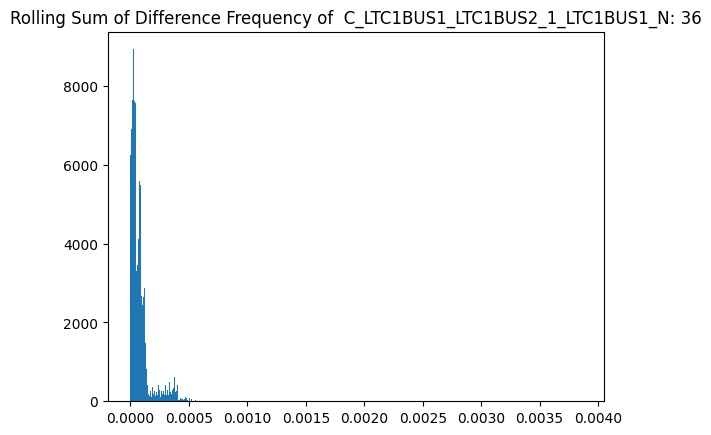

******************************************************************************


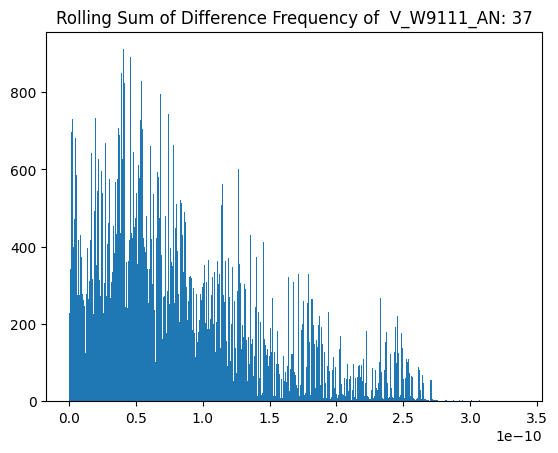

******************************************************************************


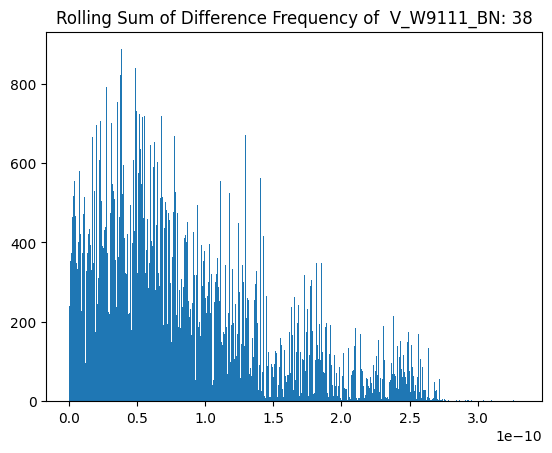

******************************************************************************


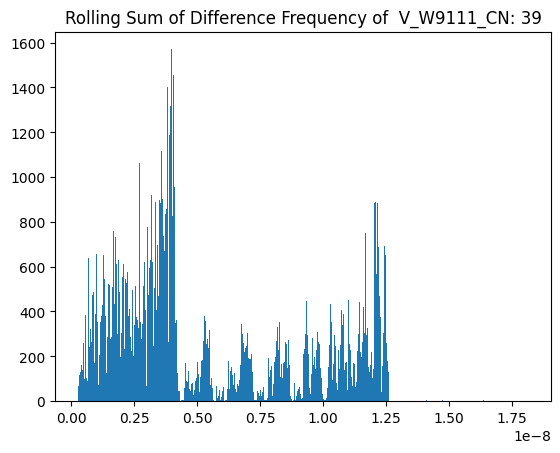

******************************************************************************


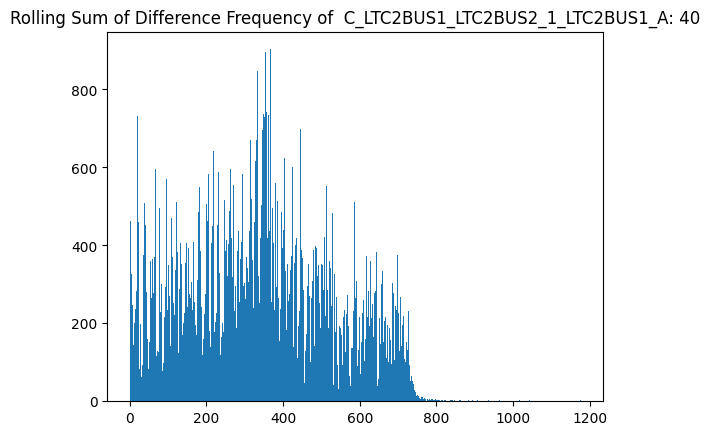

******************************************************************************


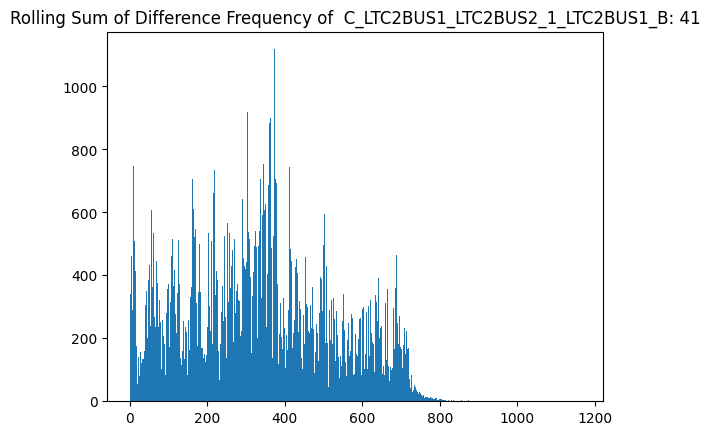

******************************************************************************


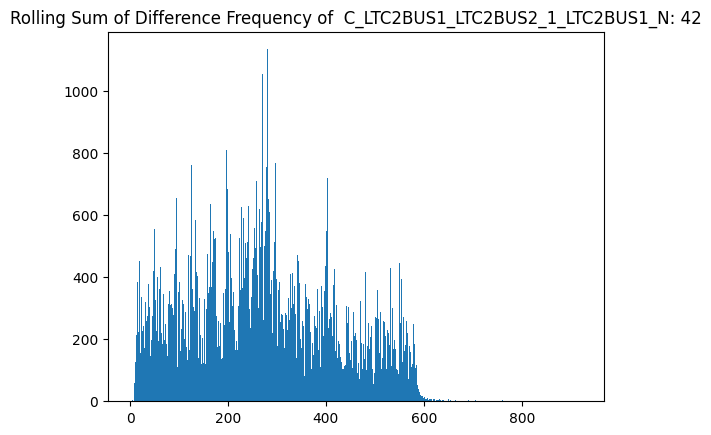

******************************************************************************


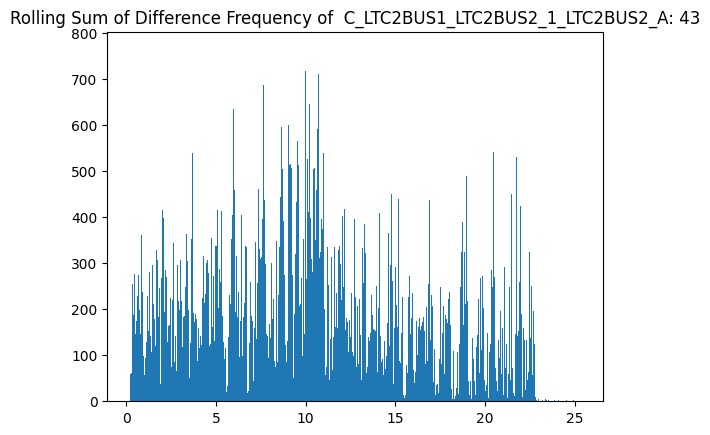

******************************************************************************


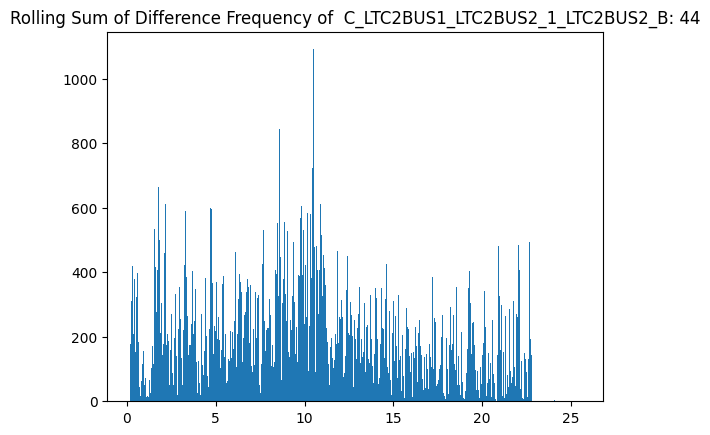

******************************************************************************


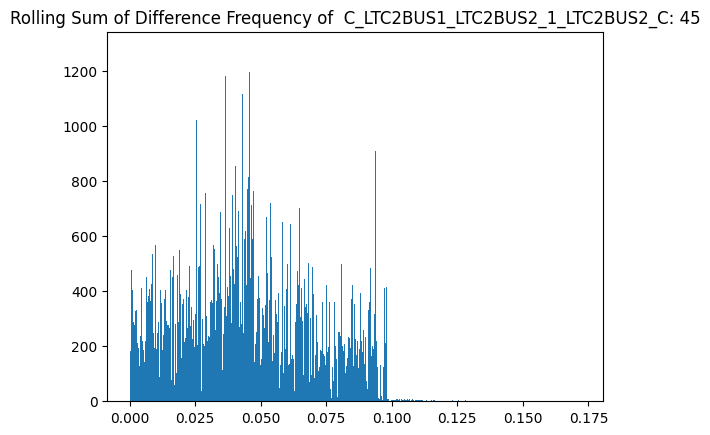

******************************************************************************


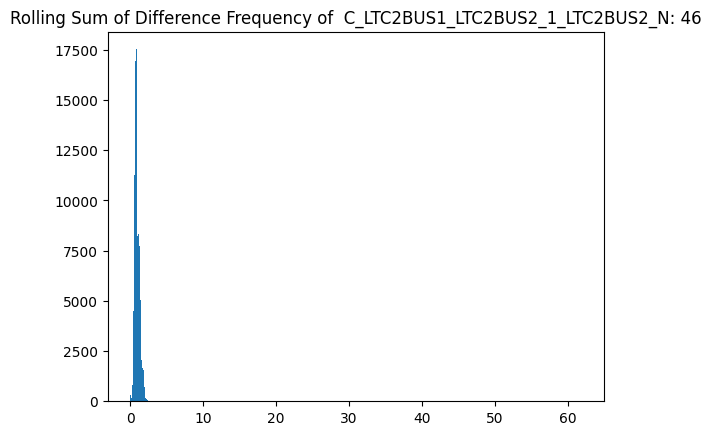

******************************************************************************


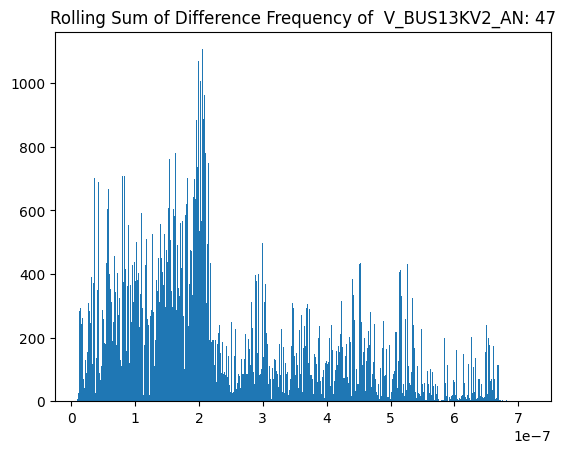

******************************************************************************


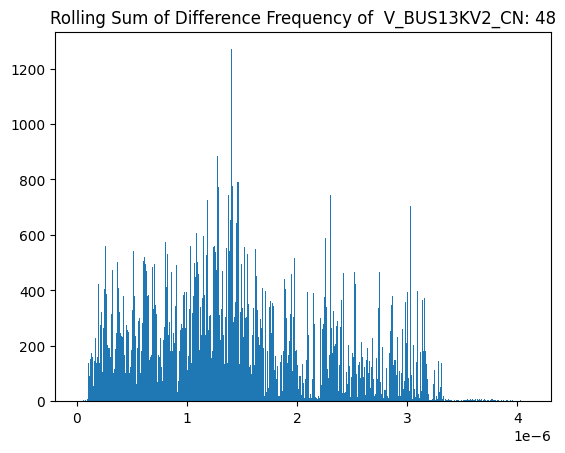

******************************************************************************


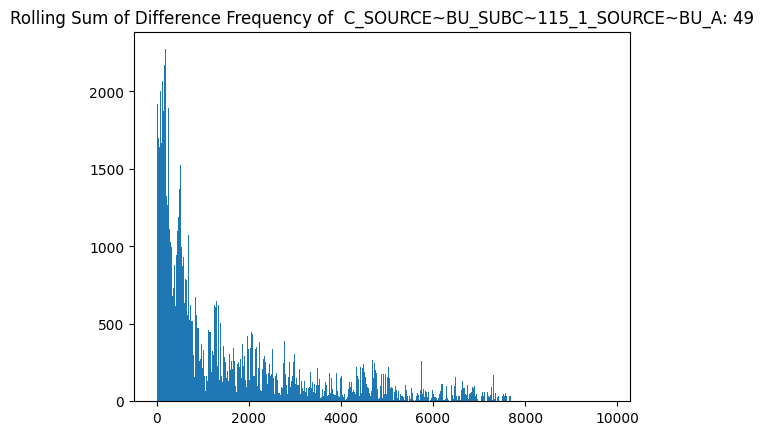

******************************************************************************


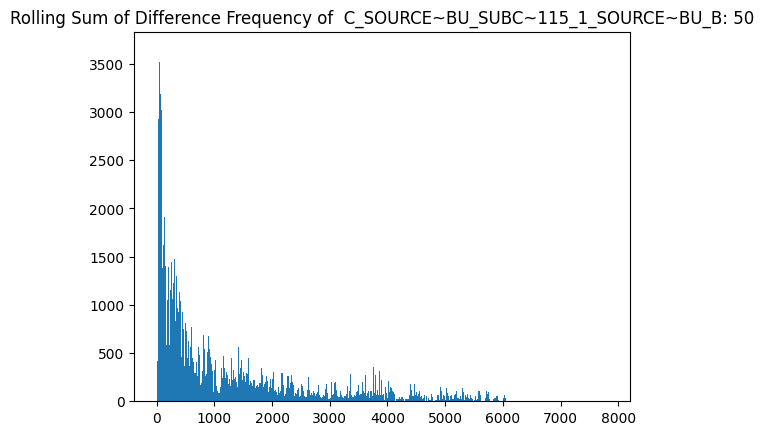

******************************************************************************


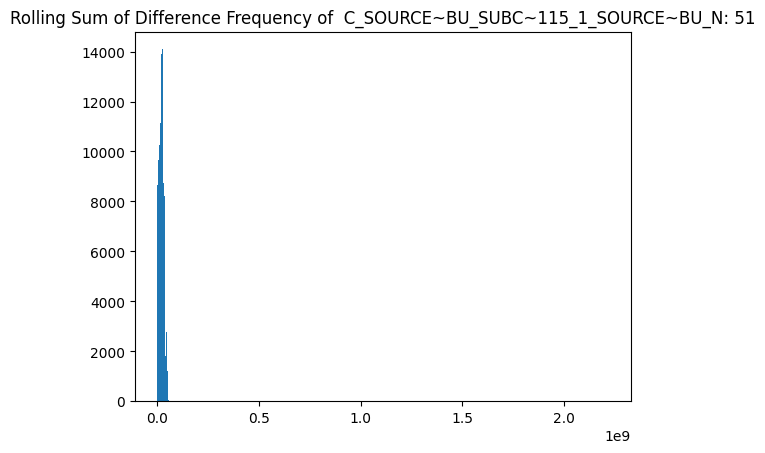

******************************************************************************


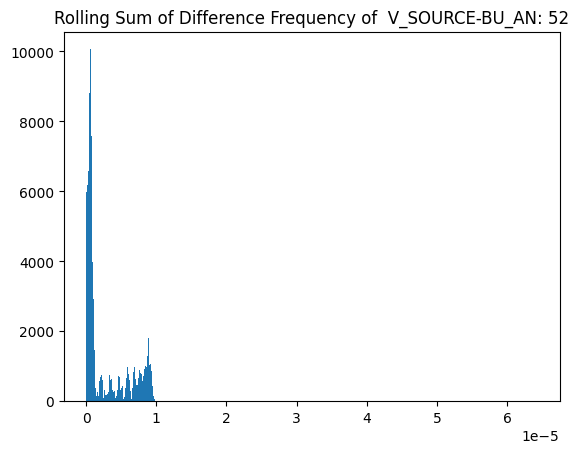

******************************************************************************


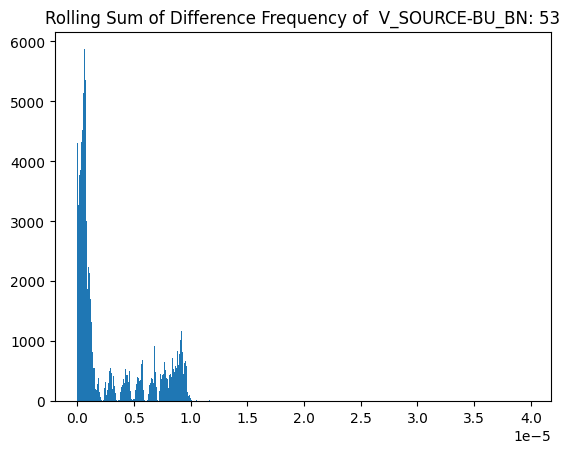

******************************************************************************


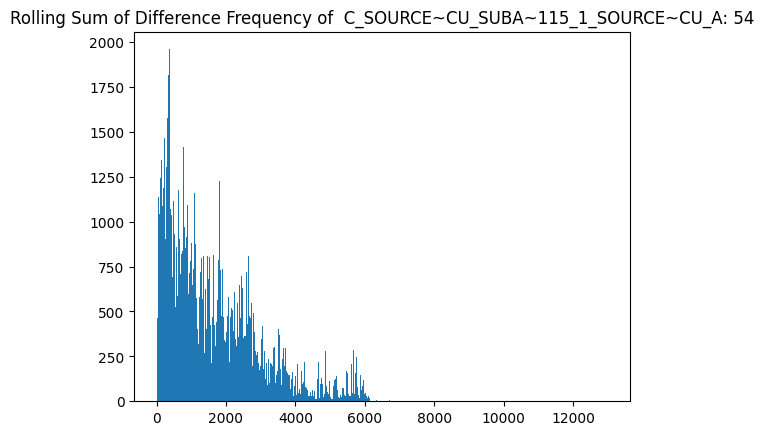

******************************************************************************


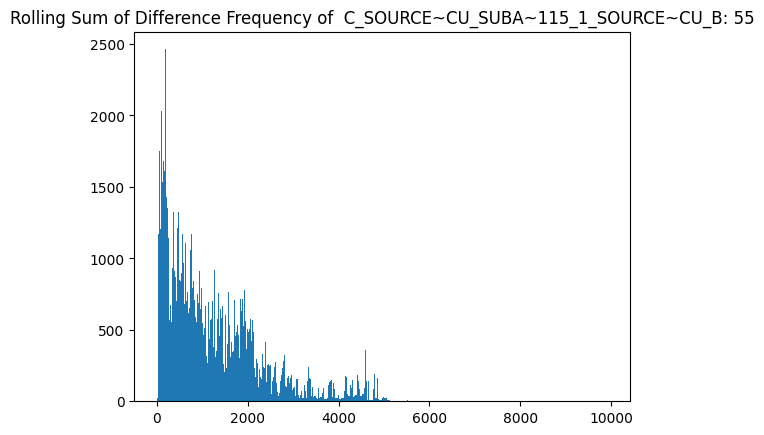

******************************************************************************


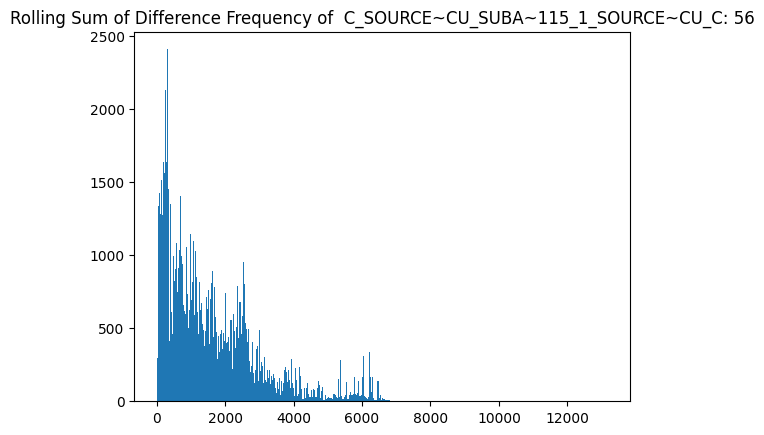

******************************************************************************


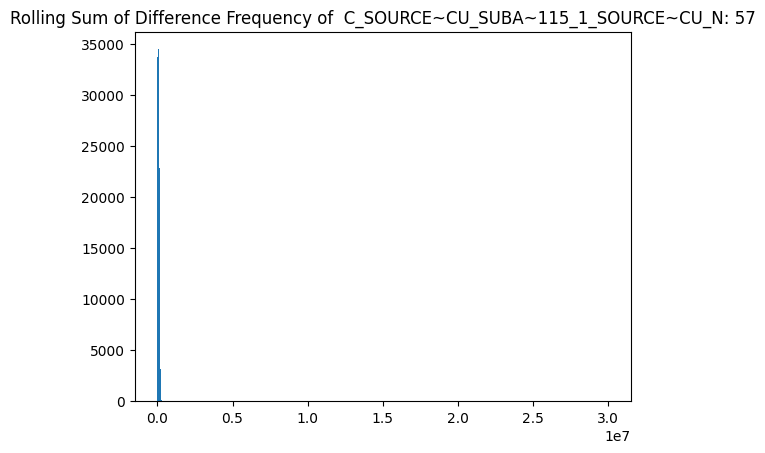

******************************************************************************


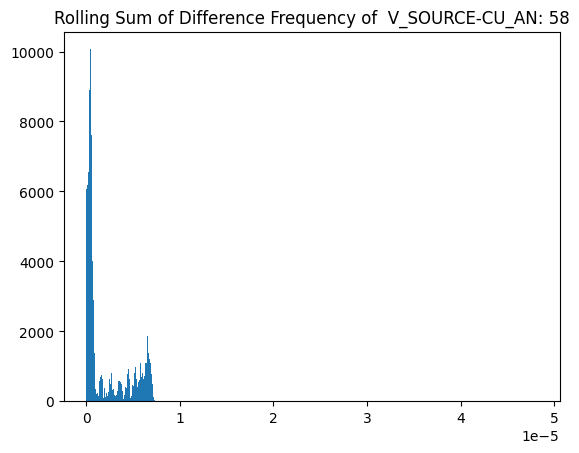

******************************************************************************


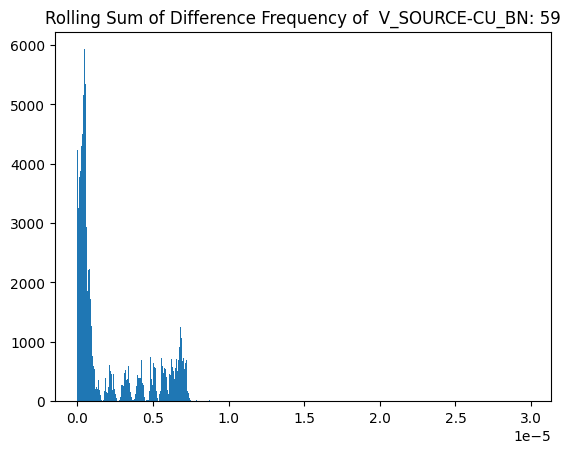

******************************************************************************


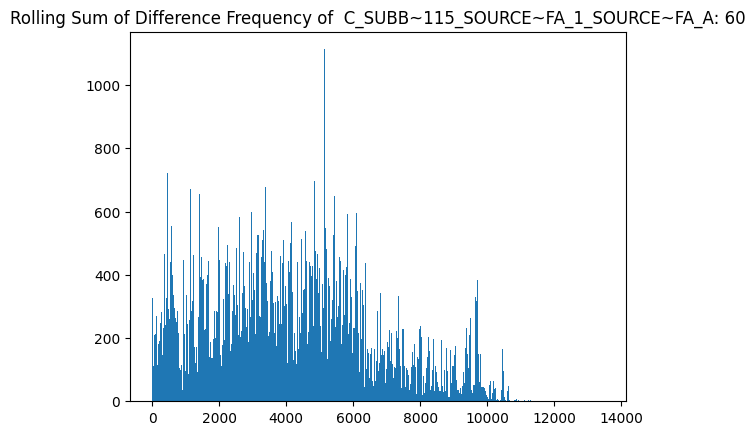

******************************************************************************


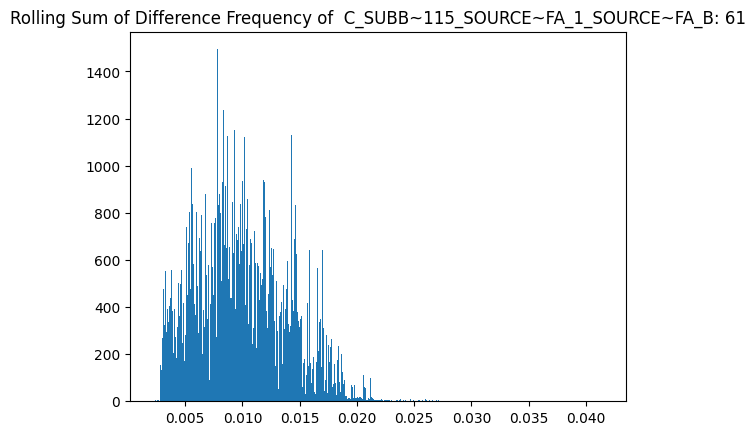

******************************************************************************


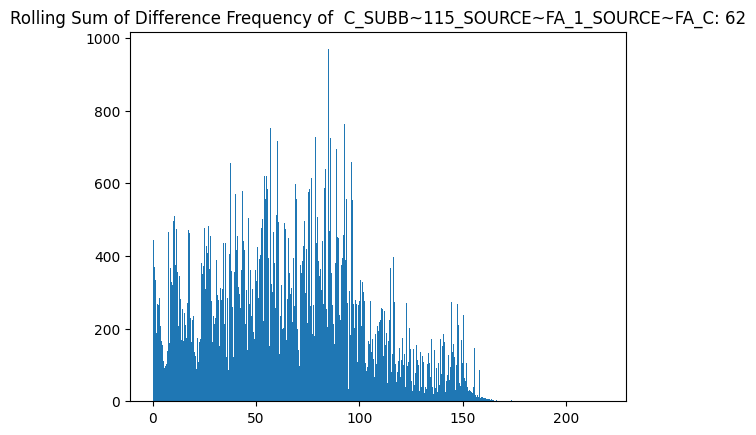

******************************************************************************


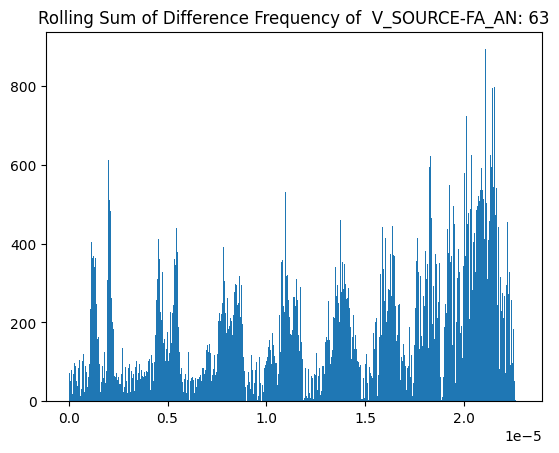

******************************************************************************


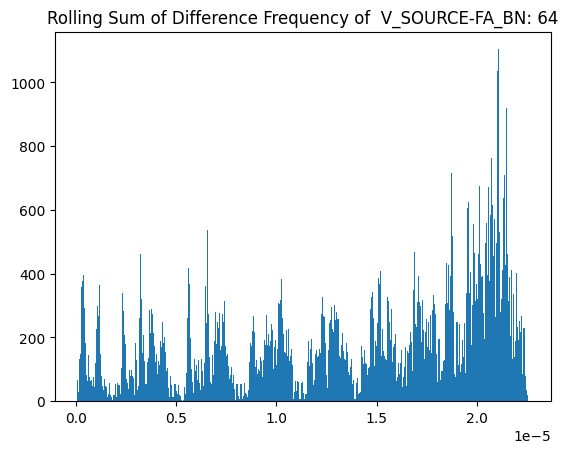

******************************************************************************


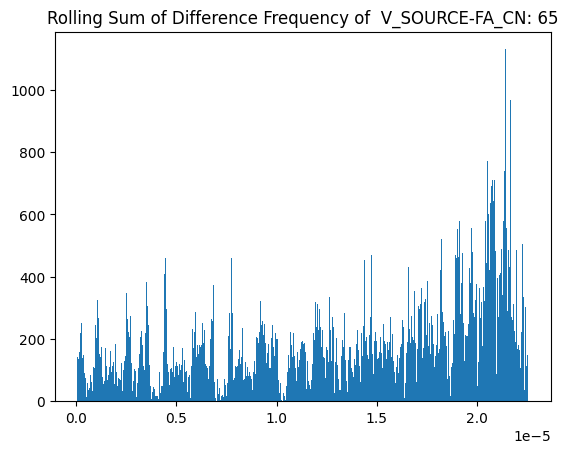

******************************************************************************


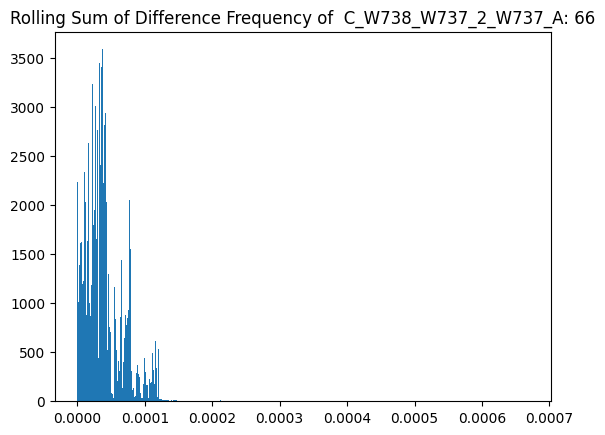

******************************************************************************


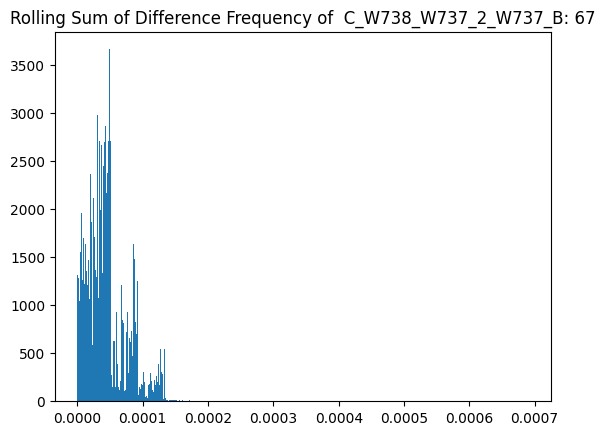

******************************************************************************


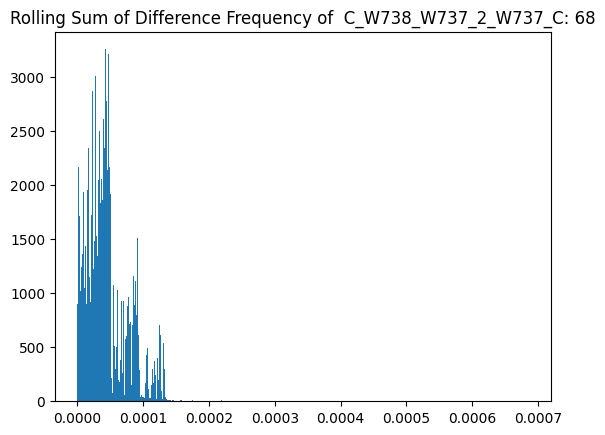

******************************************************************************


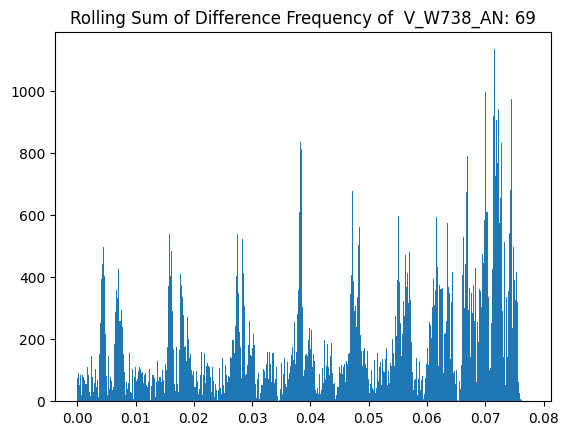

******************************************************************************


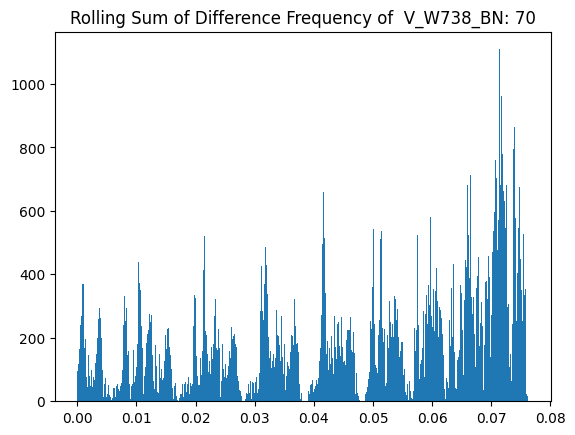

******************************************************************************


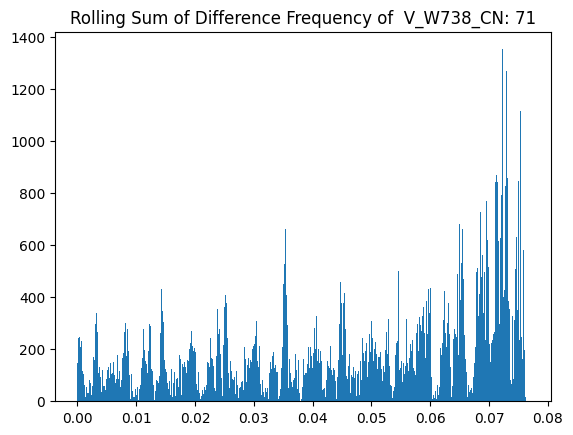

******************************************************************************


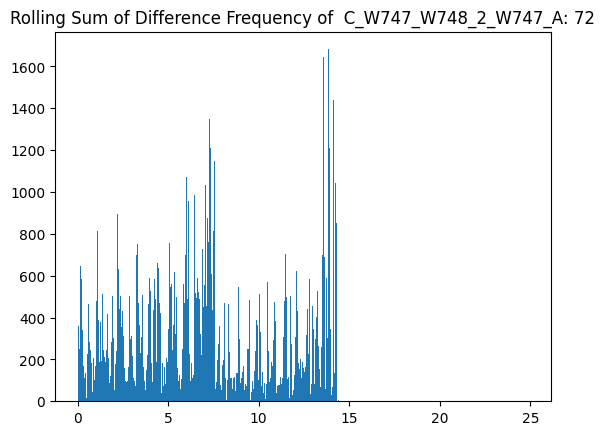

******************************************************************************


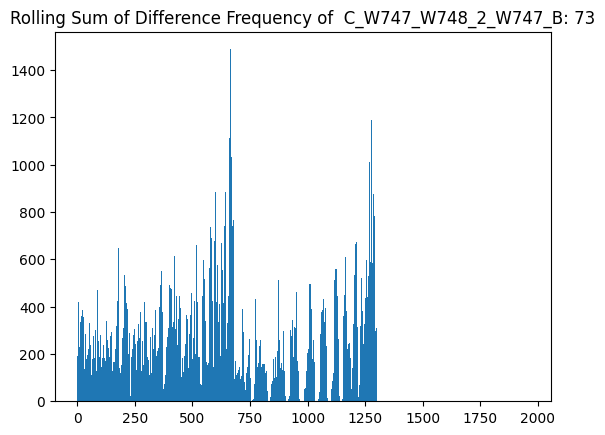

******************************************************************************


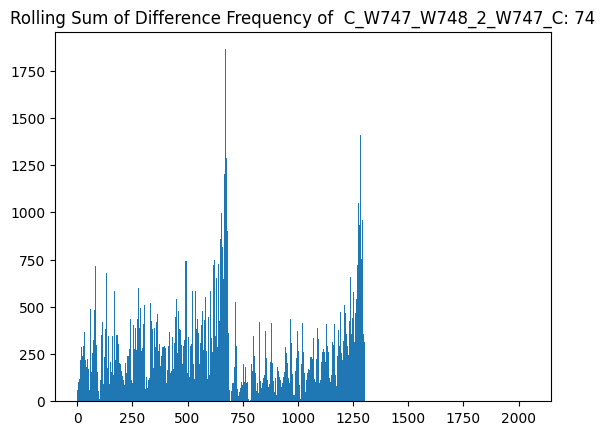

******************************************************************************


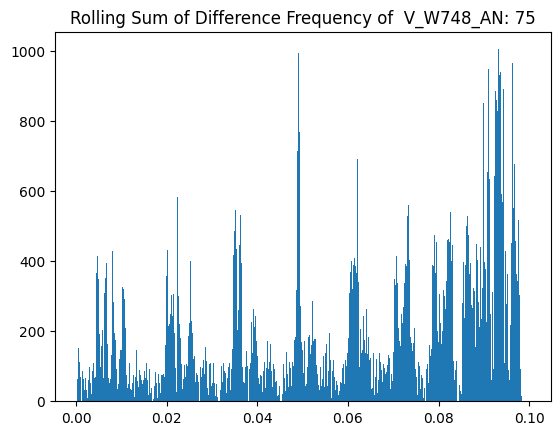

******************************************************************************


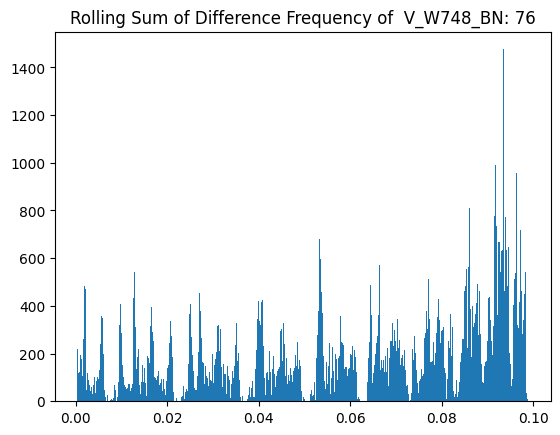

******************************************************************************


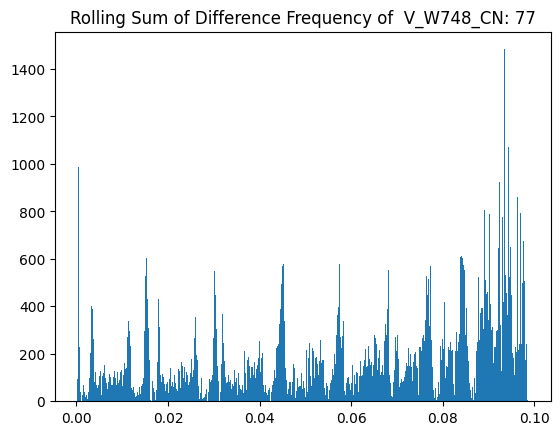

******************************************************************************


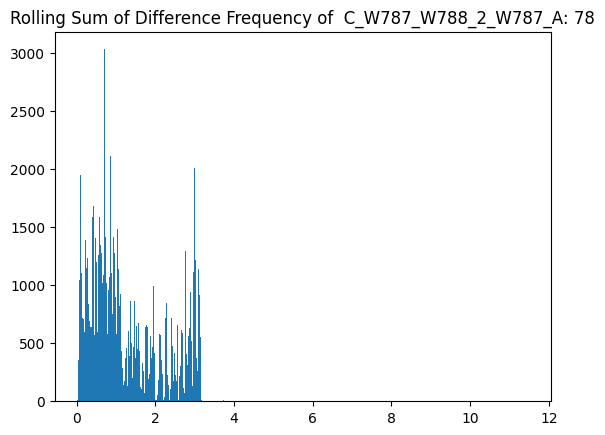

******************************************************************************


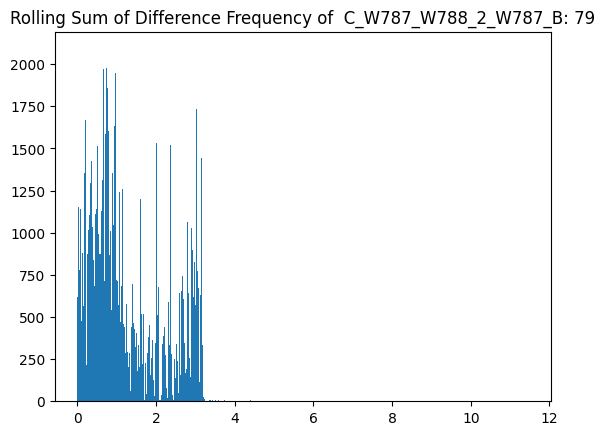

******************************************************************************


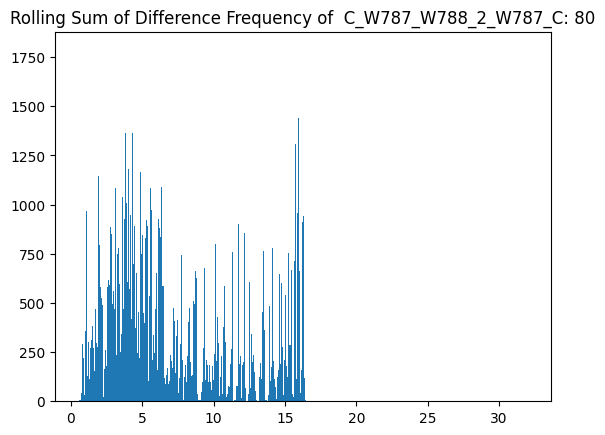

******************************************************************************


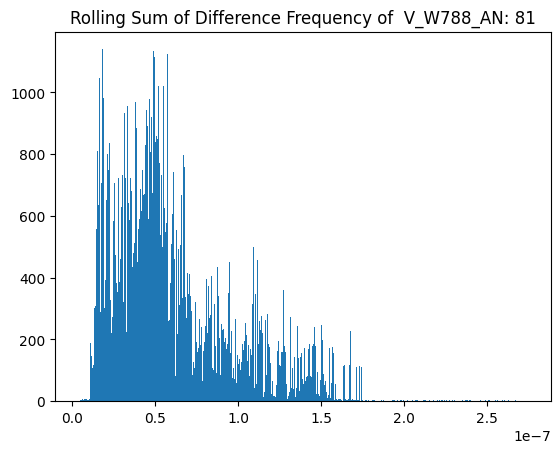

******************************************************************************


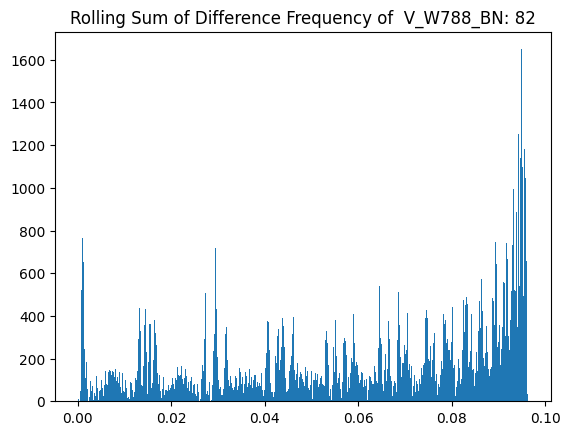

******************************************************************************


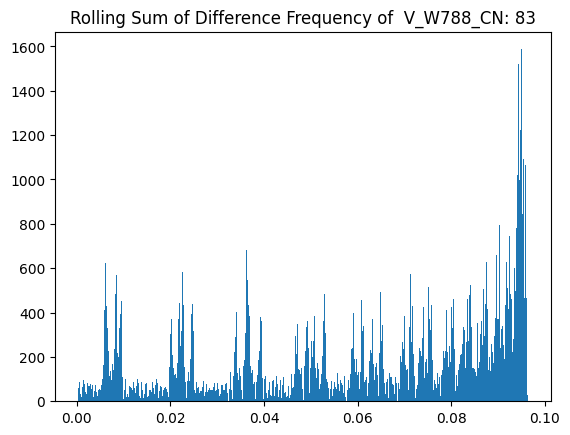

******************************************************************************


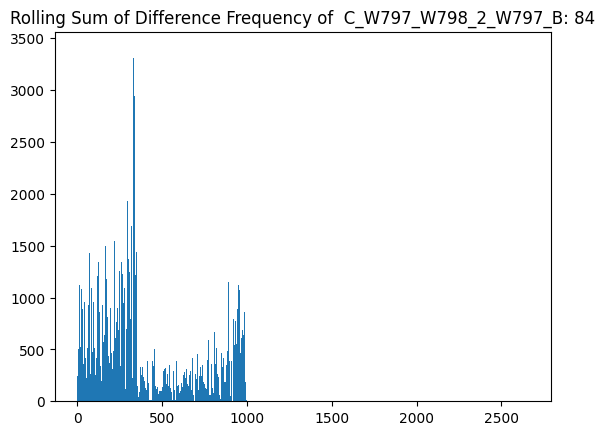

******************************************************************************


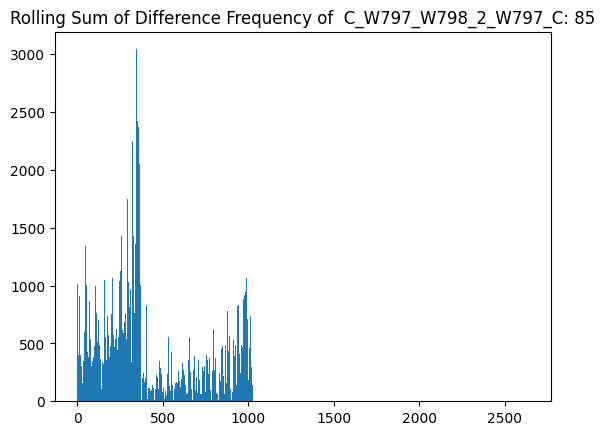

******************************************************************************


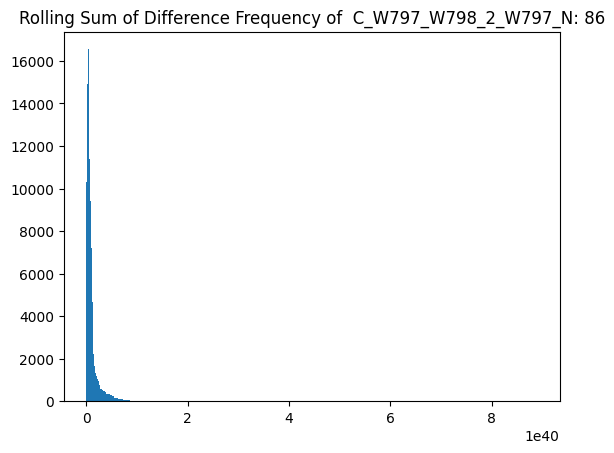

******************************************************************************
[nan nan nan ... nan nan nan]
[87]


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:1447: RuntimeWarning: invalid value encountered in subtract
  a = op(a[slice1], a[slice2])


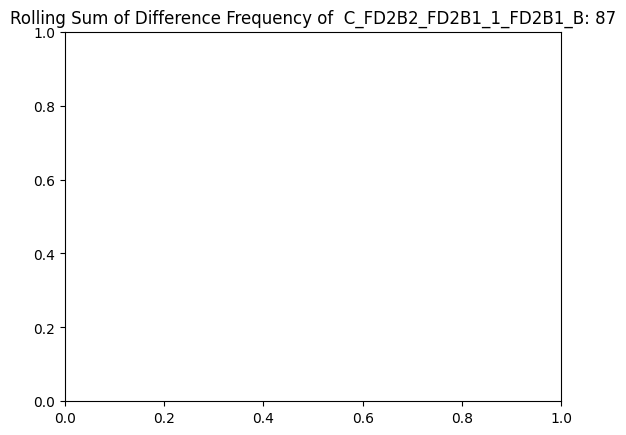

******************************************************************************
[nan nan nan ... nan nan nan]
[88]


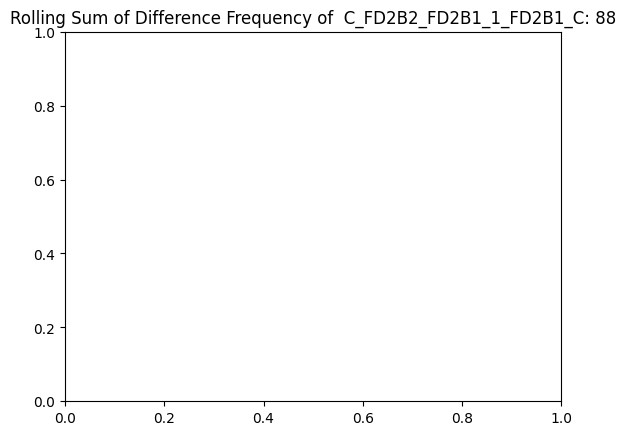

******************************************************************************


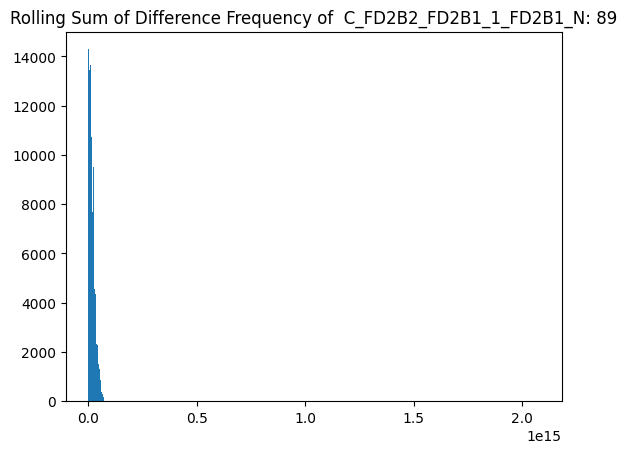

******************************************************************************


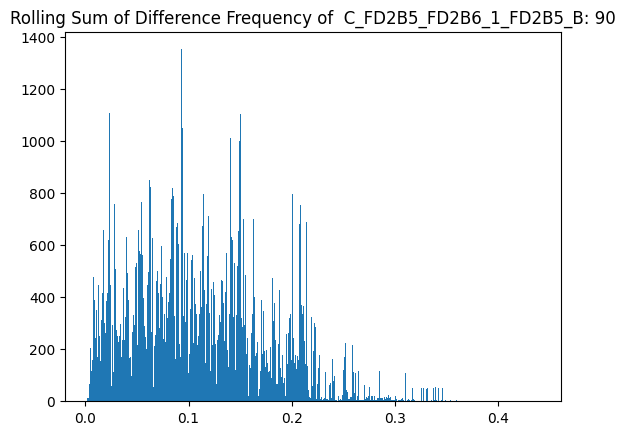

******************************************************************************


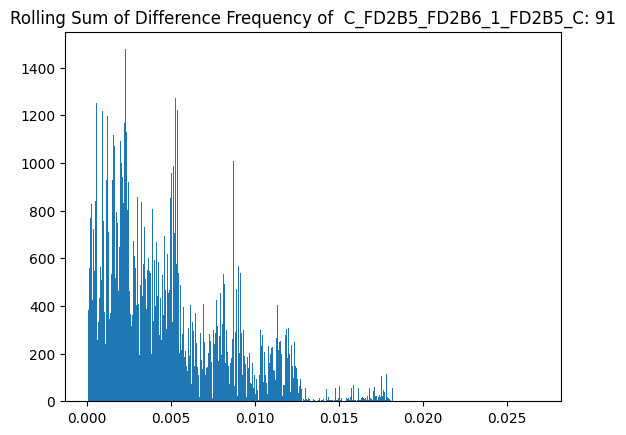

******************************************************************************


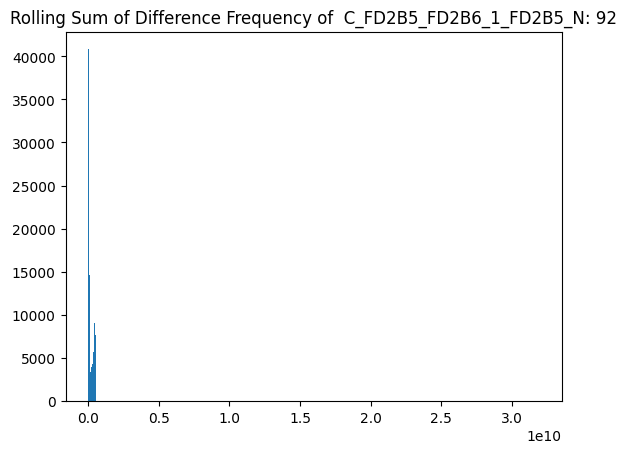

******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
****************************************************

In [46]:
window = 350
w = 1

var_fn = var_pair
thresholds_var, var_multi_list = get_threshold_stat_only(data, var_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=1, axis=1, stat_list=None, plot=True, collate_fn="sum")
thresholds_var_99, var_multi_list = get_threshold_stat_only(data, var_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=0.99, axis=1, stat_list=var_multi_list, collate_fn="sum")
thresholds_var_95, var_multi_list = get_threshold_stat_only(data, var_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=0.95, axis=1, stat_list=var_multi_list, collate_fn="sum")

In [47]:
len(thresholds_var_95)

93

In [48]:
# with open("models/" + f"thresholds_corr_{topology}.npy", 'wb') as f:
#     np.save(f, thresholds_corr)
# with open("models/" + f"thresholds_corr_99_{topology}.npy", 'wb') as f:
#     np.save(f, thresholds_corr_99)
# with open("models/" + f"thresholds_corr_95_{topology}.npy", 'wb') as f:
#     np.save(f, thresholds_corr_95)

# with open("models/" + f"thresholds_var_{topology}.npy", 'wb') as f:
#     np.save(f, thresholds_var)
# with open("models/" + f"thresholds_var_99_{topology}.npy", 'wb') as f:
#     np.save(f, thresholds_var_99)
# with open("models/" + f"thresholds_var_95_{topology}.npy", 'wb') as f:
#     np.save(f, thresholds_var_95)

In [49]:
# with open("models/" + f"thresholds_corr_{topology}.npy", 'rb') as f:
#     thresholds_corr = np.load(f)
# with open("models/" + f"thresholds_corr_99_{topology}.npy", 'rb') as f:
#     thresholds_corr_99 = np.load(f)
# with open("models/" + f"thresholds_corr_95_{topology}.npy", 'rb') as f:
#     thresholds_corr_95 = np.load(f)

# with open("models/" + f"thresholds_var_{topology}.npy", 'rb') as f:
#     thresholds_var = np.load(f)
# with open("models/" + f"thresholds_var_99_{topology}.npy", 'rb') as f:
#     thresholds_var_99 = np.load(f)
# with open("models/" + f"thresholds_var_95_{topology}.npy", 'rb') as f:
#     thresholds_var_95 = np.load(f)

### Testing Data

In [50]:
data_dir = "/content/drive/MyDrive/"
test_path = "Event4_TP_B.CSV"
df_test = pd.read_csv(data_dir + test_path, skiprows=[0,1,2,4])

df_test

,Time,C_W919_W910_1_W910_A,C_W919_W910_1_W910_B,C_W919_W910_1_W910_C,C_W919_W910_1_W910_N,V_W-115KV2_AN,V_W-115KV2_BN,V_W-115KV2_CN,C_W957_W950_1_W950_A,C_W957_W950_1_W950_B,...,V_FD2B5_AN,V_FD2B5_BN,V_FD2B5_CN,C_FD3B4_FD3B5_1_FD3B4_A,C_FD3B4_FD3B5_1_FD3B4_B,C_FD3B4_FD3B5_1_FD3B4_C,C_FD3B4_FD3B5_1_FD3B4_N,V_FD3B4_AN,V_FD3B4_BN,V_FD3B4_CN
0,0,0.000108,0.000147,-0.000415,-0.000347,1.38849,-0.792162,1.425908,0.000444,-0.000002,...,-0.088815,-0.046592,0.068078,0.001414,0.001441,0.001311,0.000003,0.155188,0.007813,0.023068
1,208,9.350839,-4.304609,-5.145012,0.319895,34541.80000,-15824.280000,-17083.230000,46.050460,-22.239490,...,390.515200,1.575024,-389.019600,3.338616,-0.113410,-3.319966,0.029923,2018.510000,63.707140,-2062.298000
2,417,-22.430900,11.108790,10.867750,1.738336,151485.60000,-64923.110000,-81696.970000,11.150850,-3.098356,...,9020.013000,-222.856700,-9476.269000,32.148630,1.092524,-33.749070,0.156682,12470.580000,714.781300,-13337.190000
3,625,-42.494760,18.666590,23.458370,1.658666,173885.40000,-66804.920000,-106459.000000,-18.311300,11.265120,...,10419.650000,936.599100,-11753.960000,67.566240,5.641891,-74.118910,0.244334,14464.310000,2096.051000,-16673.080000
4,833,-52.199010,19.936980,32.169860,0.650292,99493.91000,-25810.090000,-82806.650000,-59.529630,29.248290,...,8733.869000,1907.299000,-11090.160000,82.416630,13.260330,-96.497130,0.167771,8599.119000,3281.194000,-11914.810000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96000,19999872,-42.300430,32.363910,9.937258,-0.068301,93604.69000,-51966.030000,-41689.380000,-20.452450,17.997580,...,9844.479000,-2193.770000,-7619.594000,101.313700,-30.322360,-70.955950,-0.001627,10058.960000,-1302.476000,-8749.244000
96001,20000080,-43.141850,29.871030,13.274630,-0.136255,93771.17000,-45679.750000,-48141.720000,-21.096880,16.915060,...,9553.529000,-1382.961000,-8129.022000,99.109010,-22.391270,-76.645320,-0.006570,9686.751000,-444.211200,-9233.207000
96002,20000289,-43.716580,27.188630,16.533420,-0.201866,93363.29000,-39113.820000,-54297.930000,-21.612440,15.727430,...,9203.299000,-563.396200,-8588.629000,96.290360,-14.326190,-81.863060,-0.011436,9254.558000,416.400200,-9660.257000
96003,20000497,-44.024620,24.335450,19.699170,-0.265914,92376.90000,-32306.100000,-60117.500000,-21.995880,14.441460,...,8796.353000,260.060700,-8995.259000,92.879990,-6.171788,-86.572870,-0.016237,8765.164000,1275.000000,-10027.440000


In [51]:
data_test = preprocess(df_test, time=0.25e6, remove_neutral=True)
cols = data_test.columns

data_test

,C_W919_W910_1_W910_A,C_W919_W910_1_W910_B,C_W919_W910_1_W910_C,V_W-115KV2_AN,V_W-115KV2_BN,V_W-115KV2_CN,C_W957_W950_1_W950_A,C_W957_W950_1_W950_B,C_W957_W950_1_W950_C,V_W951_AN,...,C_FD2B2_FD2B1_1_FD2B1_N,C_FD2B5_FD2B6_1_FD2B5_B,C_FD2B5_FD2B6_1_FD2B5_C,C_FD2B5_FD2B6_1_FD2B5_N,C_FD3B4_FD3B5_1_FD3B4_B,C_FD3B4_FD3B5_1_FD3B4_C,C_FD3B4_FD3B5_1_FD3B4_N,V_FD3B4_AN,V_FD3B4_BN,V_FD3B4_CN
1201,-41.71743,26.27228,15.451980,93621.34,-41691.83,-51978.83,-20.33806,15.32307,5.036634,93621.34,...,0.000126,-12.217070,-59.31048,0.005406,-17.315500,-80.07544,-0.009544,9427.356,101.2562,-9518.610
1202,-42.09783,23.59821,18.508140,92855.53,-34968.60,-57935.55,-20.76017,14.14477,6.645756,92855.53,...,0.000175,-6.164845,-62.87114,0.004002,-9.177051,-84.97985,-0.015100,8958.220,962.5381,-9908.562
1203,-42.21773,20.77627,21.452640,91519.53,-28029.80,-63536.93,-21.05339,12.87830,8.214524,91519.53,...,0.000220,-0.077558,-66.04355,0.002599,-0.981171,-89.35984,-0.020568,8434.266,1817.7850,-10236.970
1204,-42.07922,17.82521,24.266860,89621.66,-20916.22,-68748.67,-21.21772,11.53215,9.733690,89621.66,...,0.000262,6.013236,-68.80673,0.001125,7.217899,-93.18904,-0.025894,7858.274,2661.6340,-10502.550
1205,-41.68228,14.75961,26.934280,87166.08,-13674.47,-73533.37,-21.25155,10.11394,11.192330,87166.08,...,0.000301,12.068960,-71.15018,-0.000279,15.375490,-96.44436,-0.031077,7233.422,3489.0540,-10703.220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96000,-42.30043,32.36391,9.937258,93604.69,-51966.03,-41689.38,-20.45245,17.99758,2.462375,93604.69,...,0.000372,-22.056310,-52.57392,0.007652,-30.322360,-70.95595,-0.001627,10058.960,-1302.4760,-8749.244
96001,-43.14185,29.87103,13.274630,93771.17,-45679.75,-48141.72,-21.09688,16.91506,4.199285,93771.17,...,0.000389,-16.147860,-56.72568,0.006318,-22.391270,-76.64532,-0.006570,9686.751,-444.2112,-9233.207
96002,-43.71658,27.18863,16.533420,93363.29,-39113.82,-54297.93,-21.61244,15.72743,5.910974,93363.29,...,0.000391,-10.141220,-60.52418,0.004915,-14.326190,-81.86306,-0.011436,9254.558,416.4002,-9660.257
96003,-44.02462,24.33545,19.699170,92376.90,-32306.10,-60117.50,-21.99588,14.44146,7.588194,92376.90,...,0.000378,-4.074970,-63.94843,0.003511,-6.171788,-86.57287,-0.016237,8765.164,1275.0000,-10027.440


In [52]:
print(all_attack_times)

all_attack_indices = set()

for start, end in all_attack_times:
    attack_indices = df_test.index[(df_test['Time'] >= start * 1e6) & (df_test['Time'] <= end * 1e6)] - 1201
    all_attack_indices.add((attack_indices[0], attack_indices[-1]))

all_attack_indice = sorted(list(all_attack_indices))

attacks_in = {}
co = 0
for key, value in attacks.items():
    attacks_in[sorted(all_attack_indice)[co][0]] = value
    co+=1

all_attack_indices

{(6.2, 7.1), (3.8, 4.5), (14.6, 15.8), (2.2, 3.5), (4.5, 5.9), (8.5, 9.4), (16.5, 17.5)}


{(9360, 15599),
 (17040, 20399),
 (20400, 27119),
 (28560, 32879),
 (39600, 43919),
 (68880, 74639),
 (78000, 82799)}

In [53]:
# cov_list = []

# for var1_index, var2_indices in adj_list.items():

#     var1_index -= 1
#     var2_indices = np.array(var2_indices) - 1

#     cov_list.append(
#         stat_diff(data_test, var1_index, var2_indices, window=window, stat_fn=covariance_pair, fn="sum")
#     )

# rsum_list_cov = np.array(cov_list)

In [54]:
import time

window = 350
w = 1

corr_list = []
var_list = []

start_time = time.time()

for var1_index, var2_indices in adj_list.items():

    var1_index -= 1
    var2_indices = np.array(var2_indices) - 1

    corr_list.append(
        stat_diff(data_test, var1_index, var2_indices, window=window, stat_fn=correlation_pair, fn="sum")
    )


for var1_index, var2_indices in adj_list.items():

    var1_index -= 1
    var2_indices = np.array(var2_indices) - 1

    var_list.append(
        stat_diff(data_test, var1_index, var2_indices, window=window, stat_fn=var_pair, fn="sum")
    )


end_time = time.time()


rsum_list_corr = np.array(corr_list)
rsum_list_var = np.array(var_list)

time_taken_total = end_time - start_time
avg_time = time_taken_total / (len(data_test) - window - w + 1)
print(time_taken_total, avg_time)
# in seconds

6.062494516372681 6.418462443488556e-05


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:1447: RuntimeWarning: invalid value encountered in subtract
  a = op(a[slice1], a[slice2])


In [55]:
total_normal = rsum_list_var.shape[1] + 1
for start, end in all_attack_indices:
    total_normal -= (end - start + 1 + 2 * (window + w - 1))
print(total_normal)

54035


In [56]:
# thresholds_cov = np.array(thresholds_cov)
# thresholds_cov_99 = np.array(thresholds_cov_99)
# thresholds_cov_95 = np.array(thresholds_cov_95)

thresholds_corr = np.array(thresholds_corr)
thresholds_corr_99 = np.array(thresholds_corr_99)
thresholds_corr_95 = np.array(thresholds_corr_95)

thresholds_var = np.array(thresholds_var)
thresholds_var_99 = np.array(thresholds_var_99)
thresholds_var_95 = np.array(thresholds_var_95)

# Covariance

In [57]:
# quantiles = [1., 0.99, 0.95]
# rsum_list = rsum_list_cov

# print("Covariance")


# for i, threshold in enumerate([thresholds_cov, thresholds_cov_99, thresholds_cov_95]):
#     print("Threshold:", quantiles[i])

#     for persistency in [1, 3, 5]:
#         print("Persistency:", persistency)


#         # each row is sensor, each col is timestep
#         violations = (rsum_list > threshold.reshape(-1, 1))
#         ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
#         print("DD:", ADD)
#         LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
#         print("LD:", LD)
#         fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency)
#         print("FPR", fpr)

#         fpr_l = []
#         for v in violations:
#             fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=persistency))
#         print("FPR Localisation (Mean):", np.mean(fpr_l))
#         print("####################################################")
#         print("FPR Localisation:", fpr_l)
#         print("****************************************************")
#     print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
#     print()

In [58]:
rsum_list_corr.shape

(93, 94454)

# Correlation

In [59]:
quantiles = [1., 0.99, 0.95]

rsum_list = rsum_list_corr

print("Correlation")

for i, threshold in enumerate([thresholds_corr, thresholds_corr_99, thresholds_corr_95]):
    print("Threshold:", quantiles[i])

    for persistency in [1, 3, 5]:
        print("Persistency:", persistency)


        # each row is sensor, each col is timestep
        violations = (rsum_list > threshold.reshape(-1, 1))
        ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
        print("DD:", ADD)
        LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
        print("LD:", LD)
        fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency)
        print("FPR", fpr)

        fpr_l = []
        for v in violations:
            fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=persistency))
        fpr_local = FPR_Local(violations, all_attack_indices, attacks_shifted_index, window, w, persistency)
        print("FPR Localisation (Detection):", np.mean(fpr_l), "+-", np.std(fpr_l))
        print("####################################################")
        print("FPR Localisation:", np.mean(fpr_local), "+-", np.std(fpr_local))
        print("FPR Localisation:", fpr_local)
        print("****************************************************")
    print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
    print()

Correlation
Threshold: 1.0
Persistency: 1
DD: [None, 0, 0, 0, 0, None, 0]
LD: [[nan, nan, nan], [nan], [nan, nan, nan], [nan], [nan, nan, 4805, nan, nan, nan], [nan], [nan, 30, 17, nan, nan, nan]]
FPR 0.001795132784306468
FPR Localisation (Detection): 2.188943645645843e-05 +- 8.200134372945435e-05
####################################################
FPR Localisation: 0.004340712837783914 +- 0.01480911599473965
FPR Localisation: [0.0007422068283028204, 0.0, 0.01640277090549233, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.05235032162295893, 0.04985155863433944, 0.05635823849579416, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.002226620484908461, 0.002474022761009401, 0.0, 0.0, 0.0, 0.0, 0.03871845620979713, 0.03639287481444829, 0.024245423057892134, 0.0, 0.010217714002968828, 0.0, 0.0, 0.0, 0.09910935180603661, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.474022761009401e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

# Variance

In [60]:
quantiles = [1., 0.99, 0.95]
rsum_list = rsum_list_var

print("Variance")


for i, threshold in enumerate([thresholds_var, thresholds_var_99, thresholds_var_95]):
    print("Threshold:", quantiles[i])

    for persistency in [1, 3, 5]:
        print("Persistency:", persistency)


        # each row is sensor, each col is timestep
        violations = (rsum_list > threshold.reshape(-1, 1))
        ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
        print("DD:", ADD)
        LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
        print("LD:", LD)
        fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency)
        print("FPR", fpr)

        fpr_l = []
        for v in violations:
            fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=persistency))
        fpr_local = FPR_Local(violations, all_attack_indices, attacks_shifted_index, window, w, persistency)
        print("FPR Localisation (Detection):", np.mean(fpr_l), "+-", np.std(fpr_l))
        print("####################################################")
        print("FPR Localisation:", np.mean(fpr_local), "+-", np.std(fpr_local))
        print("FPR Localisation:", fpr_local)
        print("****************************************************")
    print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
    print()

Variance
Threshold: 1.0
Persistency: 1
DD: [None, None, None, None, 6, None, 3]
LD: [[nan, nan, nan], [nan], [nan, nan, nan], [nan], [nan, nan, nan, nan, nan, nan], [nan], [nan, 4, 10, nan, nan, nan]]
FPR 0.09519755713889146
FPR Localisation (Detection): 0.0028563724626909483 +- 0.009543057740747311
####################################################
FPR Localisation: 0.0012388735481742774 +- 0.005296863561109777
FPR Localisation: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.027387431964374074, 0.027337951509153885, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0027709054923305294, 0.0028203859475507175, 0.0, 0.0, 0.0, 0.0, 0.02459178624443345, 0.024888668975754577, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0028946066303809997, 0.002523503216229589, 0.0, 

# Combined (Correlation and Variance Ratio)

In [61]:
print("Combined")

t_corr = [thresholds_corr, thresholds_corr_99, thresholds_corr_95]
# t_cov = [thresholds_cov, thresholds_cov_99, thresholds_cov_95]
t_var = [thresholds_var, thresholds_var_99, thresholds_var_95]

time_total = []

for i in range(len(t_corr)):
    print("Threshold:", quantiles[i])

    for persistency in [1, 3, 5, 10]:
        print("Persistency:", persistency)


        # each row is sensor, each col is timestep
        violations = np.logical_or((rsum_list_corr > t_corr[i].reshape(-1, 1)), (rsum_list_var > t_var[i].reshape(-1, 1)))
#         violations = np.logical_or((rsum_list_corr > t_corr[i].reshape(-1, 1)), (rsum_list_cov > t_cov[i].reshape(-1, 1)))
        ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
        print("DD:", ADD)
        ADD = [i if i is not None else np.nan for i in ADD]
        dd_mean = np.nanmean(ADD)
#         if None in ADD:
#             dd_mean = None
#         else:
#             dd_mean = np.mean(ADD)
        print("Average DD:", dd_mean, np.nanstd(ADD))
        LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
        print("LD:", LD)
        lds = [ld if ld is not None else np.nan for sublist in LD for ld in sublist]
        ld_mean = np.nanmean(lds)
#         if None in lds:
#             ld_mean = None
#         else:
#             ld_mean = np.mean(lds)
        print("Average LD:", ld_mean, "+-", np.nanstd(lds))
        fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency)
        print("FPR", fpr)

        fpr_l = []
        for v in violations:
            fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=persistency))
        fpr_local = FPR_Local(violations, all_attack_indices, attacks_shifted_index, window, w, persistency)
        print("FPR Localisation (Detection):", np.mean(fpr_l), "+-", np.std(fpr_l))
        print("####################################################")
        print("FPR Localisation:", np.mean(fpr_local), "+-", np.std(fpr_local))
        print("FPR Localisation:", fpr_local)
        print("****************************************************")
    print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
    print()

Combined
Threshold: 1.0
Persistency: 1
DD: [None, 0, 0, 0, 0, None, 0]
Average DD: 0.0 0.0
LD: [[nan, nan, nan], [nan], [nan, nan, nan], [nan], [nan, nan, 4805, nan, nan, nan], [nan], [nan, 4, 10, nan, nan, nan]]
Average LD: 1606.3333333333333 +- 2261.8002171328535
FPR 0.0965485333580087
FPR Localisation (Detection): 0.002876072955501761 +- 0.009537929143603562
####################################################
FPR Localisation: 0.005579054338052597 +- 0.01837352277782306
FPR Localisation: [0.0007422068283028204, 0.0, 0.01640277090549233, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.07968827313211281, 0.07718951014349332, 0.05635823849579416, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.00499752597723899, 0.005294408708560119, 0.0, 0.0, 0.0, 0.0, 0.06331024245423057, 0.06128154379020287, 0.024245423057892134, 0.0, 0.010217714002968828, 0.0, 0.0, 0.0, 0.09910935180603661, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

In [62]:
all_sensors =[]
for i in attacks.values():
    for a in i:
        all_sensors += a
all_sensors

[49,
 88,
 46,
 73,
 58,
 50,
 59,
 47,
 74,
 89,
 51,
 90,
 48,
 75,
 60,
 42,
 87,
 54,
 63,
 76,
 55,
 4,
 10,
 64,
 16,
 43,
 22,
 77,
 56,
 5,
 11,
 65,
 17,
 44,
 23,
 78,
 57,
 6,
 12,
 66,
 18,
 45,
 24,
 72,
 45,
 66,
 57,
 61,
 46,
 40,
 79,
 91,
 62,
 92,
 47,
 41,
 80,
 63,
 93,
 81,
 42,
 48,
 64,
 43,
 55,
 76,
 70,
 65,
 71,
 44,
 56,
 77,
 66,
 45,
 72,
 78,
 57,
 30,
 3,
 13,
 34,
 82,
 14,
 35,
 83,
 15,
 36,
 84,
 16,
 76,
 37,
 17,
 38,
 77,
 18,
 78,
 39]

In [63]:
attack_i = {}
for key, items in attacks_in.items():
  attack_i[key] = []
  for i in items:
    attack_i[key] += i
attack_i

{9360: [49, 88, 46, 73, 58, 50, 59, 47, 74, 89, 51, 90, 48, 75, 60],
 17040: [42, 87, 54, 63],
 20400: [76,
  55,
  4,
  10,
  64,
  16,
  43,
  22,
  77,
  56,
  5,
  11,
  65,
  17,
  44,
  23,
  78,
  57,
  6,
  12,
  66,
  18,
  45,
  24],
 28560: [72, 45, 66, 57],
 39600: [61,
  46,
  40,
  79,
  91,
  62,
  92,
  47,
  41,
  80,
  63,
  93,
  81,
  42,
  48,
  64,
  43,
  55,
  76,
  70,
  65,
  71,
  44,
  56,
  77,
  66,
  45,
  72,
  78,
  57],
 68880: [30, 3],
 78000: [13,
  34,
  82,
  14,
  35,
  83,
  15,
  36,
  84,
  16,
  76,
  37,
  17,
  38,
  77,
  18,
  78,
  39]}

In [64]:
# LD_cov = []
# at_neighbor = {}

# rsum_list = rsum_list_cov
# threshold = thresholds_cov_99
# t_list = t_cov
# persistency = 5

# for index, i in enumerate(rsum_list):
#     print("***********************************************************************************************")
#     attack_in = (i > threshold[index]).nonzero()

#     violations = (rsum_list > threshold.reshape(-1, 1))

#     print(f"Sensor: {things[index]} {cols[things[index]-1]}")
#     at_neighbor[things[index]] = attack_in
#     plt.title(f"{cols[things[index]-1]}: {things[index]}")

#     for t in t_list:
#         plt.axhline(t[index], color='orange')

#     plt.axhline(threshold[index], color='red')

#     if things[index] in attack_dict:
#         #if sensor is being attacked

#         # ground truth
#         attack_indices = df_test.index[
#             (df_test['Time'] >= attack_dict[things[index]][0] * 1e6) &
#             (df_test['Time'] <= attack_dict[things[index]][1] * 1e6)] - 1201

#         for start, end in all_attack_indices:

#             # if this is the attack time of the sensor, plot solid red lines
#             if attack_indices[0] == start:
#                 DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
#                 LD_cov.append(DD)
#                 print(f"DD = {DD}")
#                 start_w = start-window-w
#                 end_w = end+window+w-1
#                 plt.axvline(start_w, color='red')
#                 plt.axvline(end_w, color='red')

#             # otherwise, plot pink lines
#             else:
#                 start_w = start-window-w
#                 end_w = end+window+w-1
#                 plt.axvline(start_w, color='pink', alpha=0.75)
#                 plt.axvline(end_w, color='pink', alpha=0.75)

#                 start_w = start-window-w
#                 end_w = end+window+w-1
#                 for starts, ate in attack_i.items():
#                   if starts == start and things[index] in ate:
#                     DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
#                     LD_cov.append(DD)
#                     print(f"DD = {DD}")
#                     plt.axvline(start_w, color='orange', alpha=0.75)
#                     plt.axvline(end_w, color='orange', alpha=0.75)

#     else:
#          for start, end in all_attack_indices:
#             start_w = start-window-w
#             end_w = end+window+w-1
#             plt.axvline(start_w, color='pink', alpha=0.75)
#             plt.axvline(end_w, color='pink', alpha=0.75)
#             for starts, ate in attack_i.items():
#               if starts == start:
#                 if things[index] in ate:
#                   print(things[index])
#                   DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
#                   LD_cov.append(DD)
#                   print(f"DD = {DD}")
#                   plt.axvline(start_w, color='orange', alpha=0.75)
#                   plt.axvline(end_w, color='orange', alpha=0.75)

#     plt.plot(i)
#     plt.show()

# print(LD_cov)

***********************************************************************************************
Sensor 1:  C_W919_W910_1_W910_A


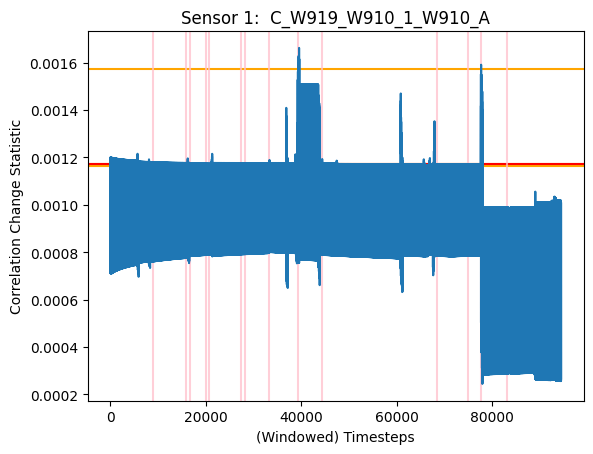

***********************************************************************************************
Sensor 2:  C_W919_W910_1_W910_B


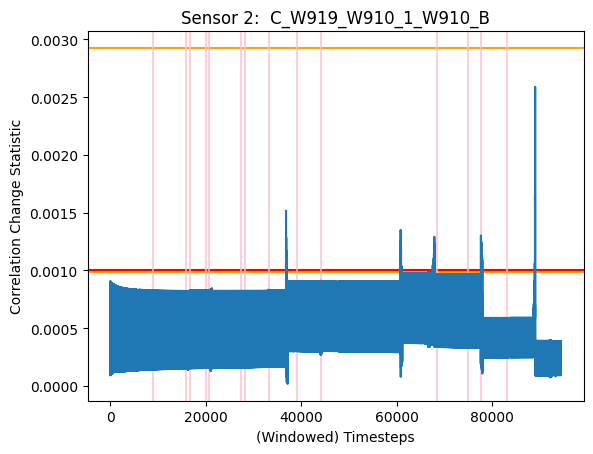

***********************************************************************************************
Sensor 3:  C_W919_W910_1_W910_C
DD = None


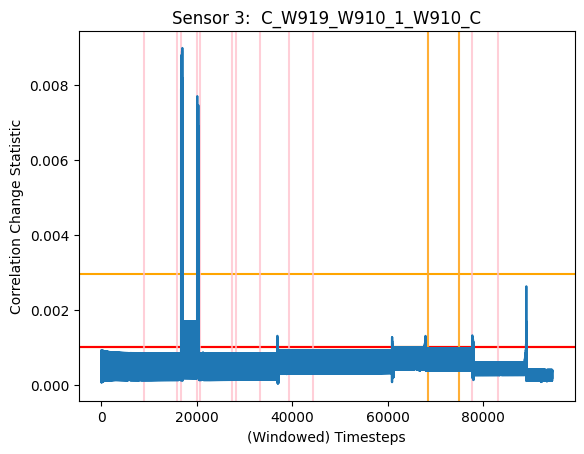

***********************************************************************************************
Sensor 4:  V_W-115KV2_AN
DD = None


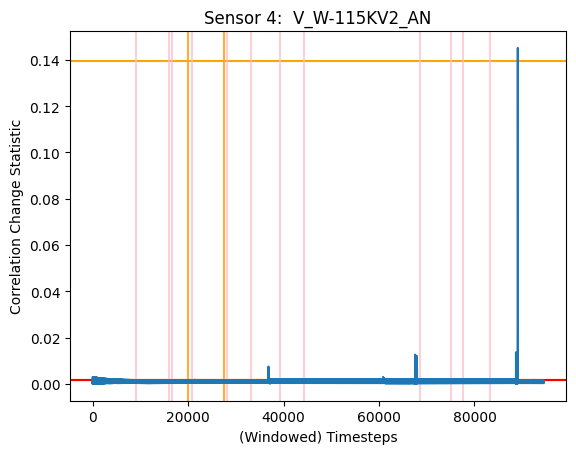

***********************************************************************************************
Sensor 5:  V_W-115KV2_BN
DD = None


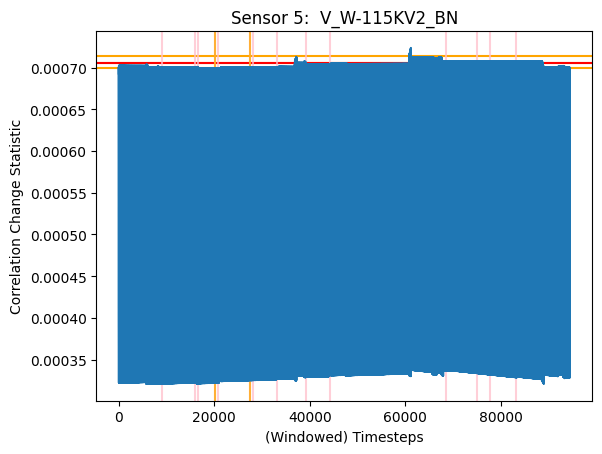

***********************************************************************************************
Sensor 6:  V_W-115KV2_CN
DD = None


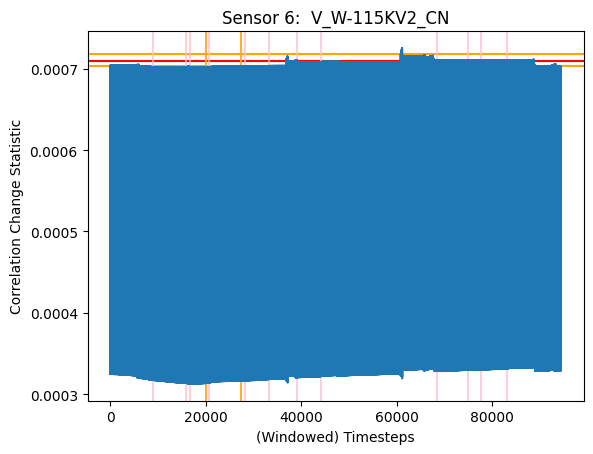

***********************************************************************************************
Sensor 7:  C_W957_W950_1_W950_A


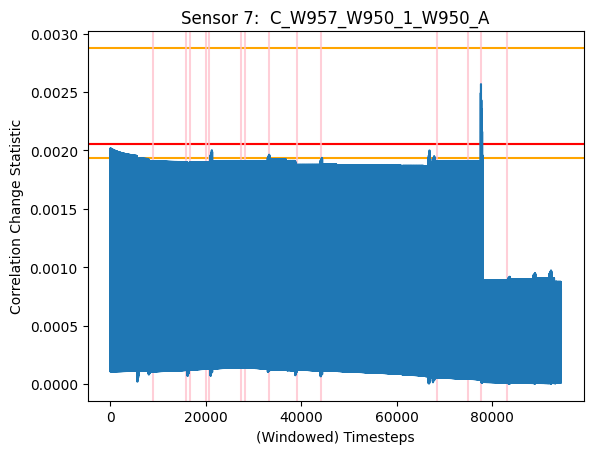

***********************************************************************************************
Sensor 8:  C_W957_W950_1_W950_B


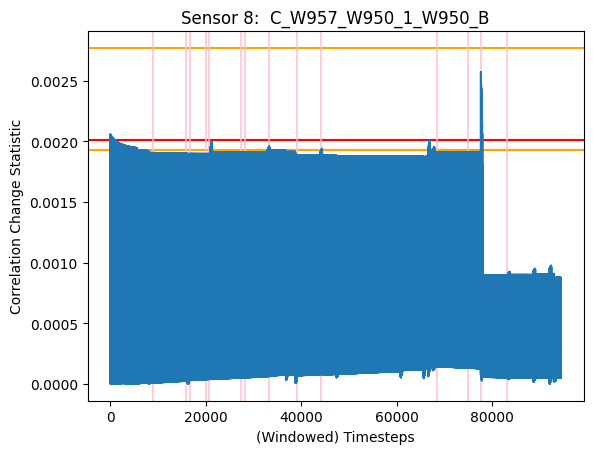

***********************************************************************************************
Sensor 9:  C_W957_W950_1_W950_C


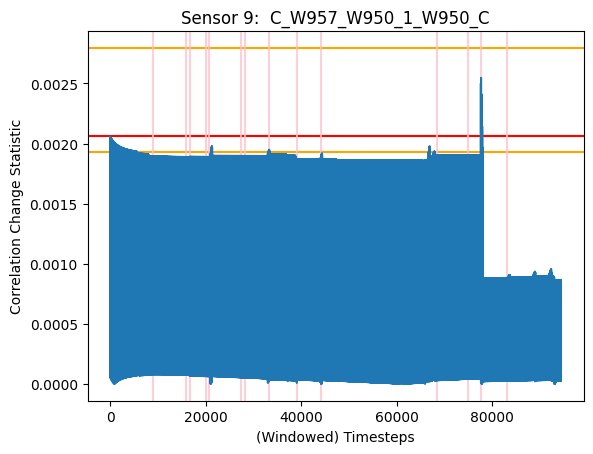

***********************************************************************************************
Sensor 10:  V_W951_AN
DD = 969


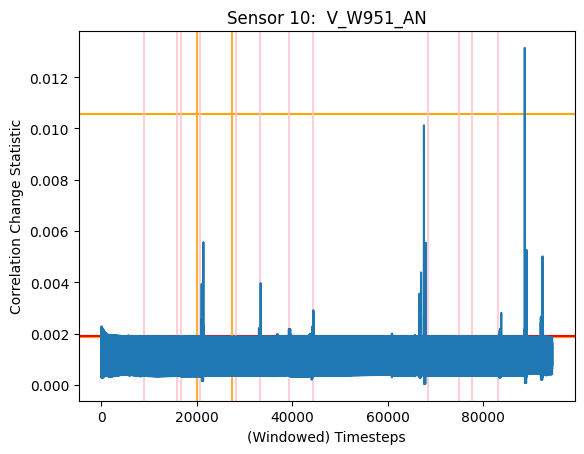

***********************************************************************************************
Sensor 11:  V_W951_BN
DD = None


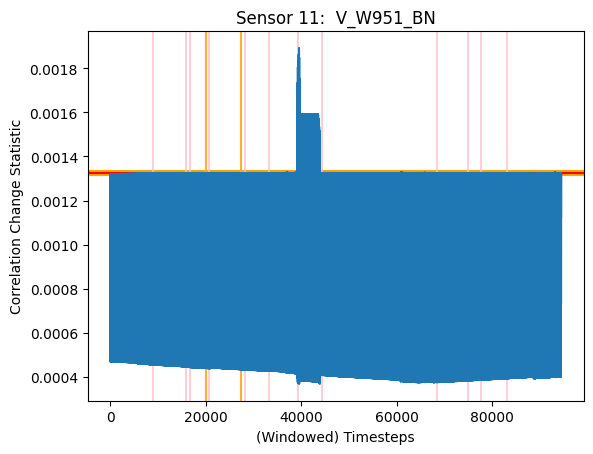

***********************************************************************************************
Sensor 12:  V_W951_CN
DD = None


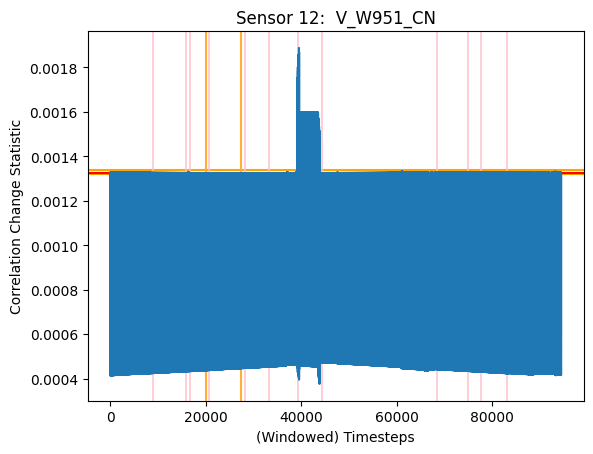

***********************************************************************************************
Sensor 13:  C_W957_W950_1_W957_A
DD = 6


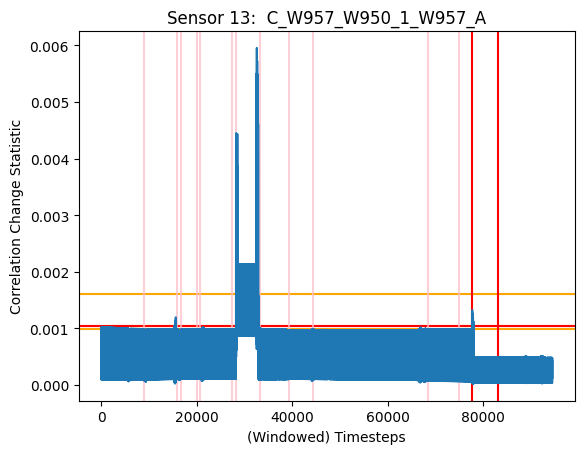

***********************************************************************************************
Sensor 14:  C_W957_W950_1_W957_B
DD = 39


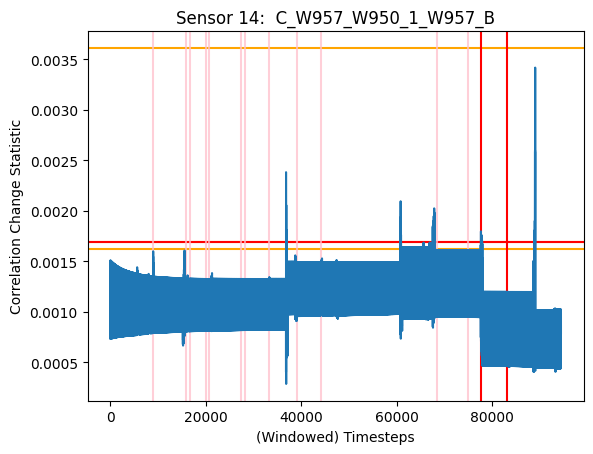

***********************************************************************************************
Sensor 15:  C_W957_W950_1_W957_C
DD = 66


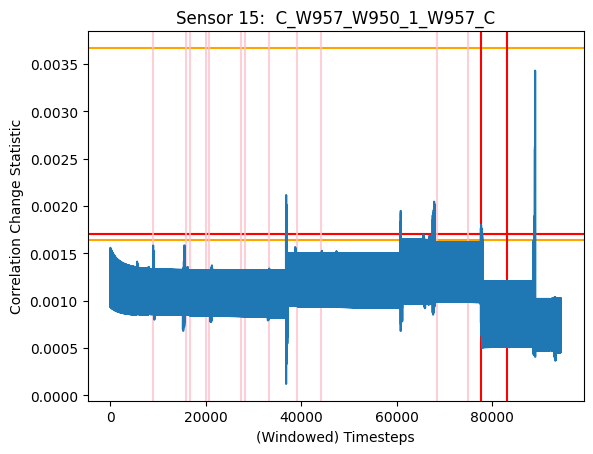

***********************************************************************************************
Sensor 16:  C_W927_W929_1_W929_A
DD = None
DD = None


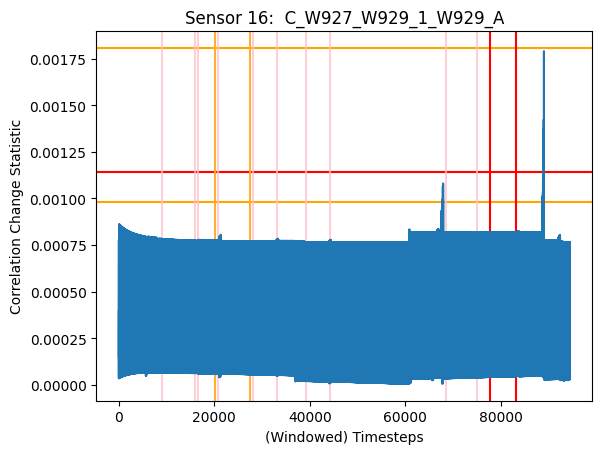

***********************************************************************************************
Sensor 17:  C_W927_W929_1_W929_B
DD = None
DD = None


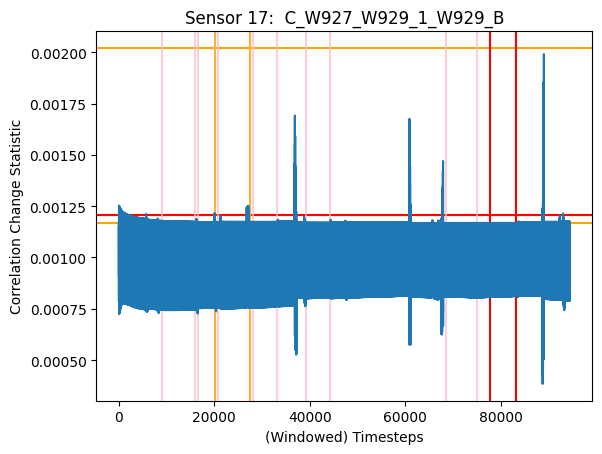

***********************************************************************************************
Sensor 18:  C_W927_W929_1_W929_C
DD = None
DD = None


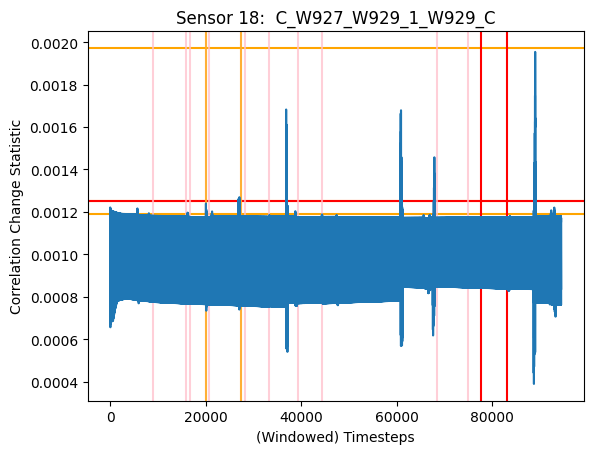

***********************************************************************************************
Sensor 19:  C_W927_W929_1_W929_N


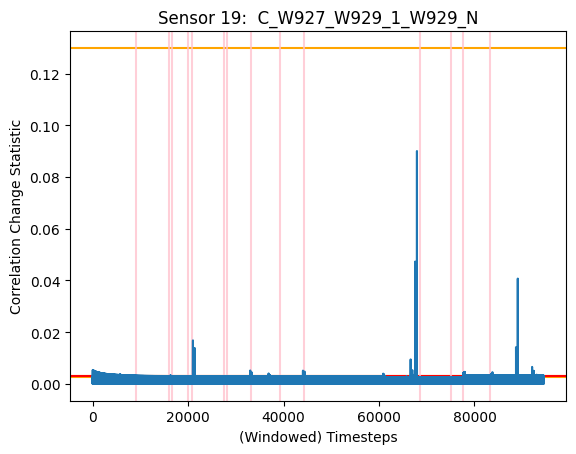

***********************************************************************************************
Sensor 20:  V_W-115KV1_AN


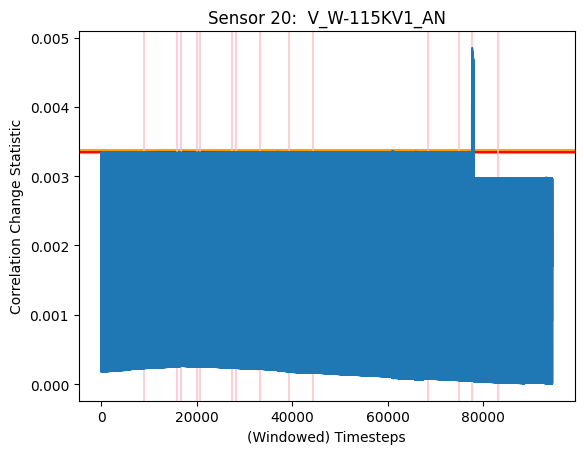

***********************************************************************************************
Sensor 21:  V_W-115KV1_BN


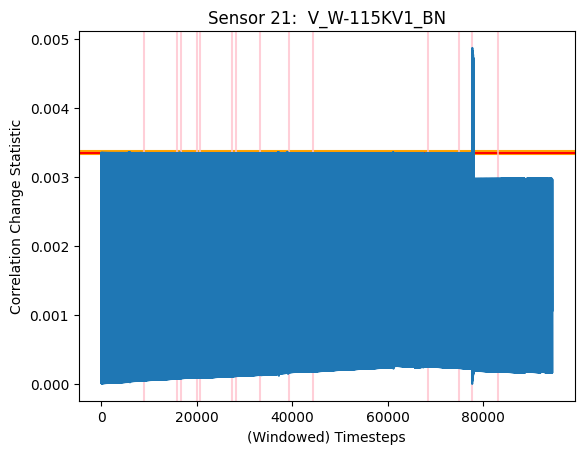

***********************************************************************************************
Sensor 22:  C_W927_W929_1_W927_A
DD = None


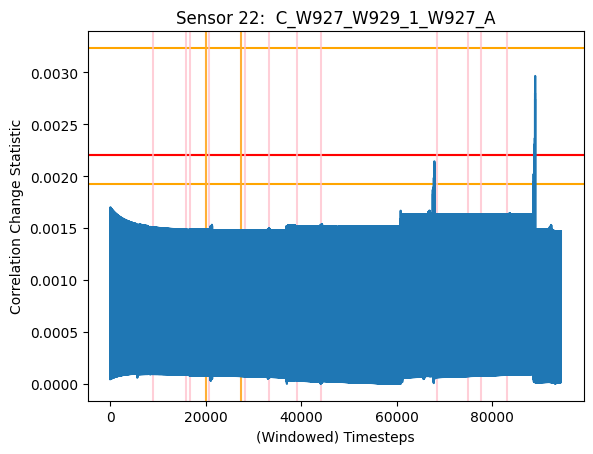

***********************************************************************************************
Sensor 23:  C_W927_W929_1_W927_B
DD = None


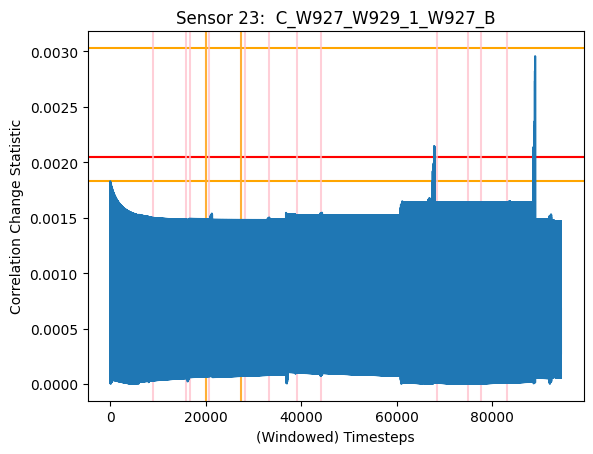

***********************************************************************************************
Sensor 24:  C_W927_W929_1_W927_C
DD = None


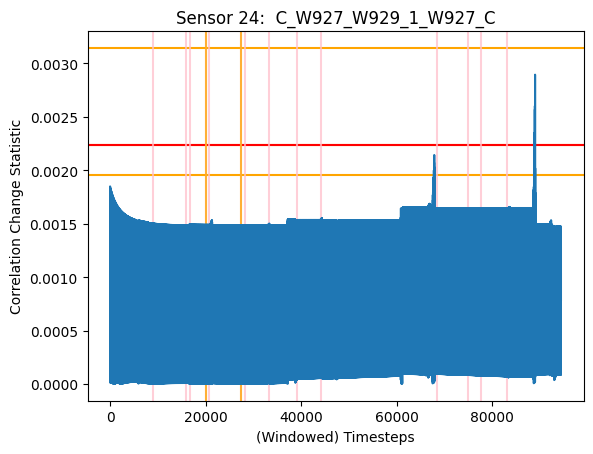

***********************************************************************************************
Sensor 25:  C_W919_W910_1_W919_N


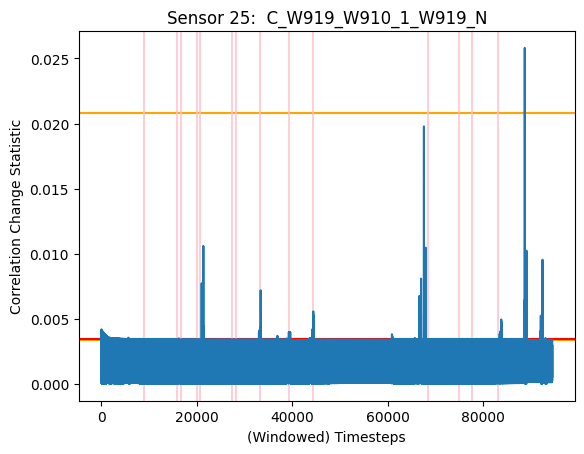

***********************************************************************************************
Sensor 26:  V_W911_AN


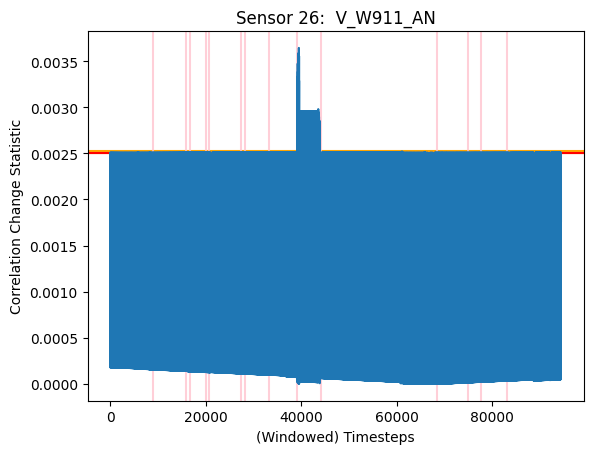

***********************************************************************************************
Sensor 27:  V_W911_BN


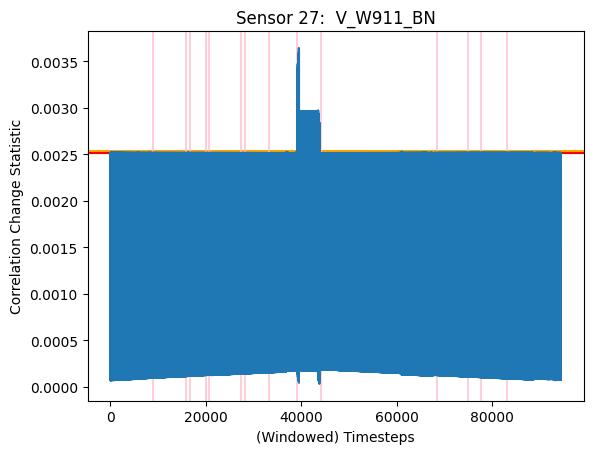

***********************************************************************************************
Sensor 28:  V_W911_CN


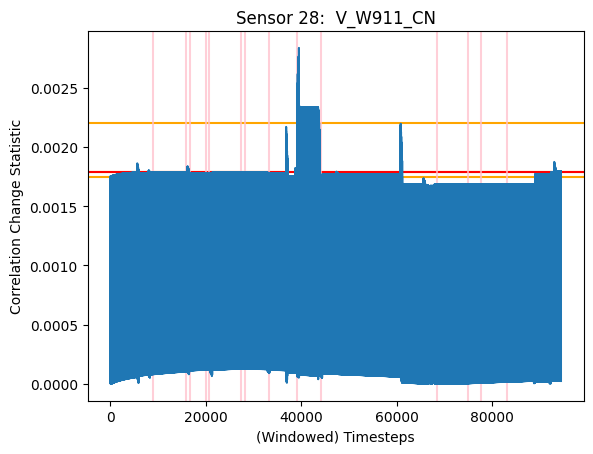

***********************************************************************************************
Sensor 29:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A


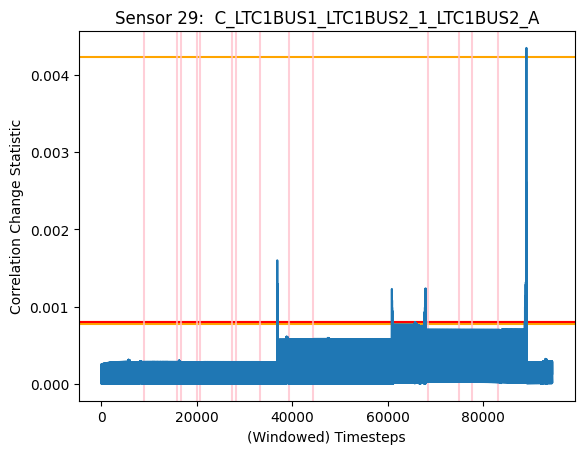

***********************************************************************************************
Sensor 30:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B
DD = None


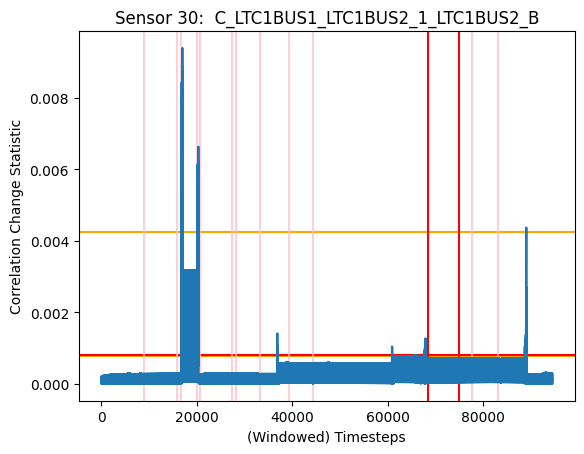

***********************************************************************************************
Sensor 31:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_N


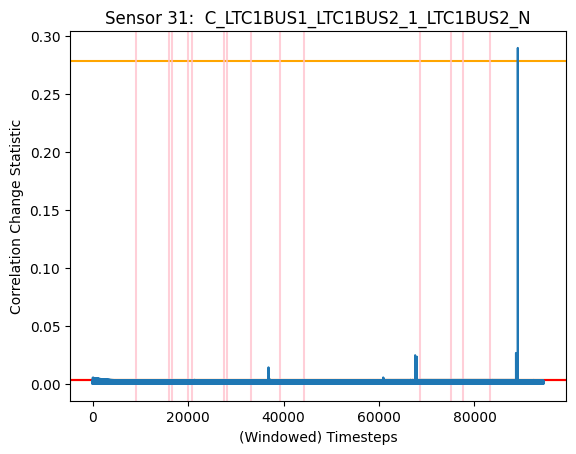

***********************************************************************************************
Sensor 32:  V_BUS13KV1_AN


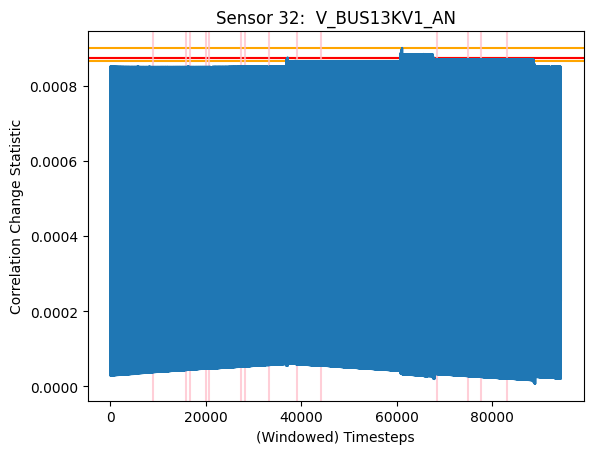

***********************************************************************************************
Sensor 33:  V_BUS13KV1_BN


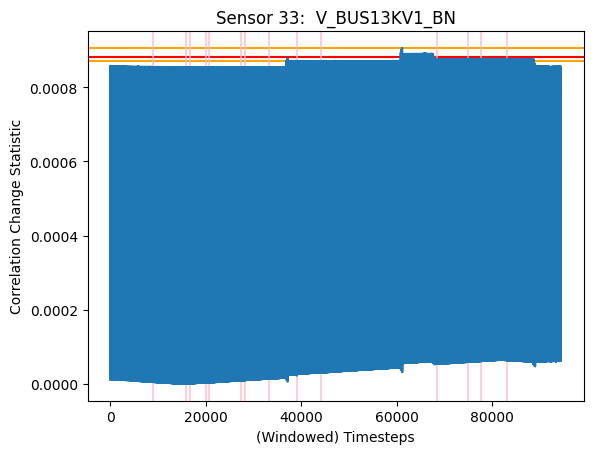

***********************************************************************************************
Sensor 34:  V_BUS13KV1_CN
DD = None


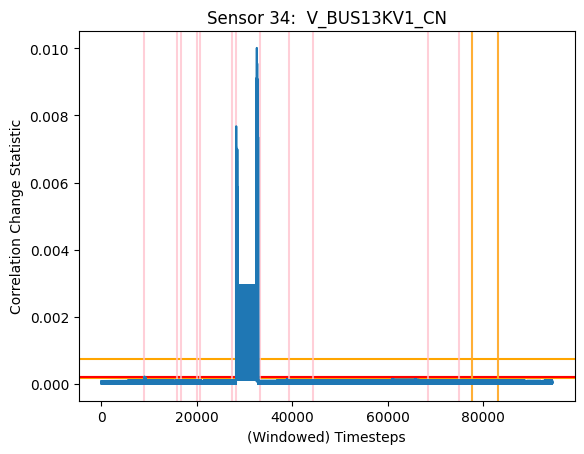

***********************************************************************************************
Sensor 35:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_A
DD = None


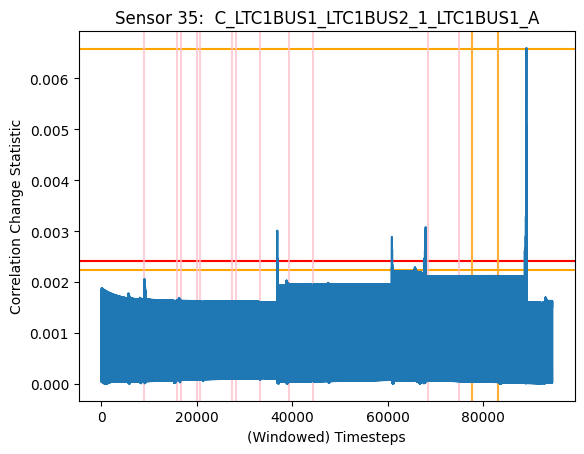

***********************************************************************************************
Sensor 36:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_B
DD = None


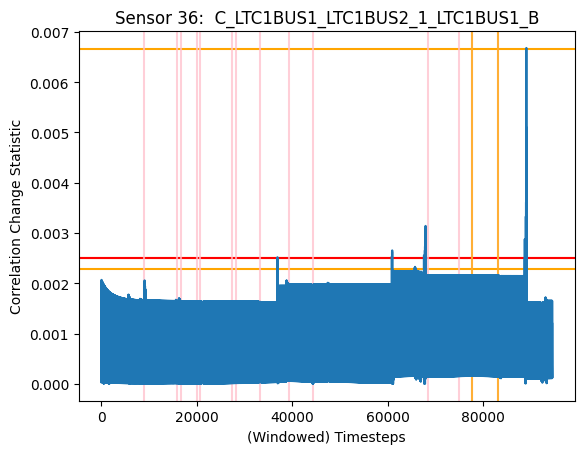

***********************************************************************************************
Sensor 37:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_N
DD = None


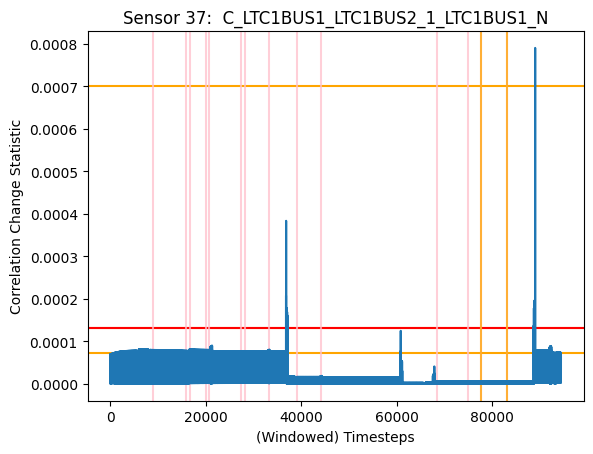

***********************************************************************************************
Sensor 38:  V_W9111_AN
DD = None


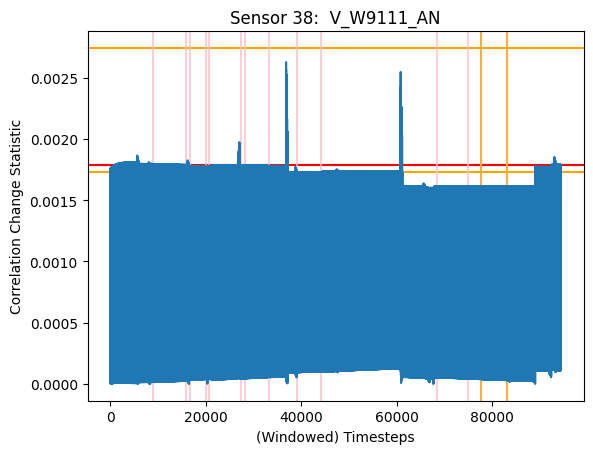

***********************************************************************************************
Sensor 39:  V_W9111_BN
DD = None


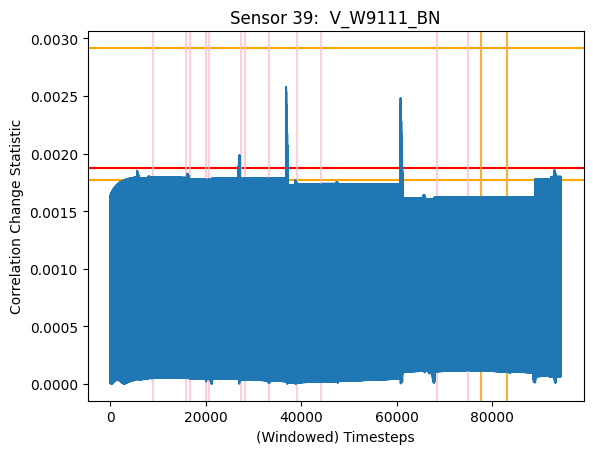

***********************************************************************************************
Sensor 40:  V_W9111_CN
DD = None


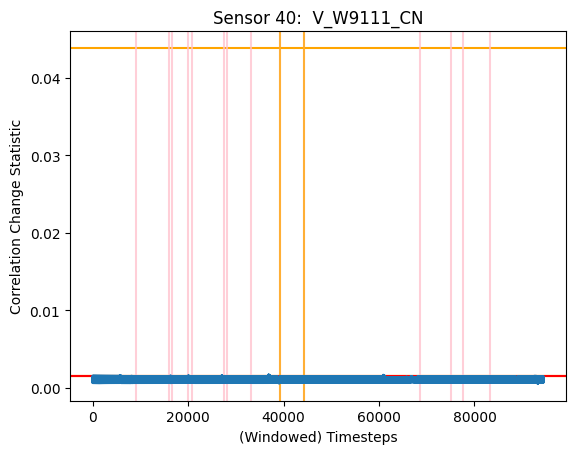

***********************************************************************************************
Sensor 41:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_A
DD = None


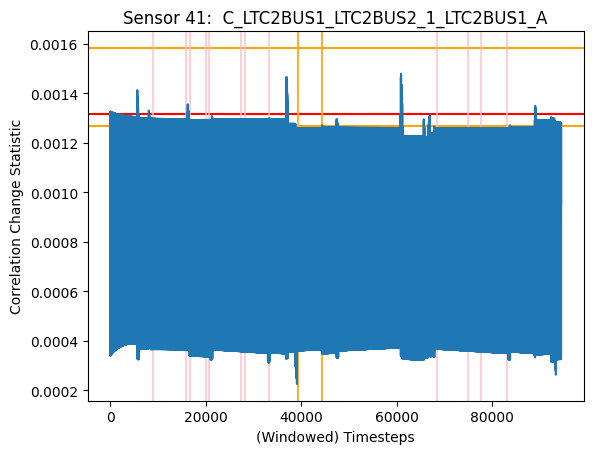

***********************************************************************************************
Sensor 42:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_B
DD = None
DD = 4814


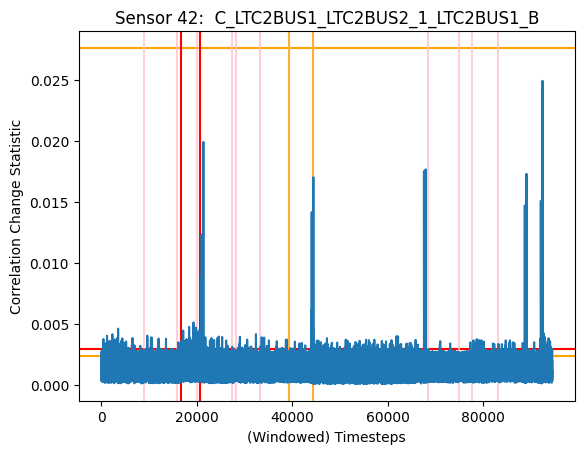

***********************************************************************************************
Sensor 43:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_N
DD = None
DD = None


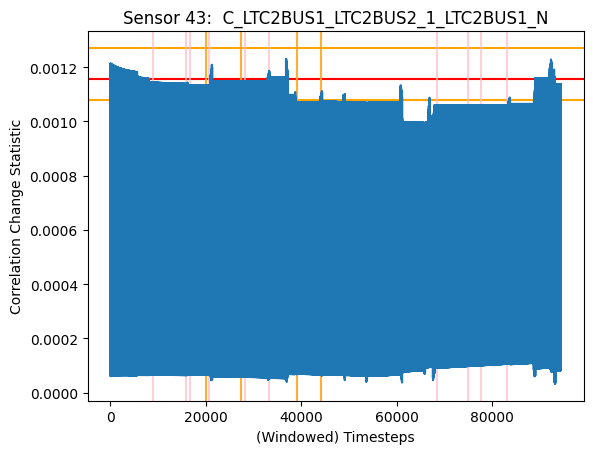

***********************************************************************************************
Sensor 44:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_A
DD = None
DD = None


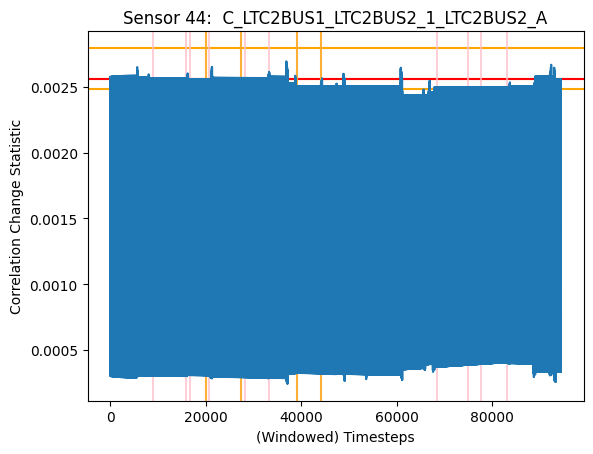

***********************************************************************************************
Sensor 45:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_B
DD = None
DD = None
DD = None


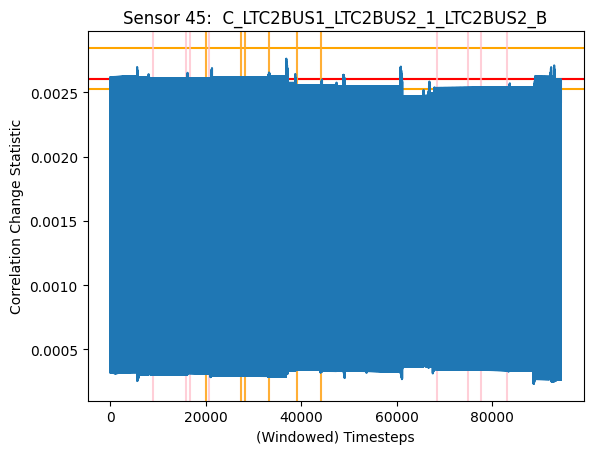

***********************************************************************************************
Sensor 46:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_C
DD = None
DD = None


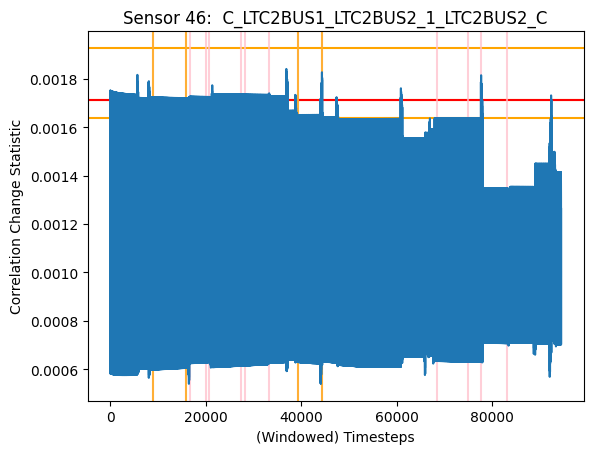

***********************************************************************************************
Sensor 47:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_N
DD = None
DD = 4811


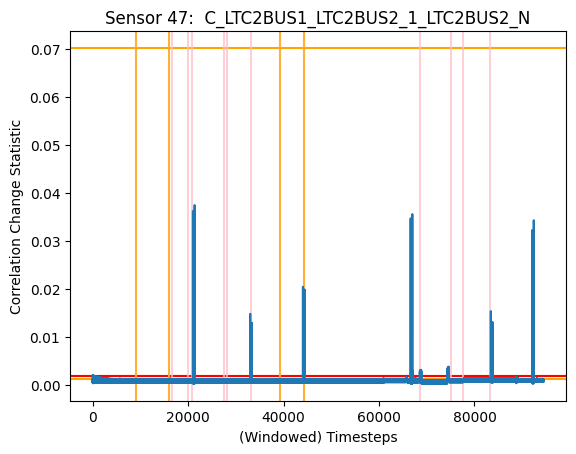

***********************************************************************************************
Sensor 48:  V_BUS13KV2_AN
DD = None
DD = 4808


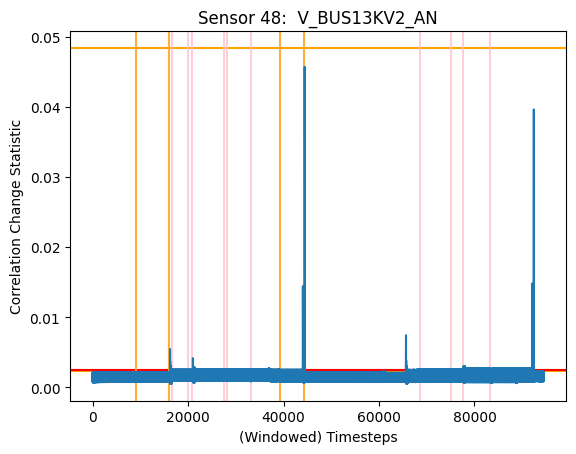

***********************************************************************************************
Sensor 49:  V_BUS13KV2_CN
DD = None


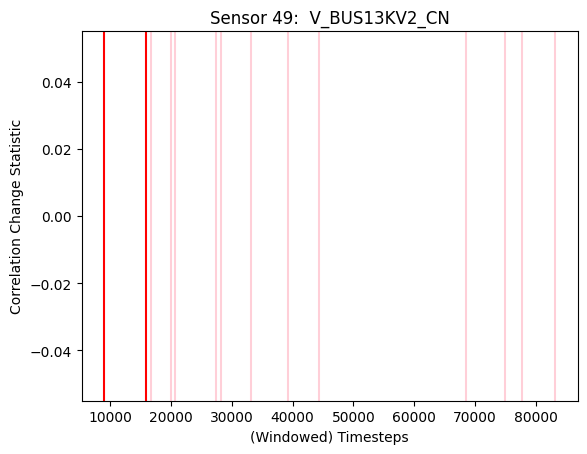

***********************************************************************************************
Sensor 50:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_A
DD = None


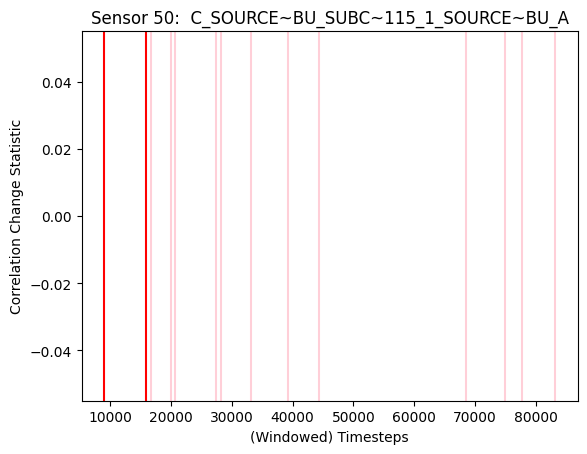

***********************************************************************************************
Sensor 51:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_B
DD = None


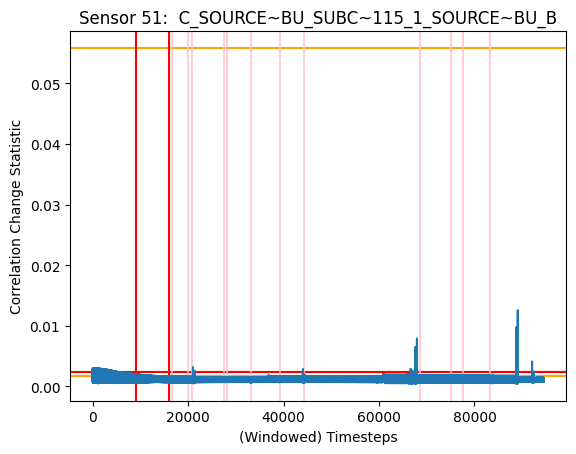

***********************************************************************************************
Sensor 52:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_N


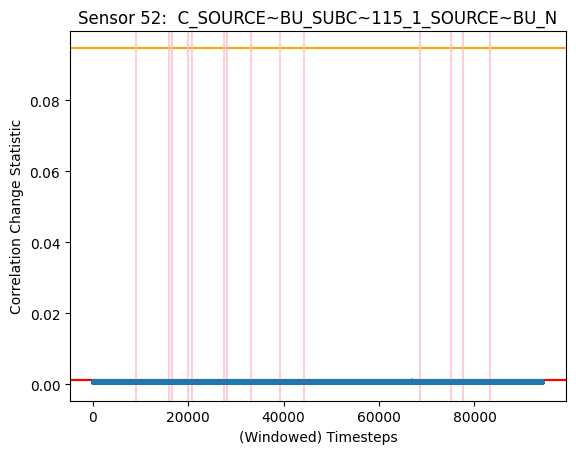

***********************************************************************************************
Sensor 53:  V_SOURCE-BU_AN


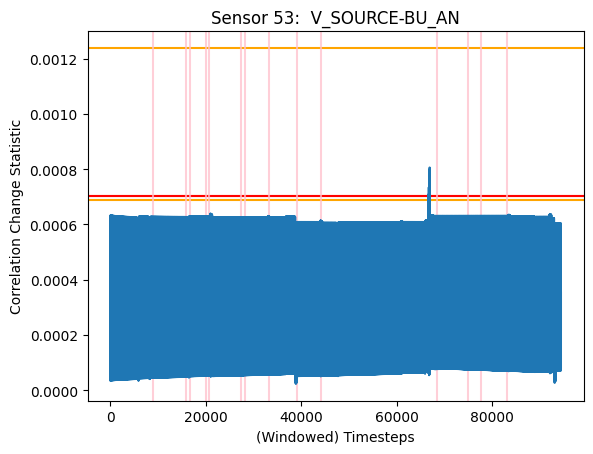

***********************************************************************************************
Sensor 54:  V_SOURCE-BU_BN
DD = None


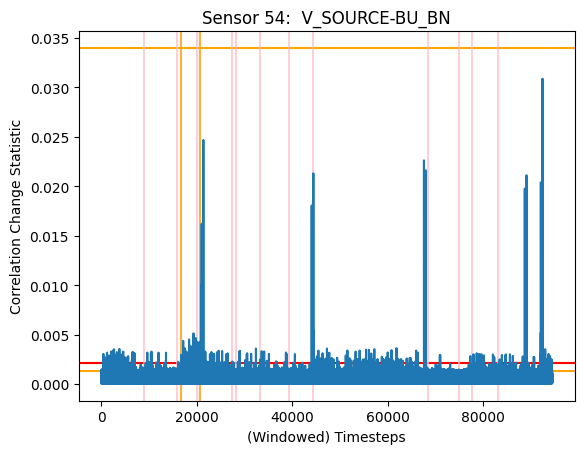

***********************************************************************************************
Sensor 55:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_A
DD = None
DD = None


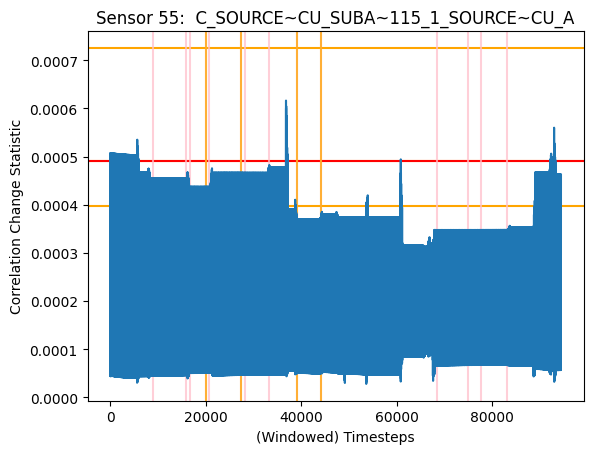

***********************************************************************************************
Sensor 56:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_B
DD = None
DD = None


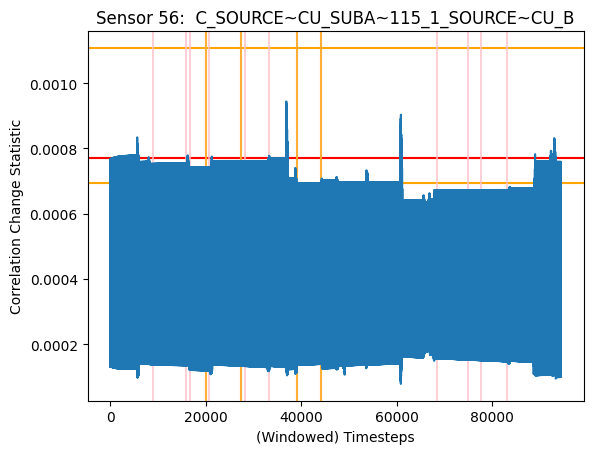

***********************************************************************************************
Sensor 57:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_C
DD = None
DD = None
DD = None


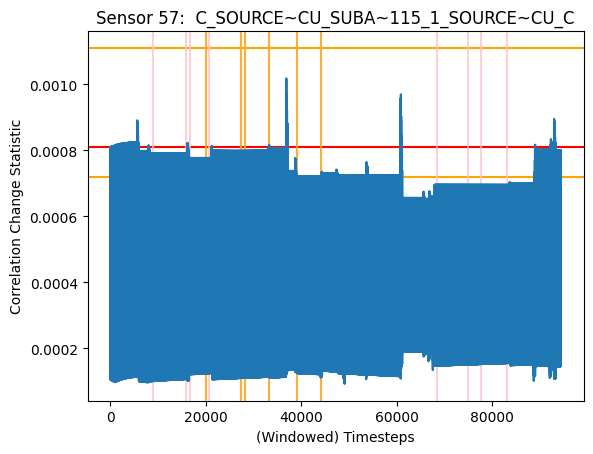

***********************************************************************************************
Sensor 58:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_N
DD = None


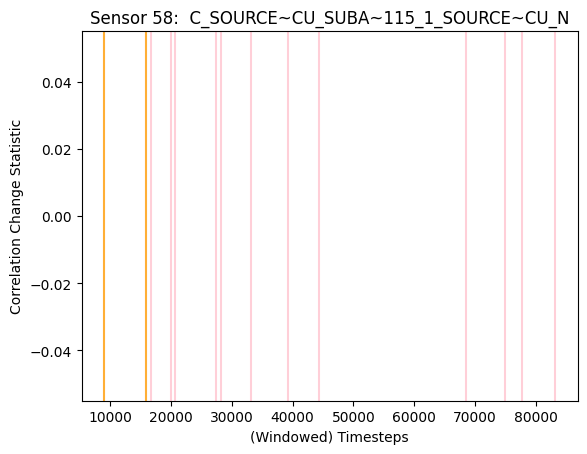

***********************************************************************************************
Sensor 59:  V_SOURCE-CU_AN
DD = None


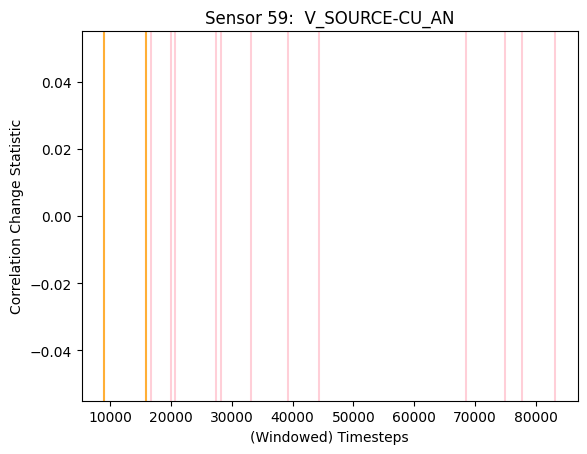

***********************************************************************************************
Sensor 60:  V_SOURCE-CU_BN
DD = None


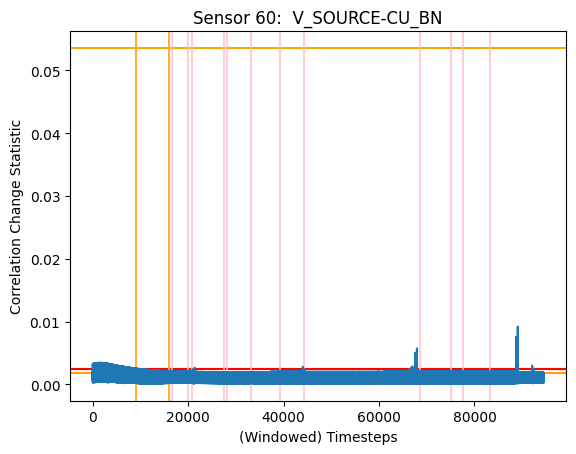

***********************************************************************************************
Sensor 61:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_A
DD = None


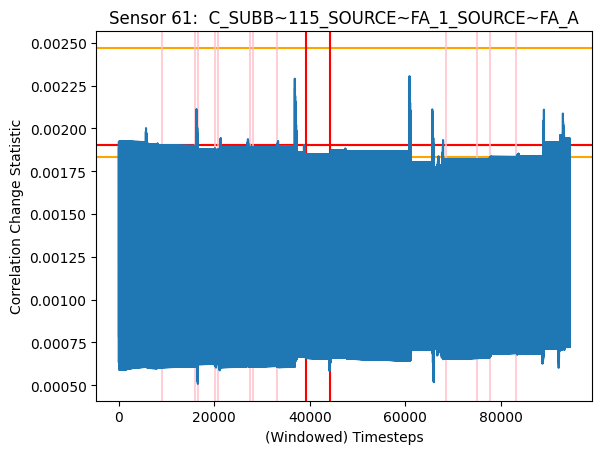

***********************************************************************************************
Sensor 62:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_B
DD = 4814


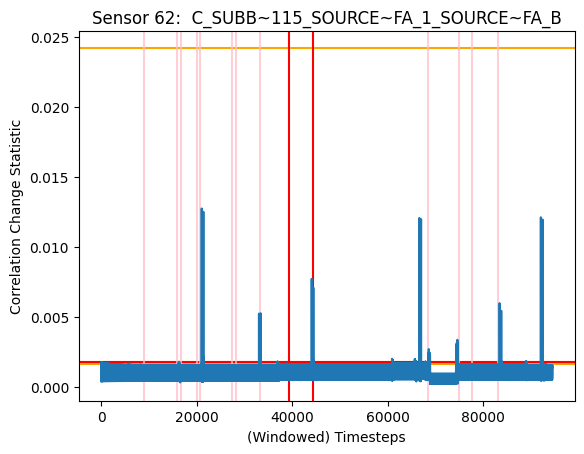

***********************************************************************************************
Sensor 63:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_C
DD = None
DD = 4806


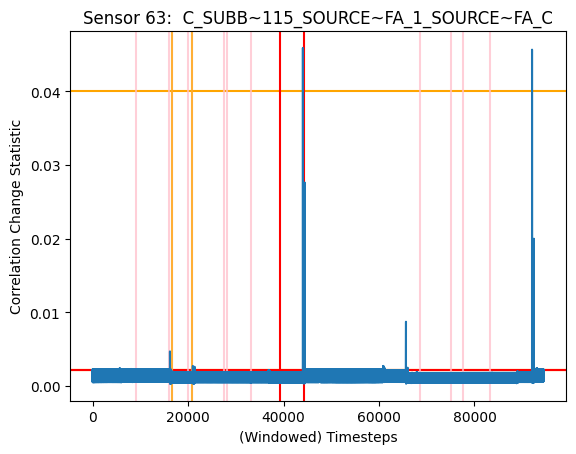

***********************************************************************************************
Sensor 64:  V_SOURCE-FA_AN
DD = None
DD = None


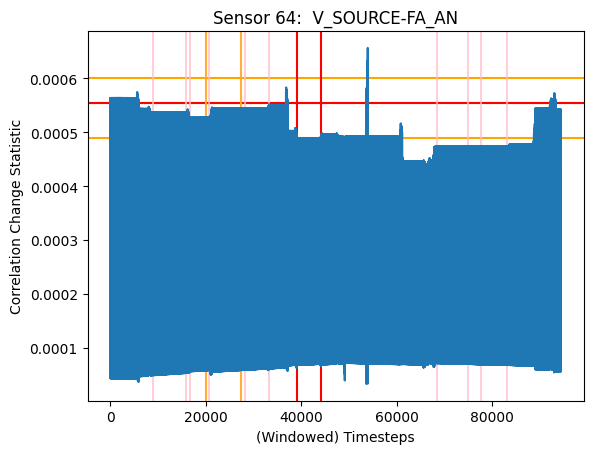

***********************************************************************************************
Sensor 65:  V_SOURCE-FA_BN
DD = None
DD = None


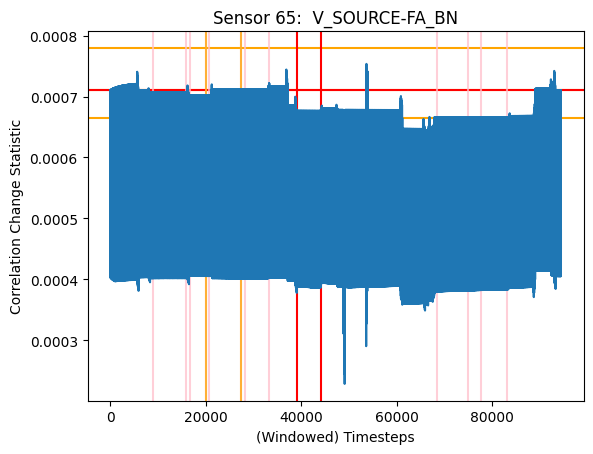

***********************************************************************************************
Sensor 66:  V_SOURCE-FA_CN
DD = None
DD = None
DD = None


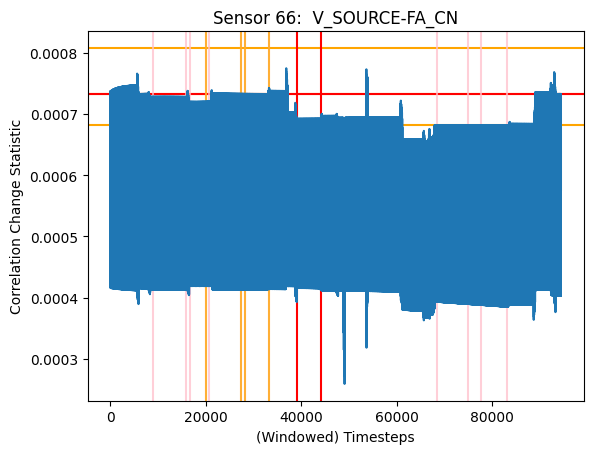

***********************************************************************************************
Sensor 67:  C_W738_W737_2_W737_A


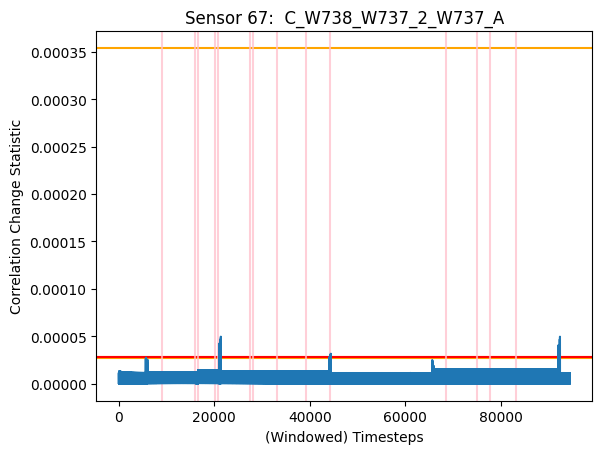

***********************************************************************************************
Sensor 68:  C_W738_W737_2_W737_B


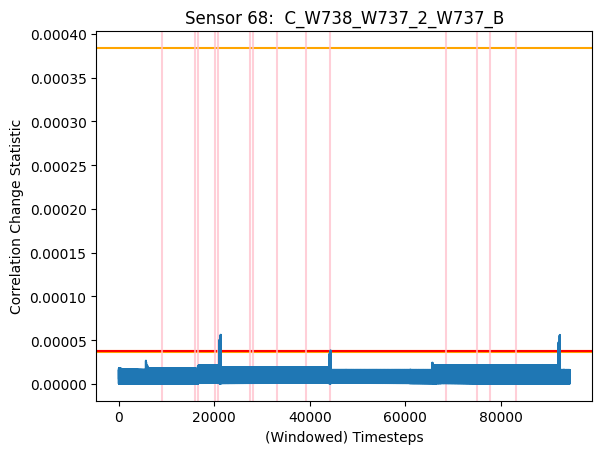

***********************************************************************************************
Sensor 69:  C_W738_W737_2_W737_C


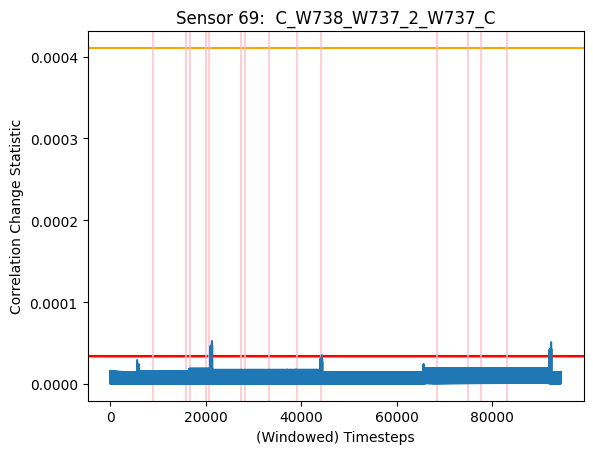

***********************************************************************************************
Sensor 70:  V_W738_AN
DD = None


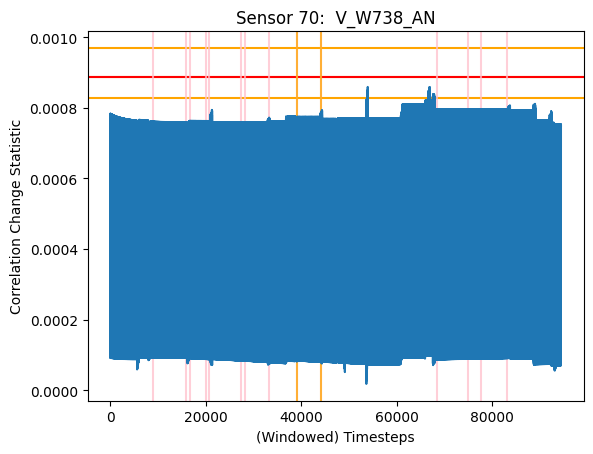

***********************************************************************************************
Sensor 71:  V_W738_BN
DD = None


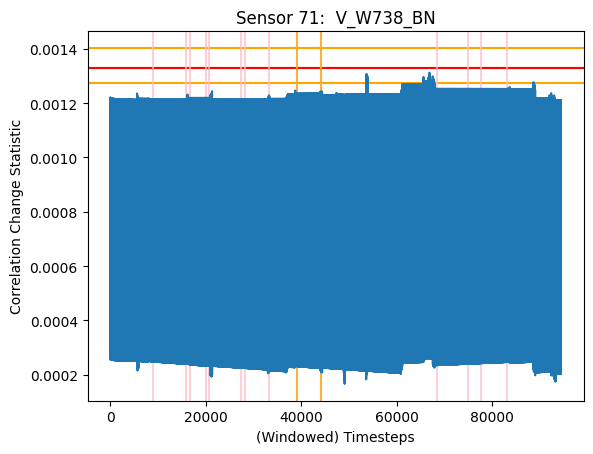

***********************************************************************************************
Sensor 72:  V_W738_CN
DD = None
DD = None


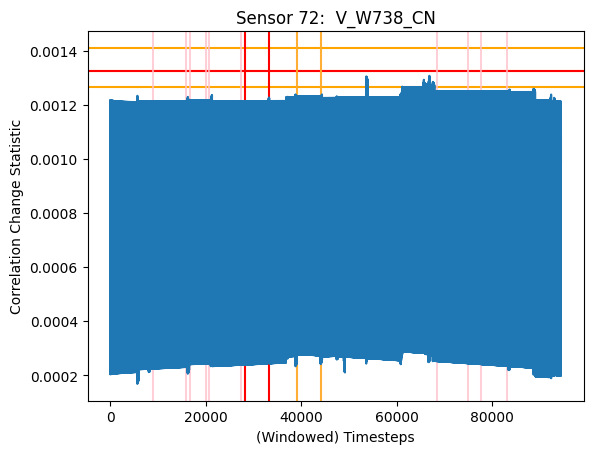

***********************************************************************************************
Sensor 73:  C_W747_W748_2_W747_A
DD = None


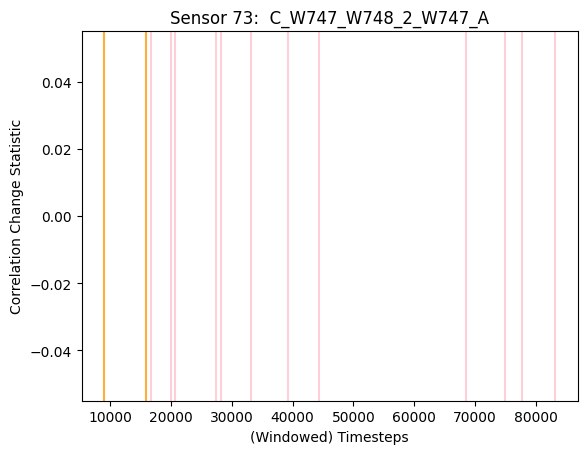

***********************************************************************************************
Sensor 74:  C_W747_W748_2_W747_B
DD = None


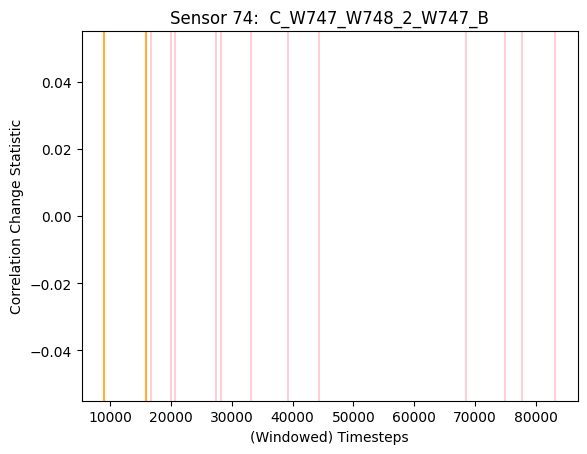

***********************************************************************************************
Sensor 75:  C_W747_W748_2_W747_C
DD = None


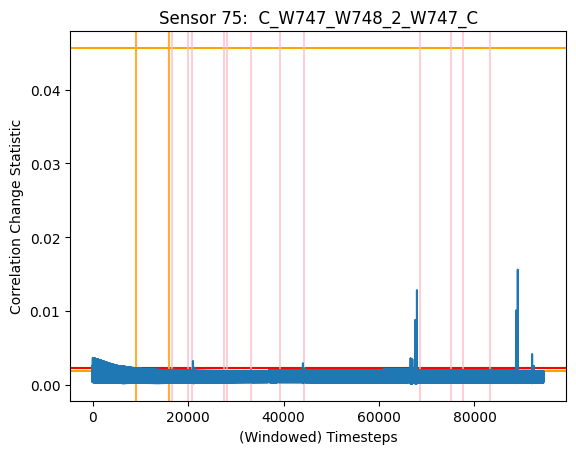

***********************************************************************************************
Sensor 76:  V_W748_AN
DD = None
DD = None
DD = None


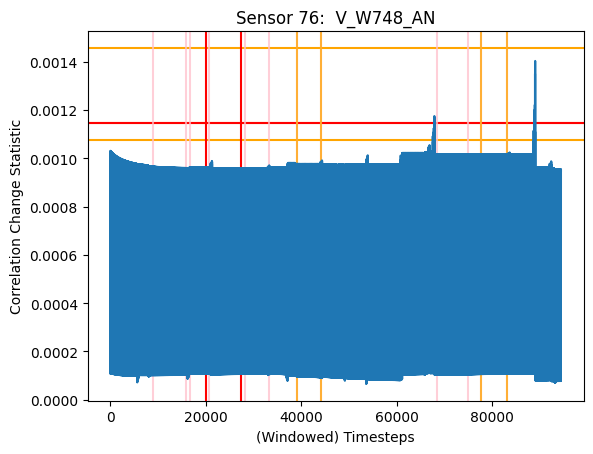

***********************************************************************************************
Sensor 77:  V_W748_BN
DD = None
DD = None
DD = None


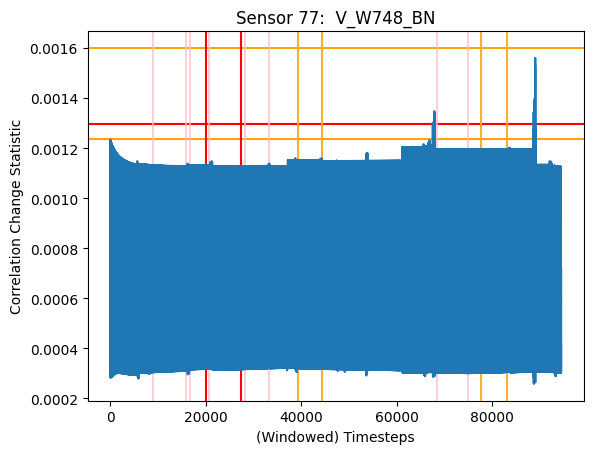

***********************************************************************************************
Sensor 78:  V_W748_CN
DD = None
DD = None
DD = None


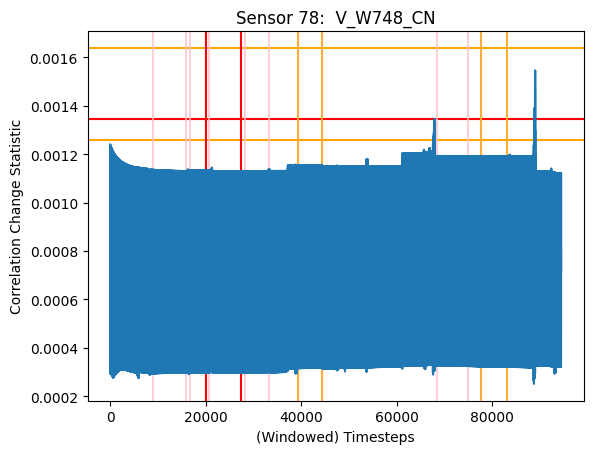

***********************************************************************************************
Sensor 79:  C_W787_W788_2_W787_A
DD = None


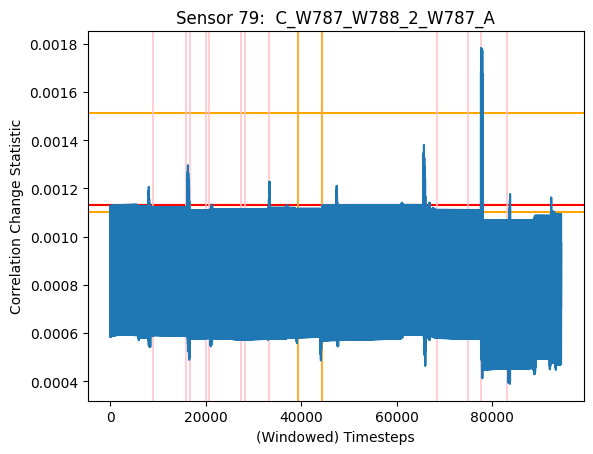

***********************************************************************************************
Sensor 80:  C_W787_W788_2_W787_B
DD = 4812


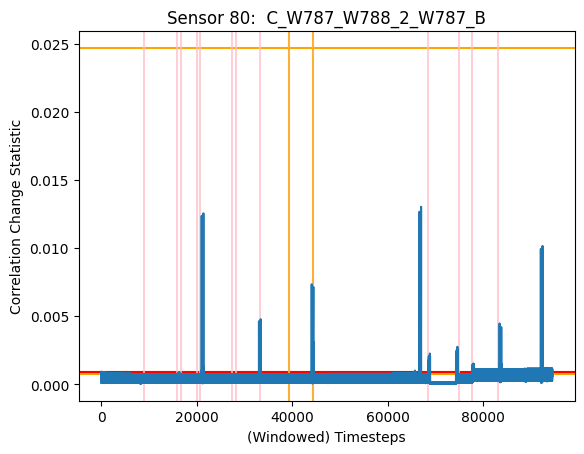

***********************************************************************************************
Sensor 81:  C_W787_W788_2_W787_C
DD = 4806


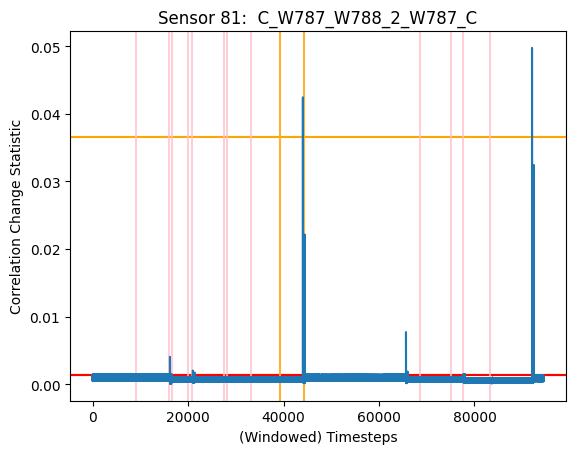

***********************************************************************************************
Sensor 82:  V_W788_AN
DD = 7


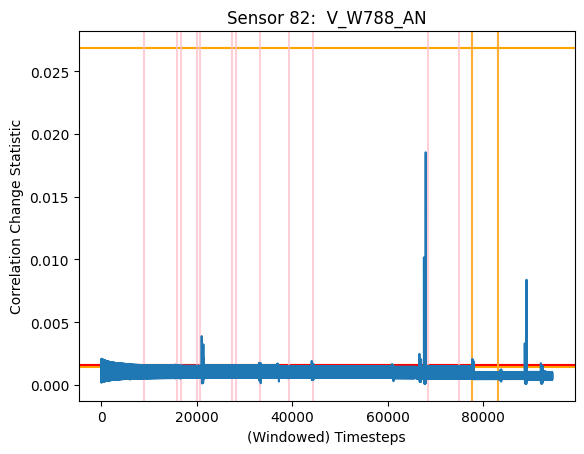

***********************************************************************************************
Sensor 83:  V_W788_BN
DD = 32


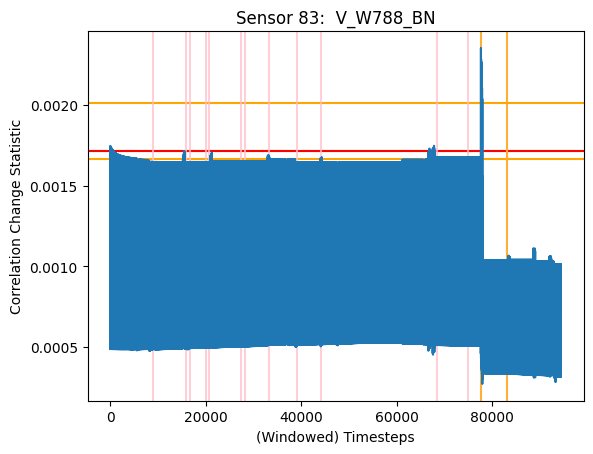

***********************************************************************************************
Sensor 84:  V_W788_CN
DD = 19


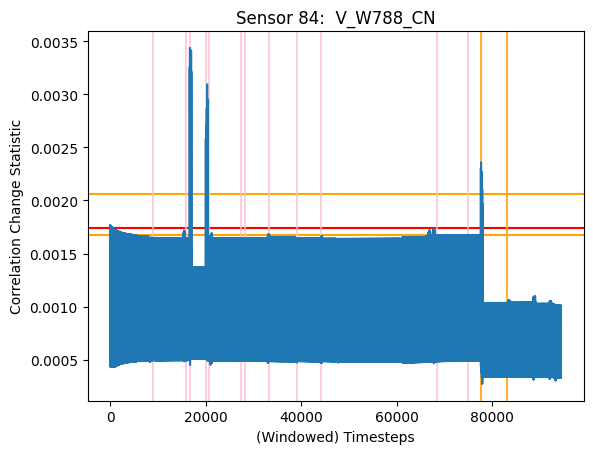

***********************************************************************************************
Sensor 85:  C_W797_W798_2_W797_B


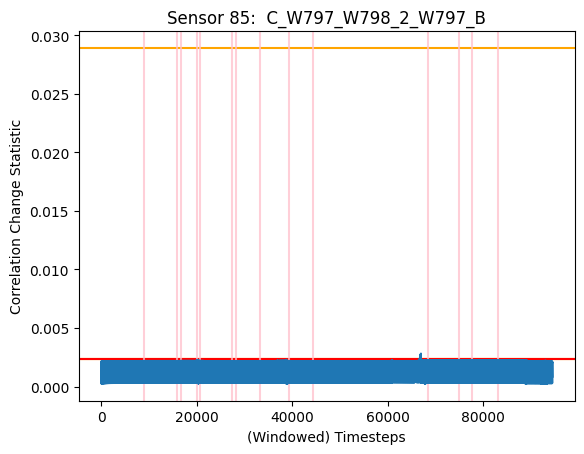

***********************************************************************************************
Sensor 86:  C_W797_W798_2_W797_C


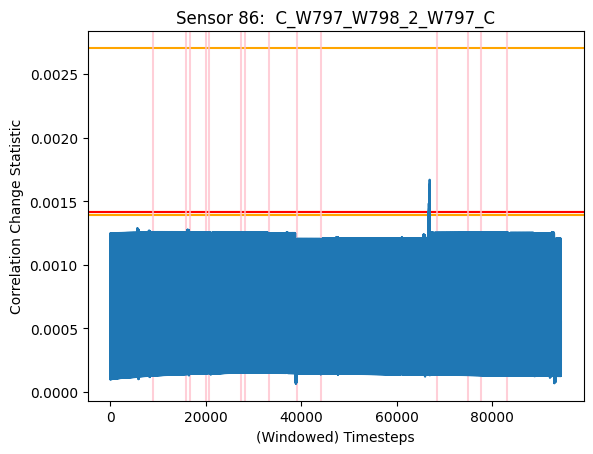

***********************************************************************************************
Sensor 87:  C_W797_W798_2_W797_N
DD = None


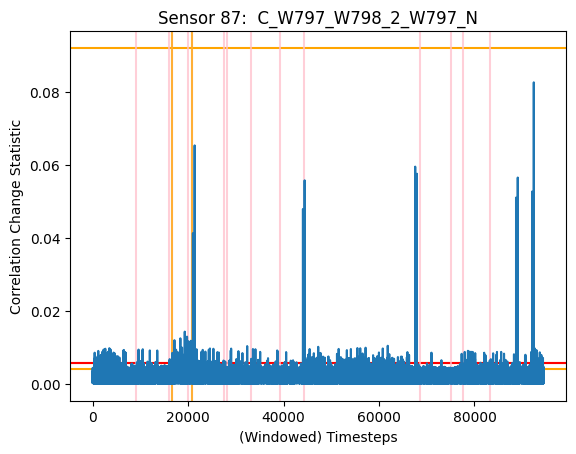

***********************************************************************************************
Sensor 88:  C_FD2B2_FD2B1_1_FD2B1_B
DD = None


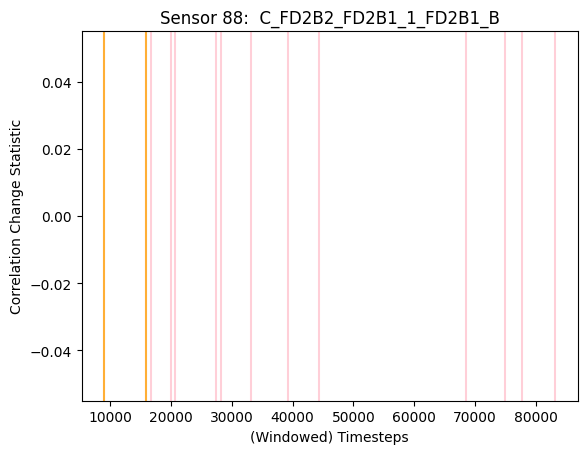

***********************************************************************************************
Sensor 89:  C_FD2B2_FD2B1_1_FD2B1_C
DD = None


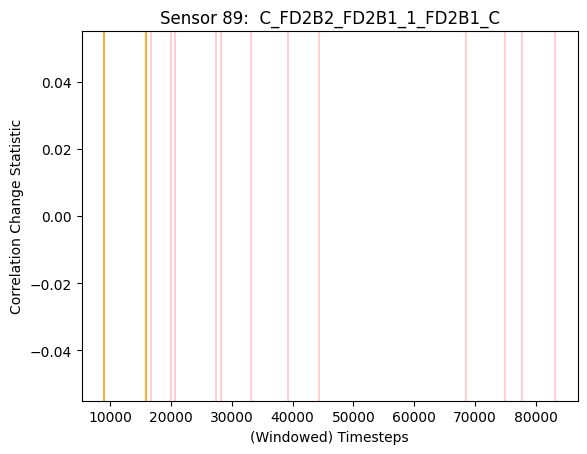

***********************************************************************************************
Sensor 90:  C_FD2B2_FD2B1_1_FD2B1_N
DD = None


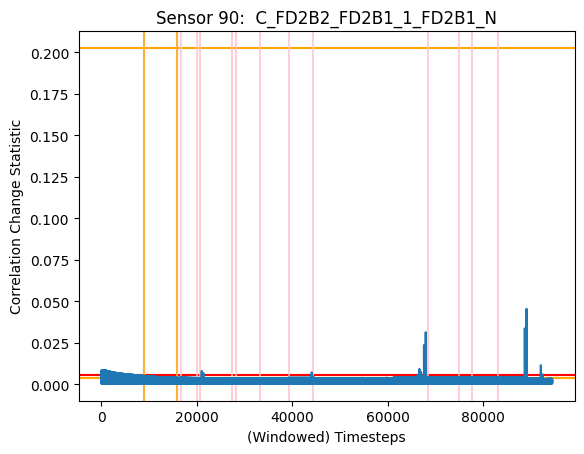

***********************************************************************************************
Sensor 91:  C_FD2B5_FD2B6_1_FD2B5_B
DD = None


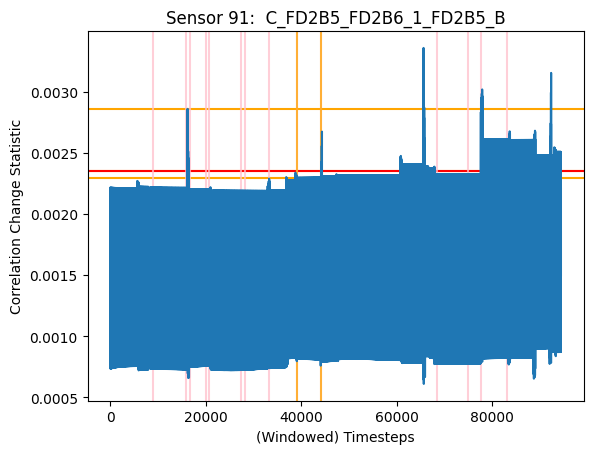

***********************************************************************************************
Sensor 92:  C_FD2B5_FD2B6_1_FD2B5_C
DD = 4809


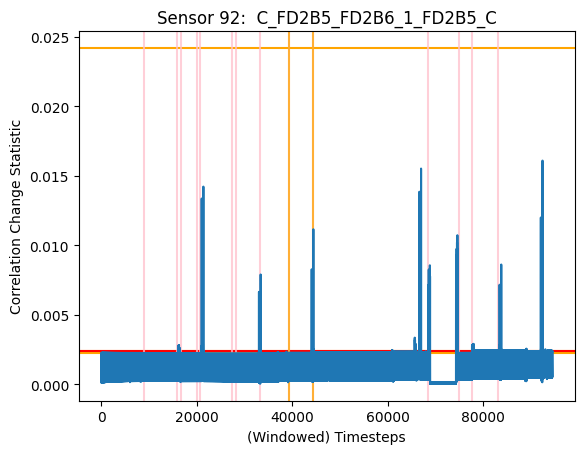

***********************************************************************************************
Sensor 93:  C_FD2B5_FD2B6_1_FD2B5_N
DD = 4806


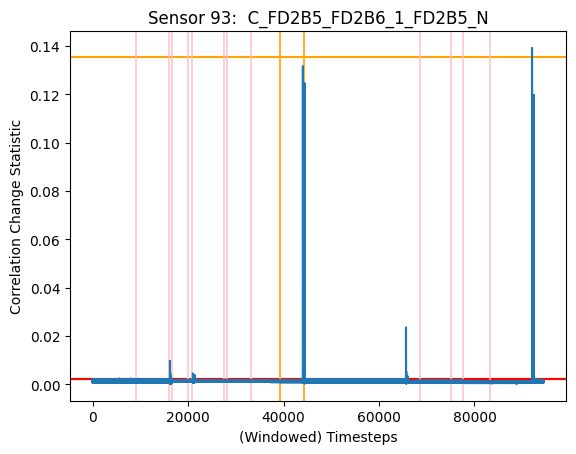

[None, None, None, None, 969, None, None, 6, 39, 66, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, 4814, None, None, None, None, None, None, None, None, None, None, 4811, None, 4808, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, 4814, None, 4806, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, 4812, 4806, 7, 32, 19, None, None, None, None, None, 4809, 4806]


In [65]:
LD_corr = []
at_neighbor = {}

rsum_list = rsum_list_corr
threshold = thresholds_corr_99
t_list = t_corr
persistency = 5

for index, i in enumerate(rsum_list):
    print("***********************************************************************************************")
    attack_in = (i > threshold[index]).nonzero()

    violations = (rsum_list > threshold.reshape(-1, 1))

    print(f"Sensor {things[index]}: {cols[things[index]-1]}")
    at_neighbor[things[index]] = attack_in
    plt.title(f"Sensor {things[index]}: {cols[things[index]-1]}")
    plt.xlabel("(Windowed) Timesteps")
    plt.ylabel("Correlation Change Statistic")

    for t in t_list:
        plt.axhline(t[index], color='orange')

    plt.axhline(threshold[index], color='red')

    if things[index] in attack_dict:
        #if sensor is being attacked

        # ground truth
        attack_indices = df_test.index[
            (df_test['Time'] >= attack_dict[things[index]][0] * 1e6) &
            (df_test['Time'] <= attack_dict[things[index]][1] * 1e6)] - 1201

        for start, end in sorted(list(all_attack_indices)):

            # if this is the attack time of the sensor, plot solid red lines
            if attack_indices[0] == start:
                DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                LD_corr.append(DD)
                print(f"DD = {DD}")
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='red')
                plt.axvline(end_w, color='red')

            # otherwise, plot pink lines
            else:
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='pink', alpha=0.75)
                plt.axvline(end_w, color='pink', alpha=0.75)

                start_w = start-window-w
                end_w = end+window+w-1
                for starts, ate in attack_i.items():
                  if starts == start and things[index] in ate:
                    DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                    LD_corr.append(DD)
                    print(f"DD = {DD}")
                    plt.axvline(start_w, color='orange', alpha=0.75)
                    plt.axvline(end_w, color='orange', alpha=0.75)

    else:
         for start, end in sorted(list(all_attack_indices)):
            start_w = start-window-w
            end_w = end+window+w-1
            plt.axvline(start_w, color='pink', alpha=0.75)
            plt.axvline(end_w, color='pink', alpha=0.75)
            for starts, ate in attack_i.items():
                if starts == start:
                    if things[index] in ate:
#                         print("attack:", start)
#                         print(things[index], ate)
                        DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                        LD_corr.append(DD)
                        print(f"DD = {DD}")
                        plt.axvline(start_w, color='orange', alpha=0.75)
                        plt.axvline(end_w, color='orange', alpha=0.75)

    plt.plot(i)
    plt.show()

print(LD_corr)

***********************************************************************************************
Sensor 1:  C_W919_W910_1_W910_A


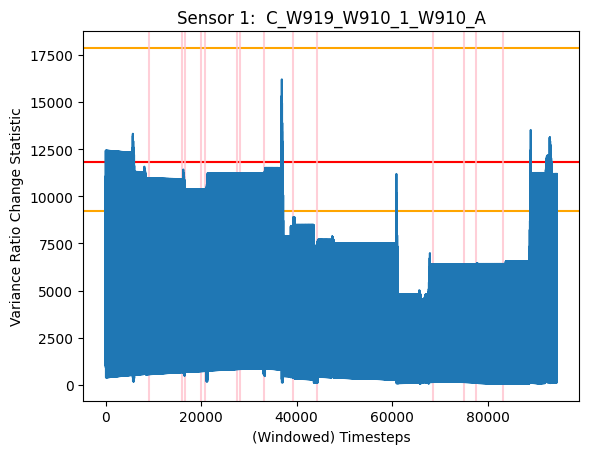

***********************************************************************************************
Sensor 2:  C_W919_W910_1_W910_B


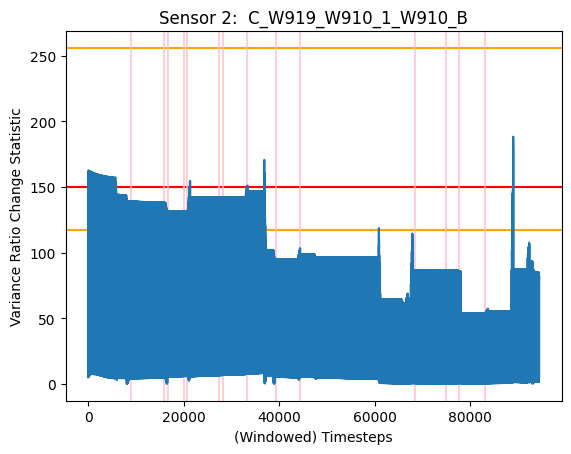

***********************************************************************************************
Sensor 3:  C_W919_W910_1_W910_C
DD = None


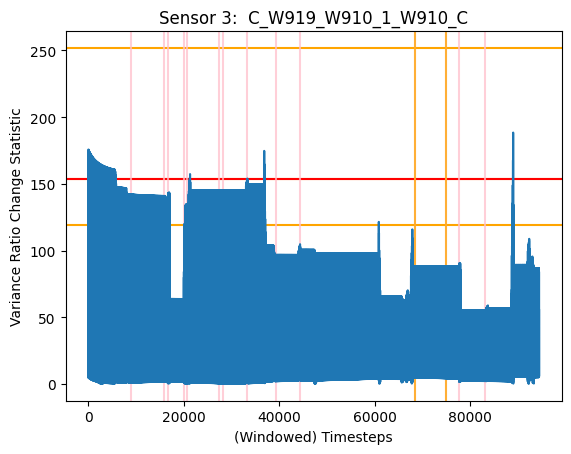

***********************************************************************************************
Sensor 4:  V_W-115KV2_AN
DD = None


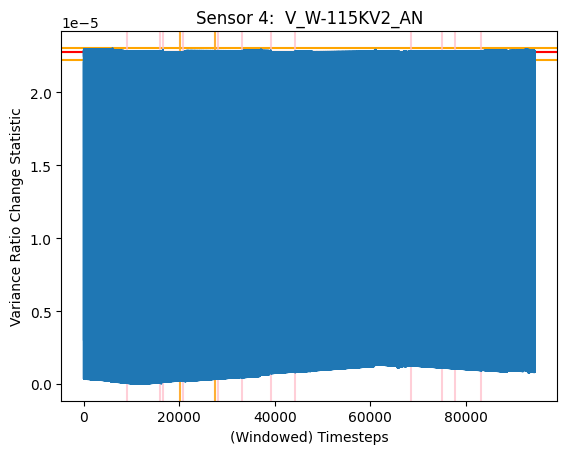

***********************************************************************************************
Sensor 5:  V_W-115KV2_BN
DD = None


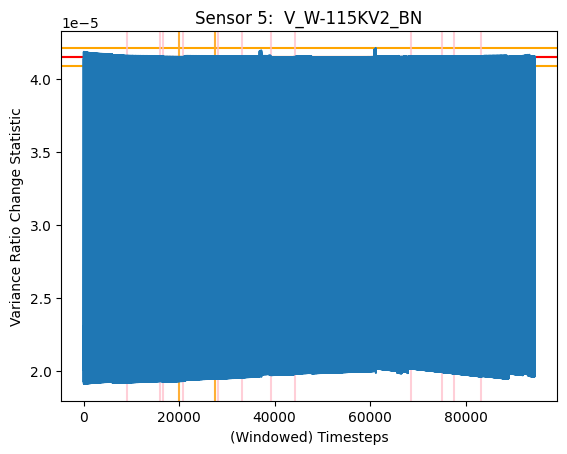

***********************************************************************************************
Sensor 6:  V_W-115KV2_CN
DD = None


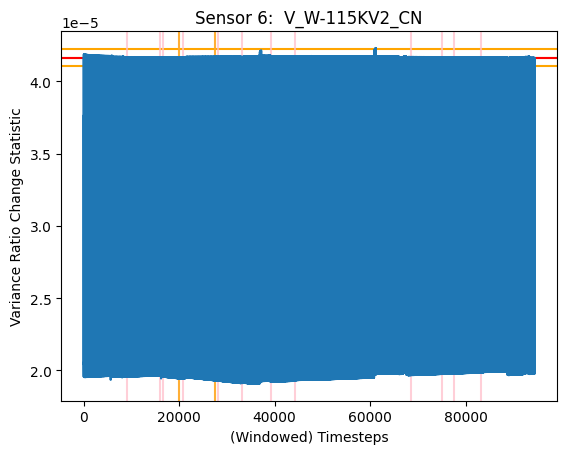

***********************************************************************************************
Sensor 7:  C_W957_W950_1_W950_A


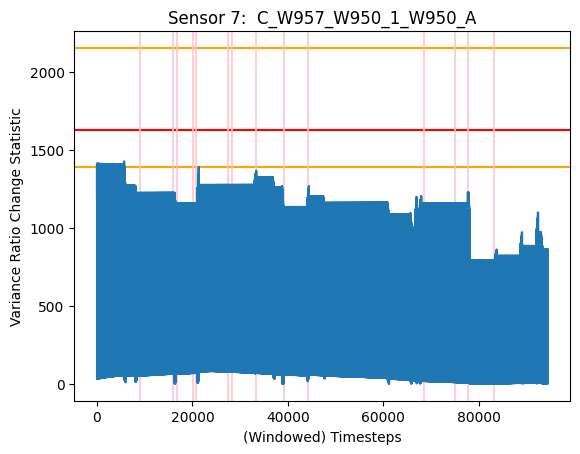

***********************************************************************************************
Sensor 8:  C_W957_W950_1_W950_B


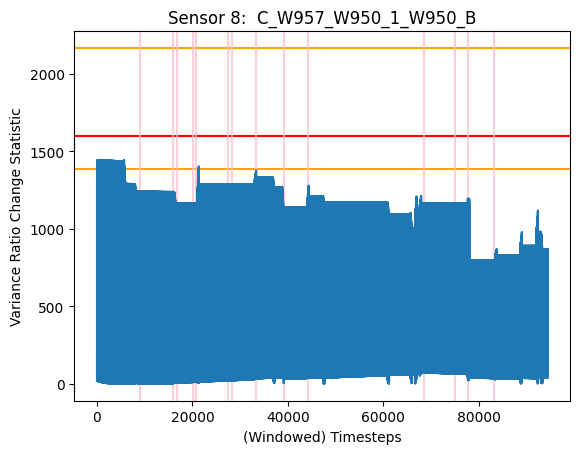

***********************************************************************************************
Sensor 9:  C_W957_W950_1_W950_C


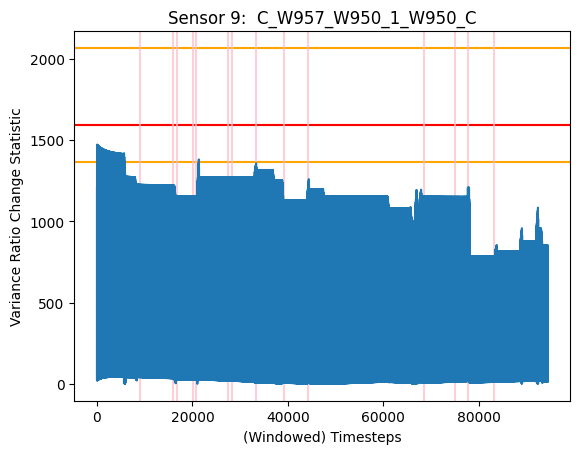

***********************************************************************************************
Sensor 10:  V_W951_AN
DD = None


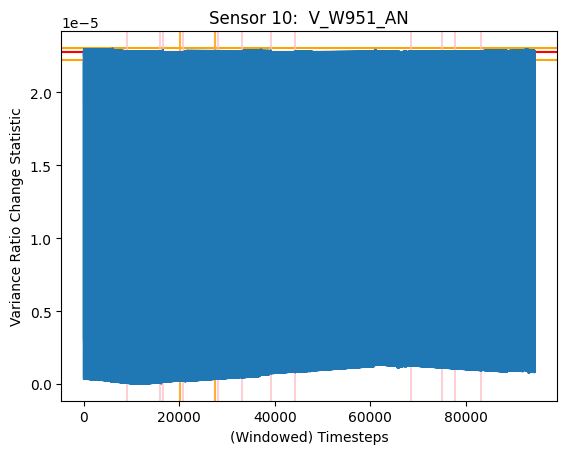

***********************************************************************************************
Sensor 11:  V_W951_BN
DD = None


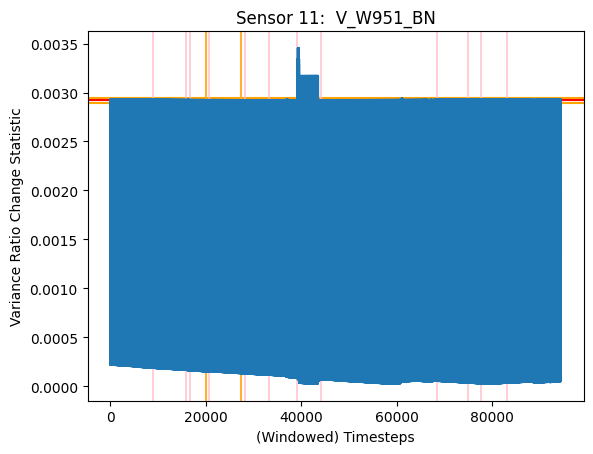

***********************************************************************************************
Sensor 12:  V_W951_CN
DD = None


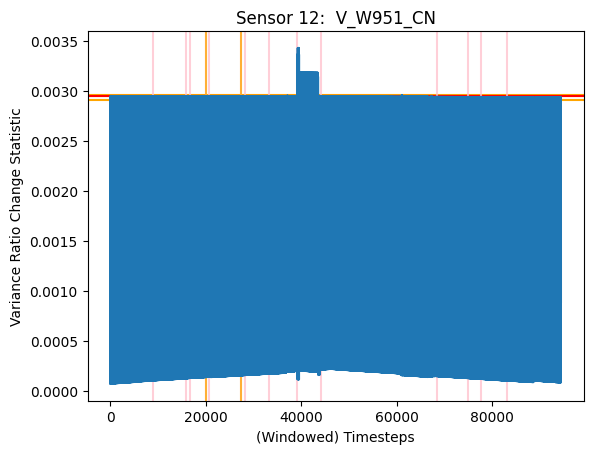

***********************************************************************************************
Sensor 13:  C_W957_W950_1_W957_A
DD = None


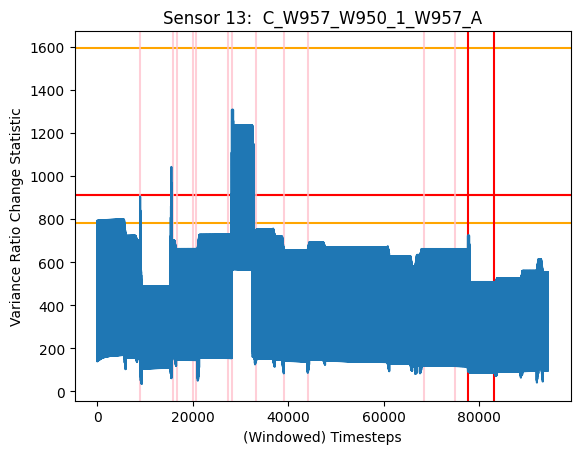

***********************************************************************************************
Sensor 14:  C_W957_W950_1_W957_B
DD = None


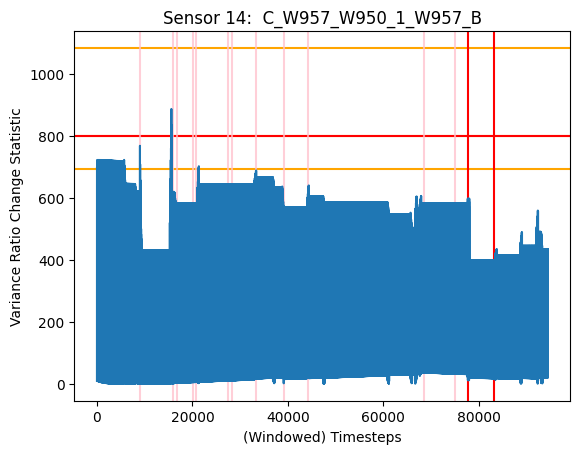

***********************************************************************************************
Sensor 15:  C_W957_W950_1_W957_C
DD = None


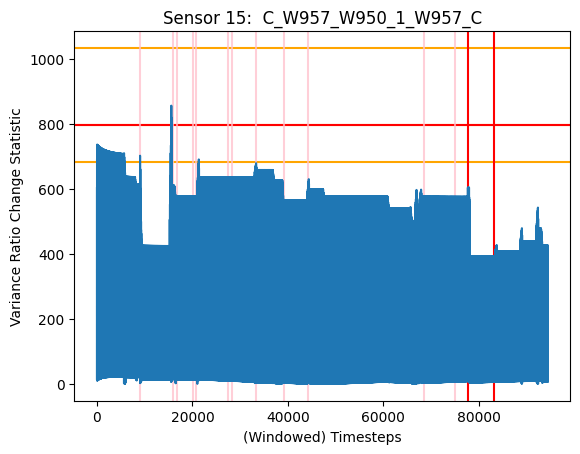

***********************************************************************************************
Sensor 16:  C_W927_W929_1_W929_A
DD = None
DD = None


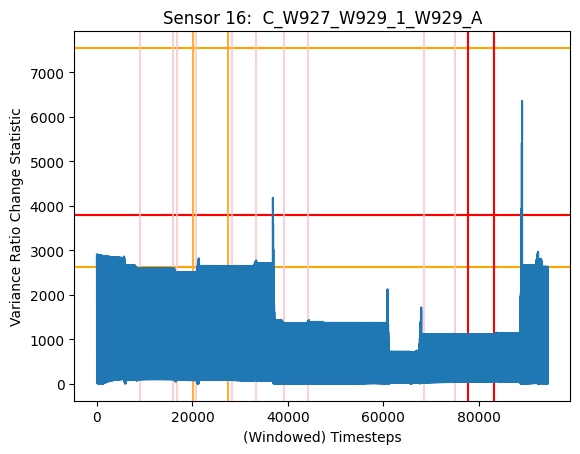

***********************************************************************************************
Sensor 17:  C_W927_W929_1_W929_B
DD = 211
DD = None


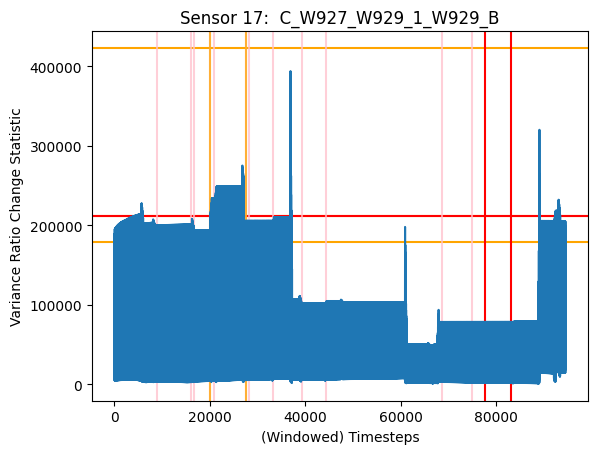

***********************************************************************************************
Sensor 18:  C_W927_W929_1_W929_C
DD = 238
DD = None


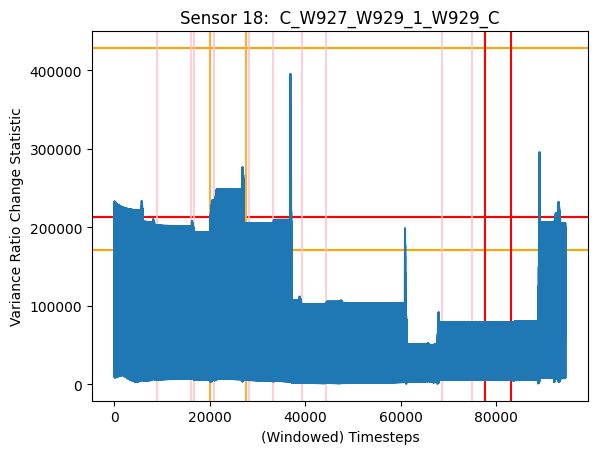

***********************************************************************************************
Sensor 19:  C_W927_W929_1_W929_N


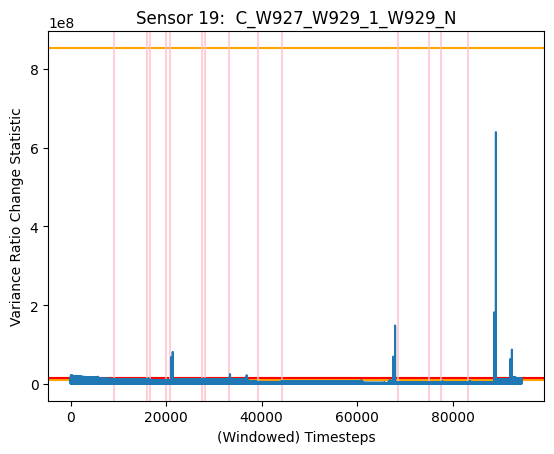

***********************************************************************************************
Sensor 20:  V_W-115KV1_AN


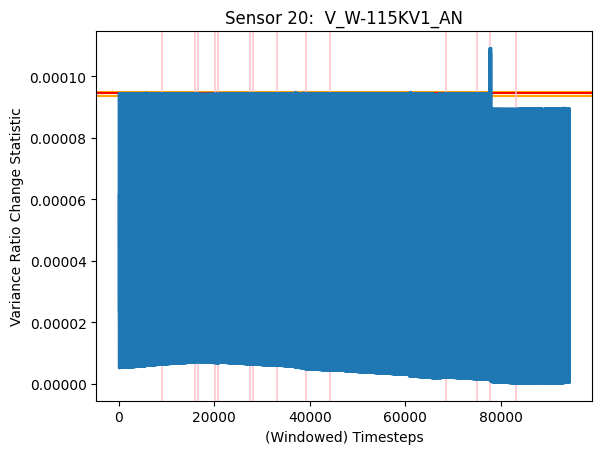

***********************************************************************************************
Sensor 21:  V_W-115KV1_BN


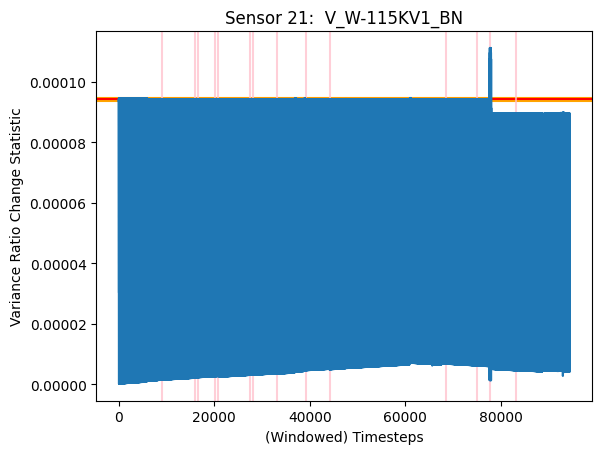

***********************************************************************************************
Sensor 22:  C_W927_W929_1_W927_A
DD = None


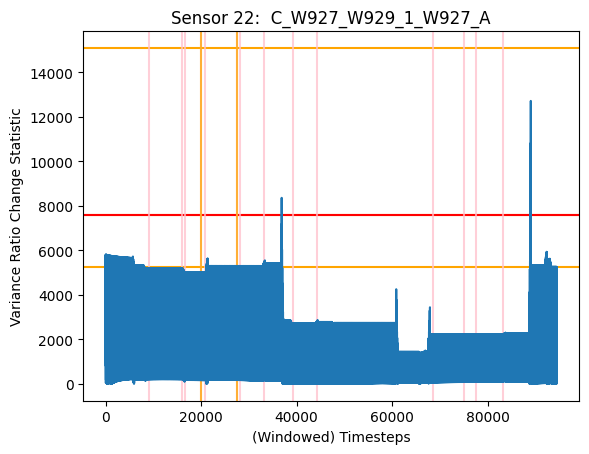

***********************************************************************************************
Sensor 23:  C_W927_W929_1_W927_B
DD = None


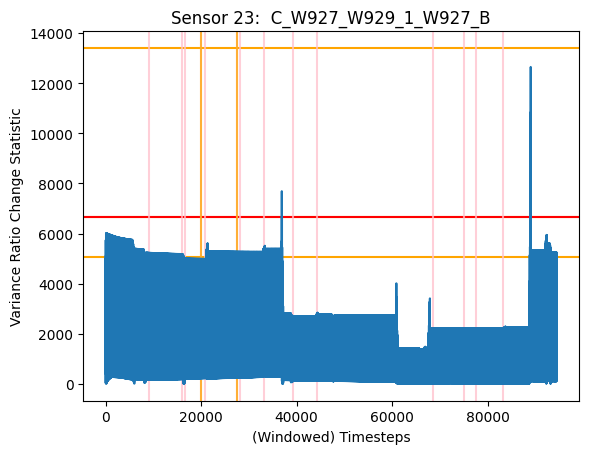

***********************************************************************************************
Sensor 24:  C_W927_W929_1_W927_C
DD = None


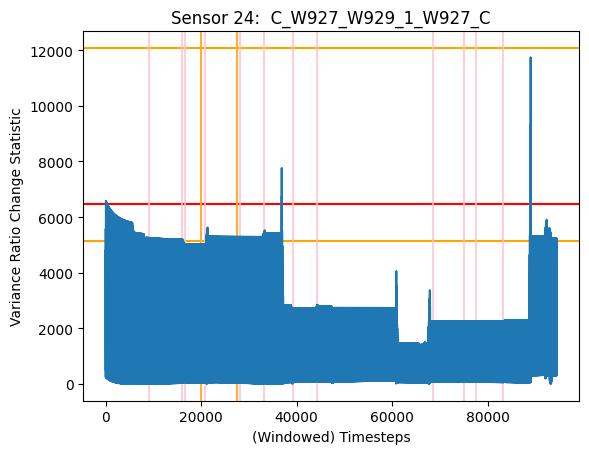

***********************************************************************************************
Sensor 25:  C_W919_W910_1_W919_N


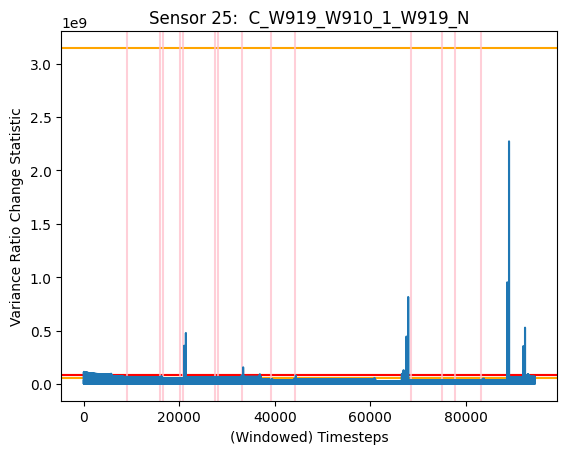

***********************************************************************************************
Sensor 26:  V_W911_AN


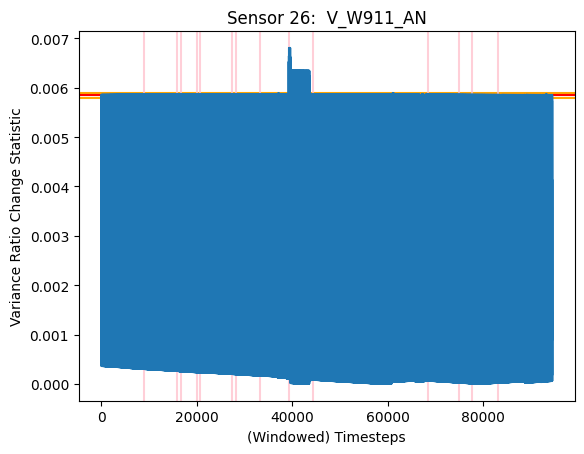

***********************************************************************************************
Sensor 27:  V_W911_BN


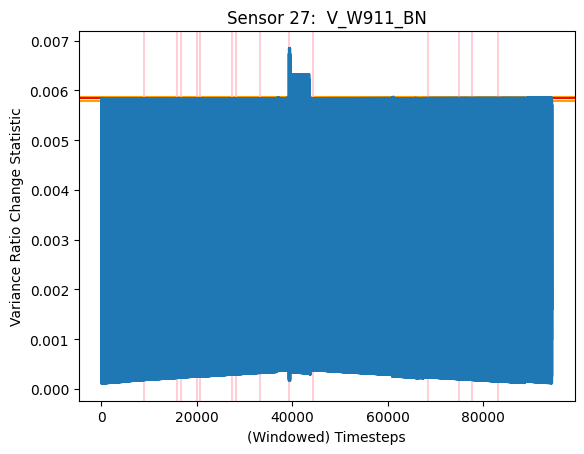

***********************************************************************************************
Sensor 28:  V_W911_CN


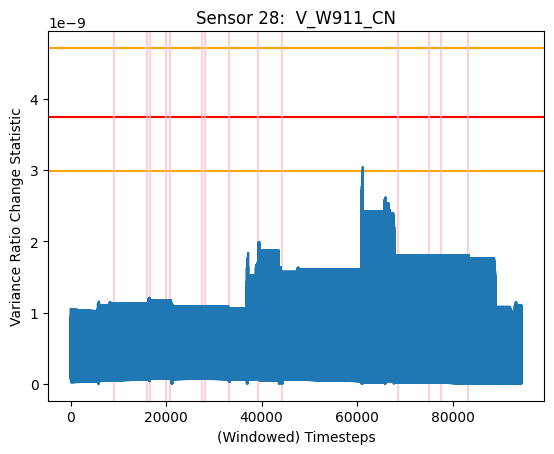

***********************************************************************************************
Sensor 29:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A


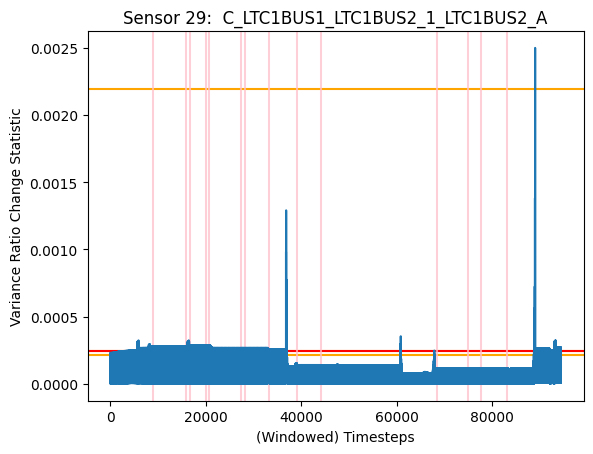

***********************************************************************************************
Sensor 30:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B
DD = None


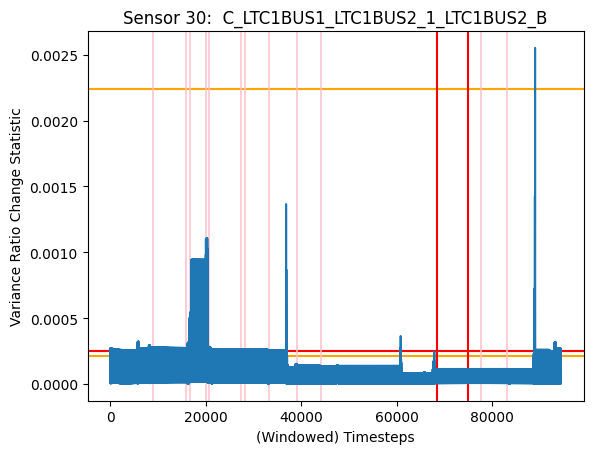

***********************************************************************************************
Sensor 31:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_N


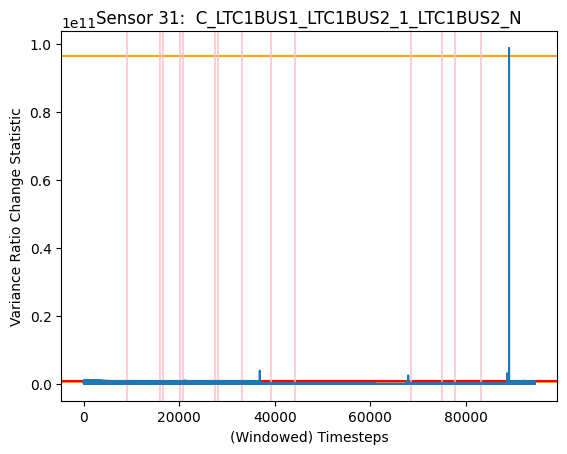

***********************************************************************************************
Sensor 32:  V_BUS13KV1_AN


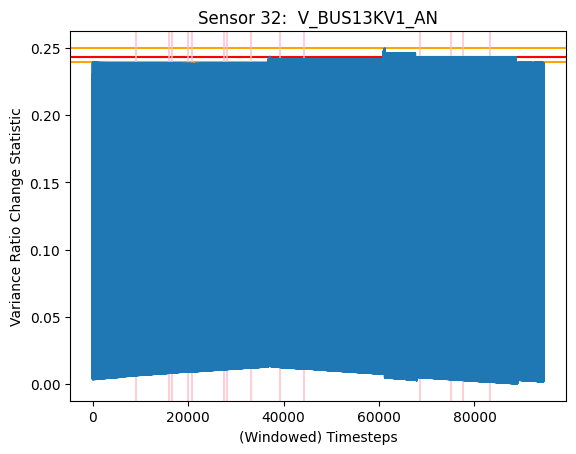

***********************************************************************************************
Sensor 33:  V_BUS13KV1_BN


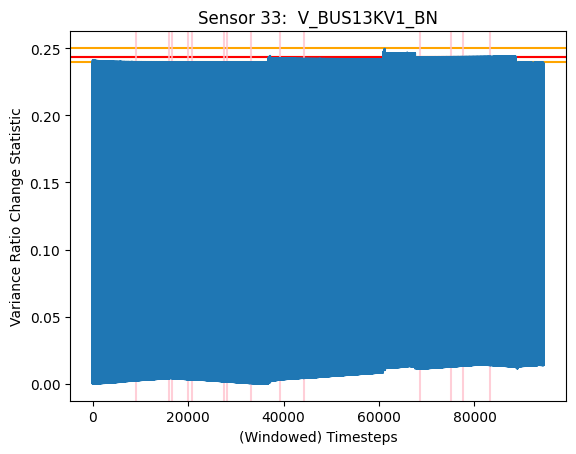

***********************************************************************************************
Sensor 34:  V_BUS13KV1_CN
DD = None


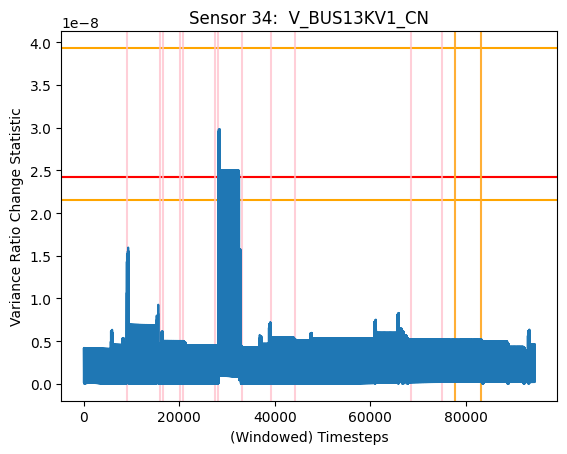

***********************************************************************************************
Sensor 35:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_A
DD = None


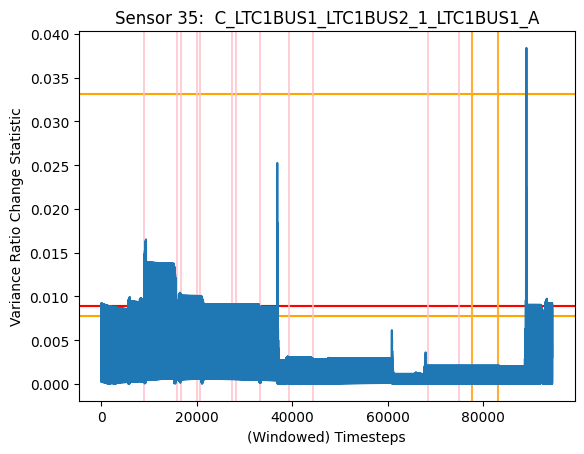

***********************************************************************************************
Sensor 36:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_B
DD = None


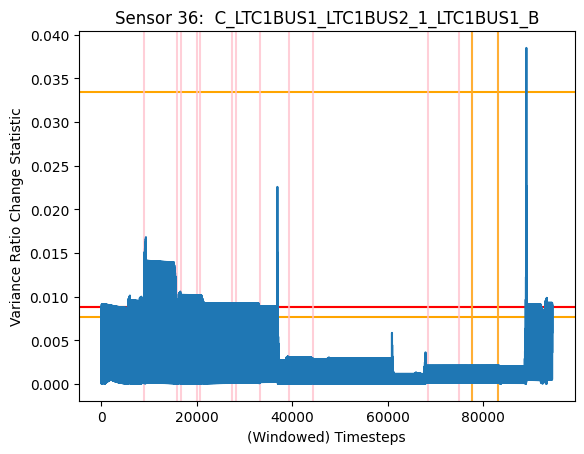

***********************************************************************************************
Sensor 37:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_N
DD = None


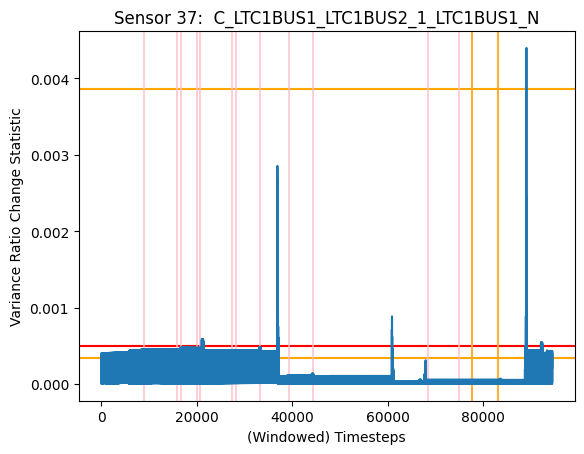

***********************************************************************************************
Sensor 38:  V_W9111_AN
DD = None


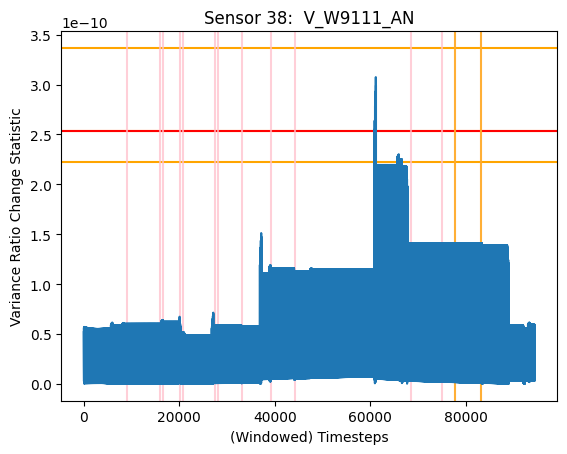

***********************************************************************************************
Sensor 39:  V_W9111_BN
DD = None


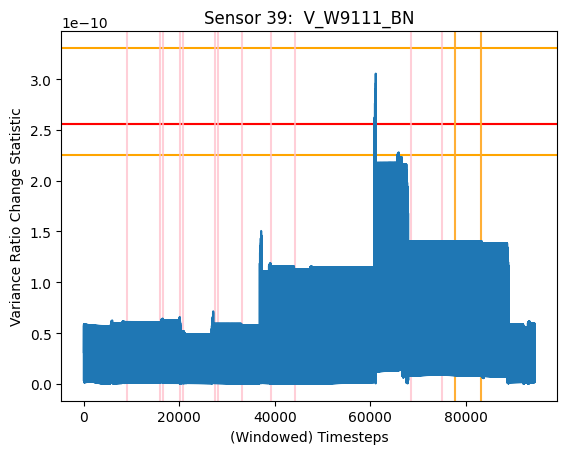

***********************************************************************************************
Sensor 40:  V_W9111_CN
DD = None


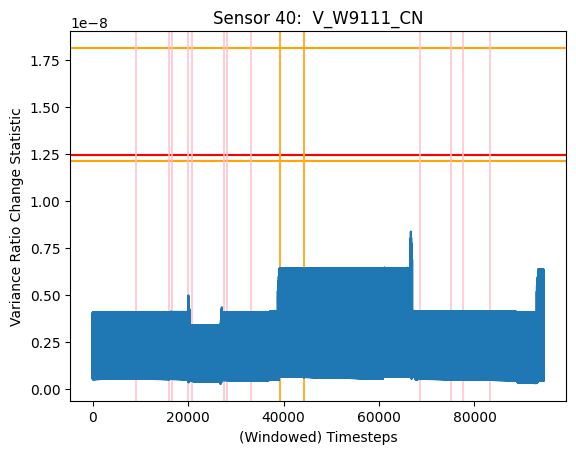

***********************************************************************************************
Sensor 41:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_A
DD = None


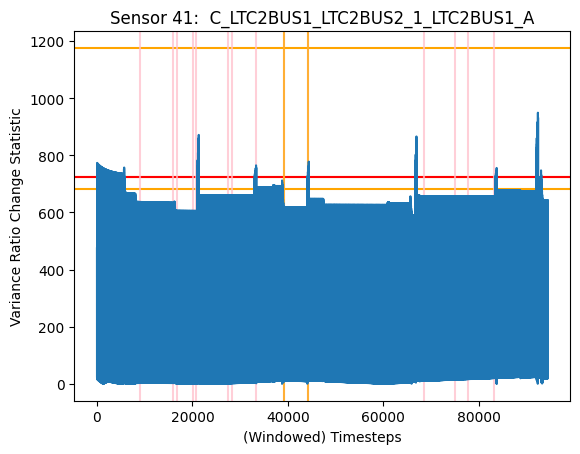

***********************************************************************************************
Sensor 42:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_B
DD = None
DD = None


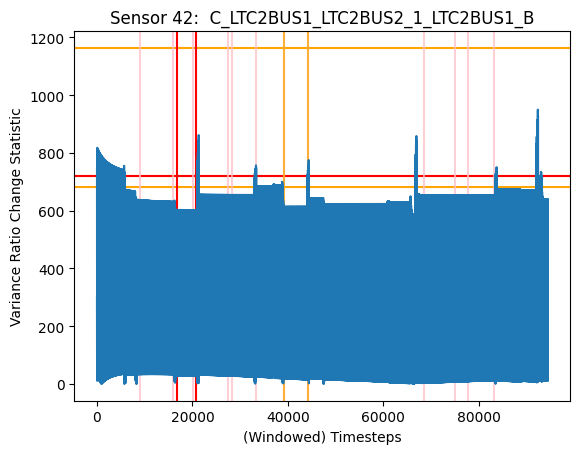

***********************************************************************************************
Sensor 43:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_N
DD = 1118
DD = None


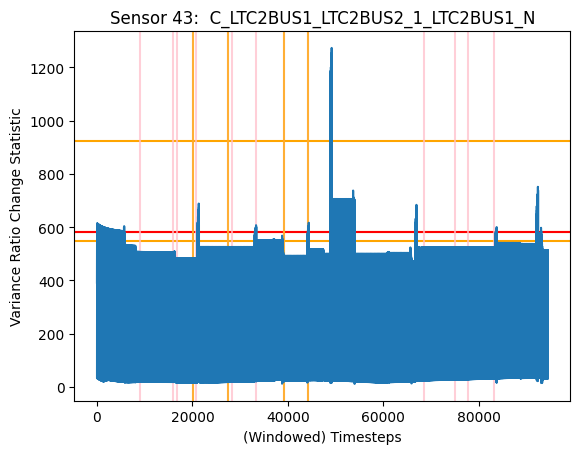

***********************************************************************************************
Sensor 44:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_A
DD = None
DD = None


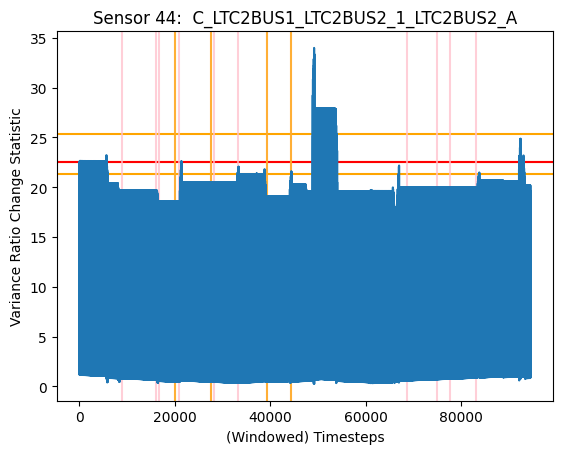

***********************************************************************************************
Sensor 45:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_B
DD = None
DD = None
DD = None


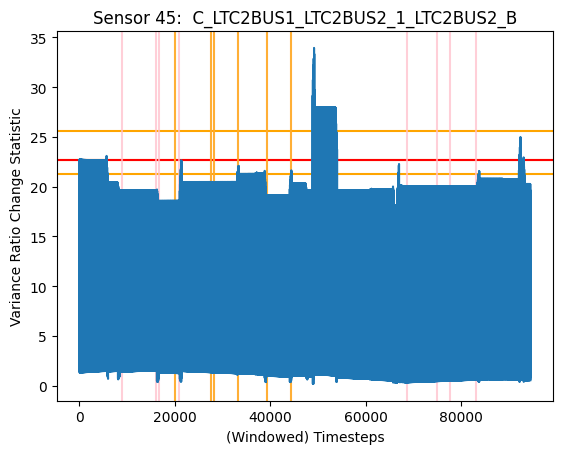

***********************************************************************************************
Sensor 46:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_C
DD = None
DD = None


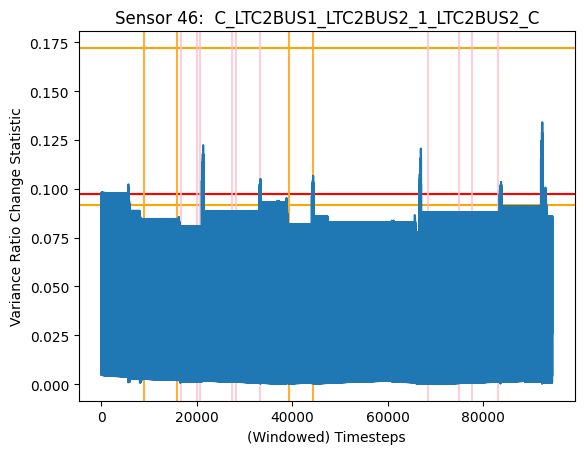

***********************************************************************************************
Sensor 47:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_N
DD = None
DD = 4816


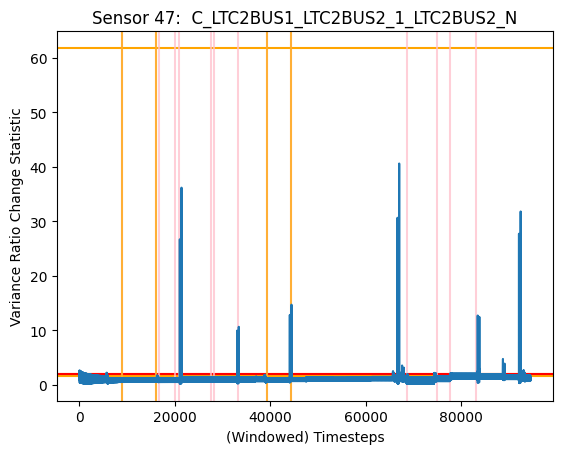

***********************************************************************************************
Sensor 48:  V_BUS13KV2_AN
DD = None
DD = None


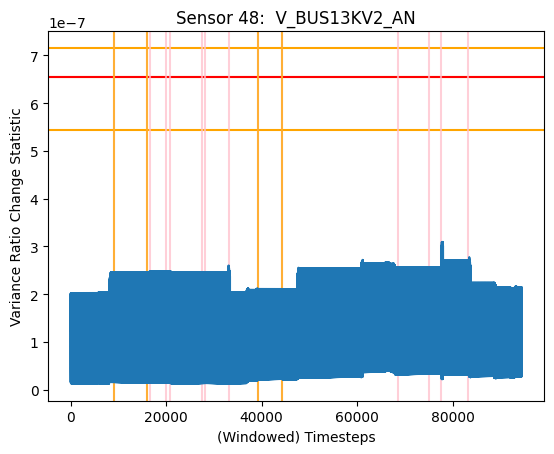

***********************************************************************************************
Sensor 49:  V_BUS13KV2_CN
DD = None


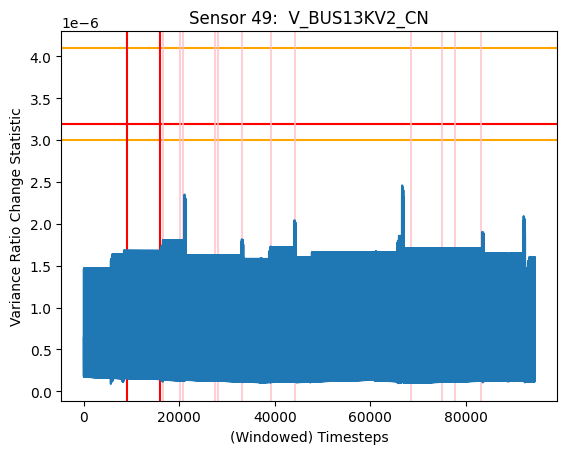

***********************************************************************************************
Sensor 50:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_A
DD = None


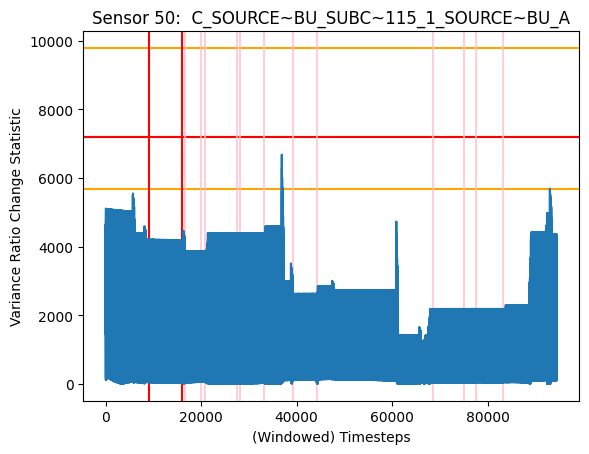

***********************************************************************************************
Sensor 51:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_B
DD = None


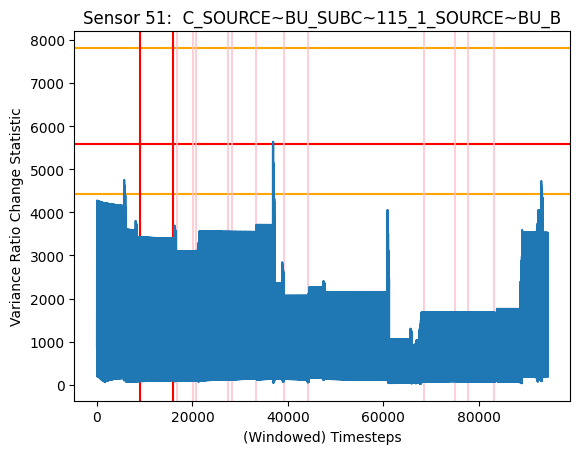

***********************************************************************************************
Sensor 52:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_N


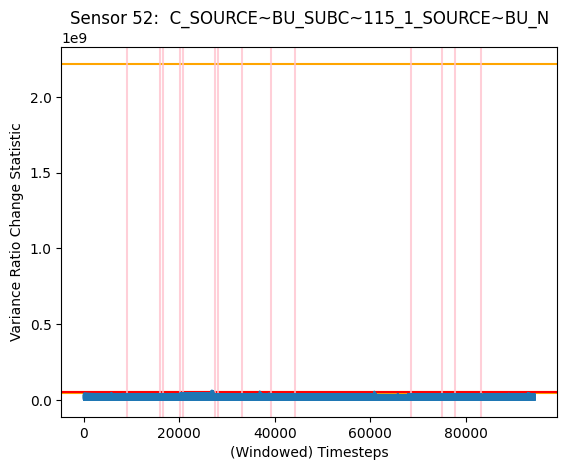

***********************************************************************************************
Sensor 53:  V_SOURCE-BU_AN


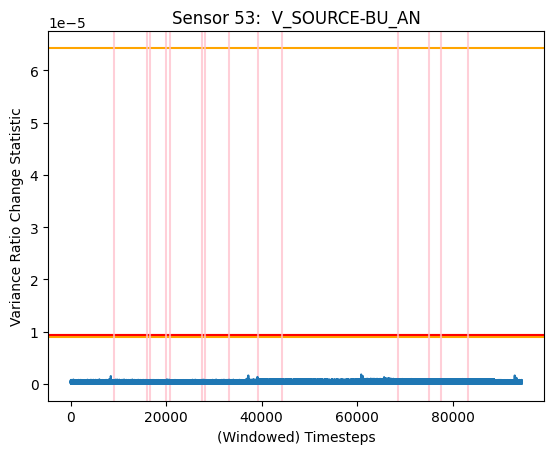

***********************************************************************************************
Sensor 54:  V_SOURCE-BU_BN
DD = None


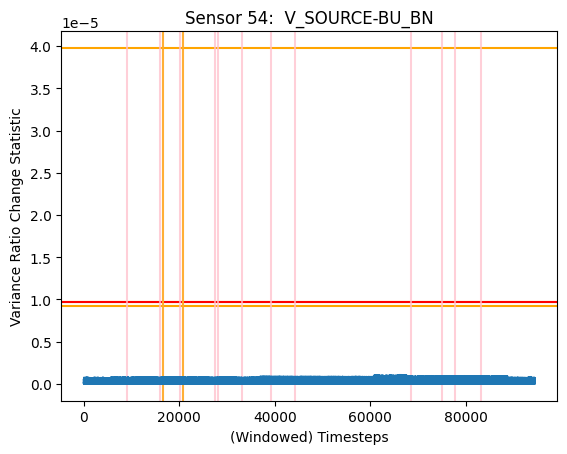

***********************************************************************************************
Sensor 55:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_A
DD = None
DD = None


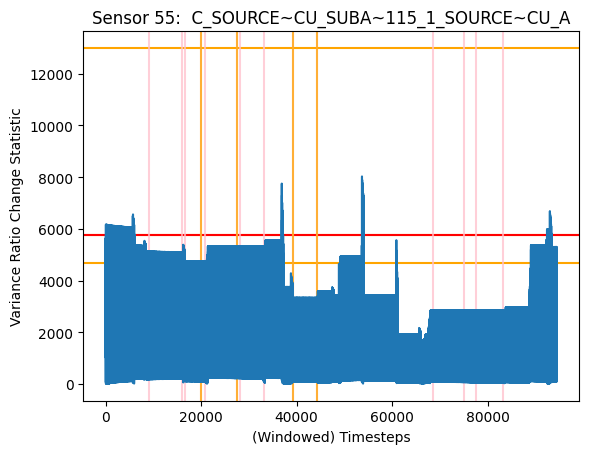

***********************************************************************************************
Sensor 56:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_B
DD = None
DD = None


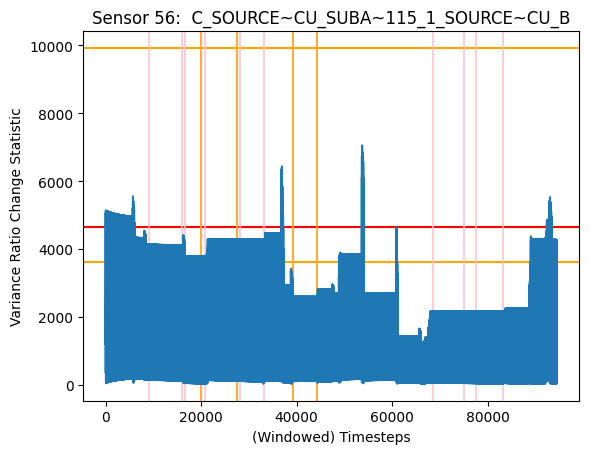

***********************************************************************************************
Sensor 57:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_C
DD = None
DD = None
DD = None


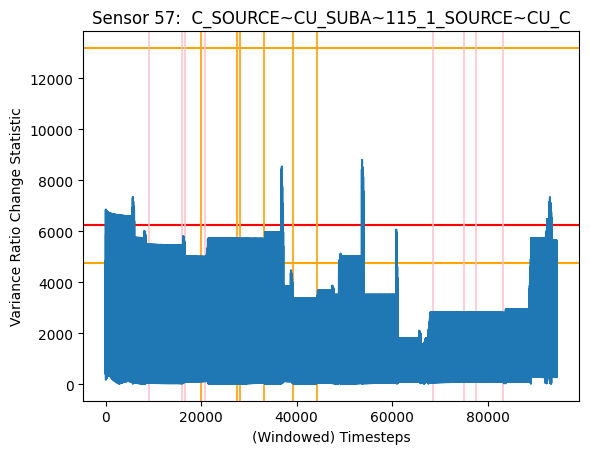

***********************************************************************************************
Sensor 58:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_N
DD = None


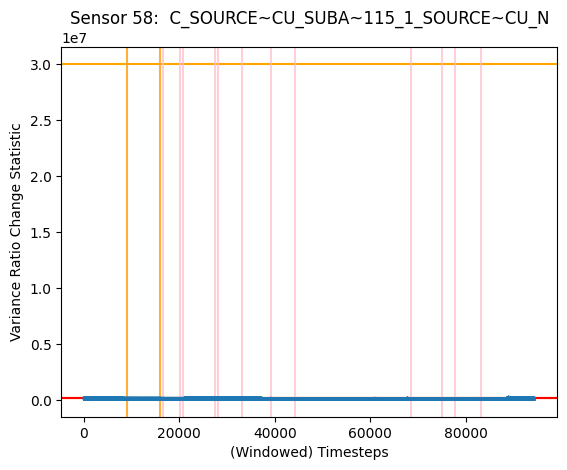

***********************************************************************************************
Sensor 59:  V_SOURCE-CU_AN
DD = None


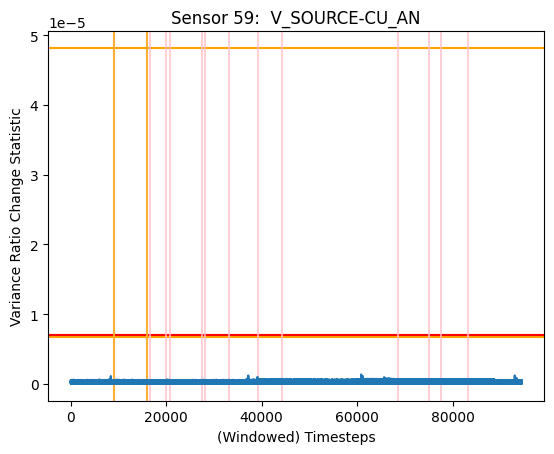

***********************************************************************************************
Sensor 60:  V_SOURCE-CU_BN
DD = None


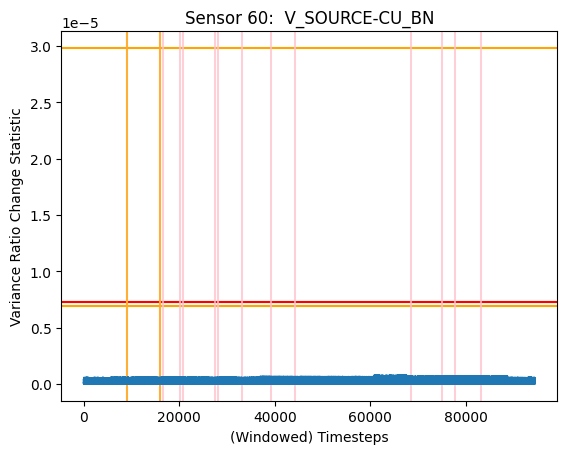

***********************************************************************************************
Sensor 61:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_A
DD = None


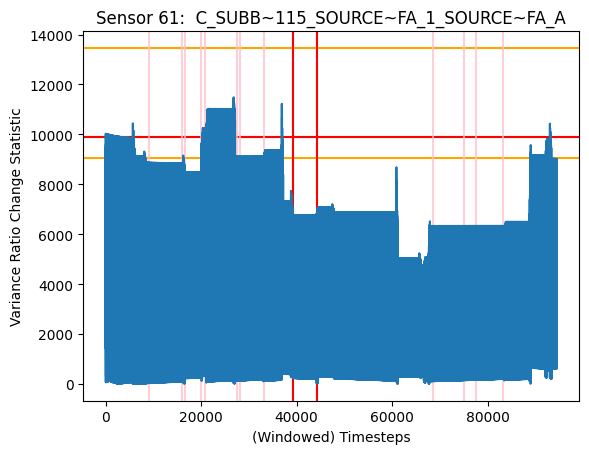

***********************************************************************************************
Sensor 62:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_B
DD = None


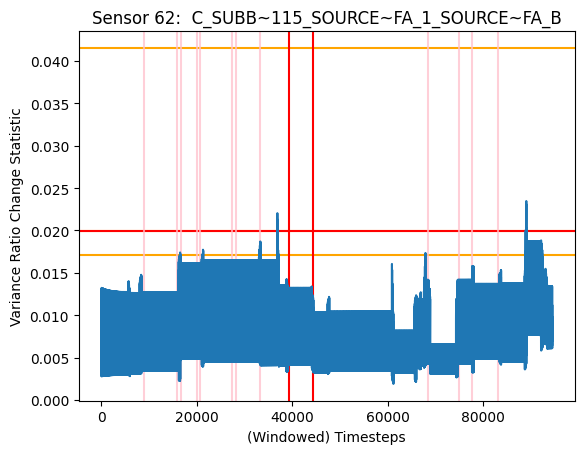

***********************************************************************************************
Sensor 63:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_C
DD = None
DD = None


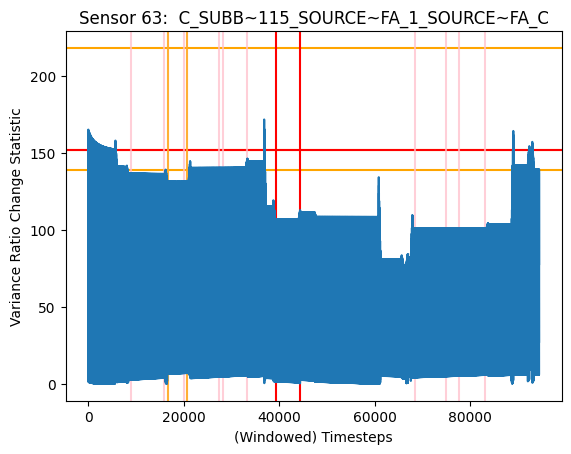

***********************************************************************************************
Sensor 64:  V_SOURCE-FA_AN
DD = None
DD = None


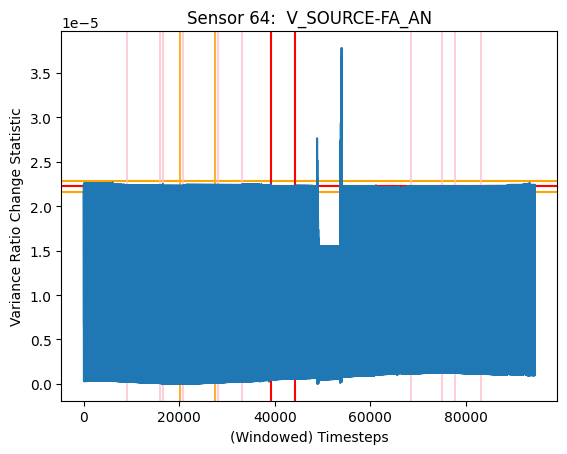

***********************************************************************************************
Sensor 65:  V_SOURCE-FA_BN
DD = None
DD = None


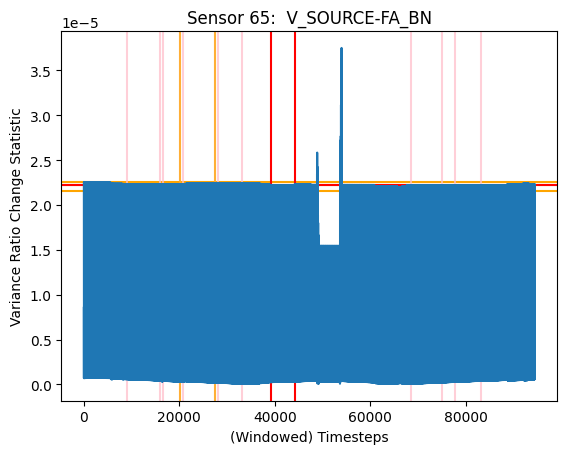

***********************************************************************************************
Sensor 66:  V_SOURCE-FA_CN
DD = None
DD = None
DD = None


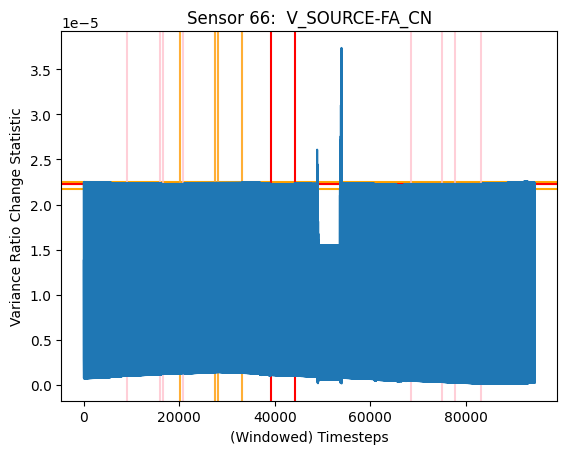

***********************************************************************************************
Sensor 67:  C_W738_W737_2_W737_A


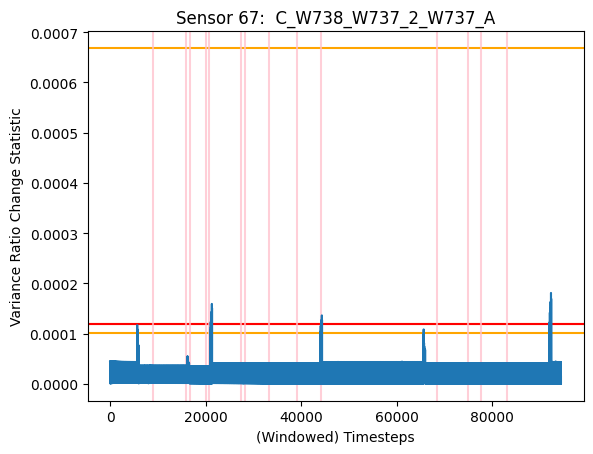

***********************************************************************************************
Sensor 68:  C_W738_W737_2_W737_B


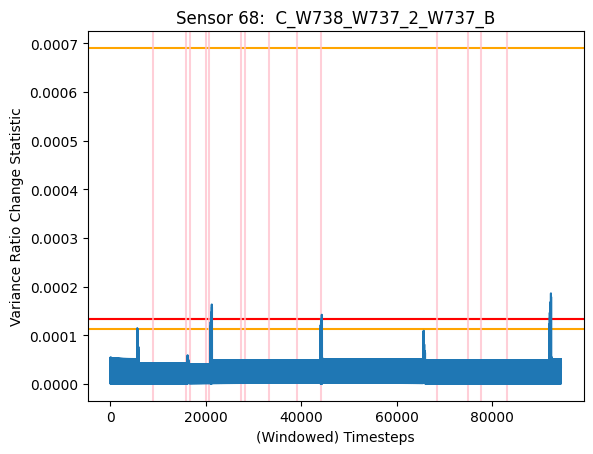

***********************************************************************************************
Sensor 69:  C_W738_W737_2_W737_C


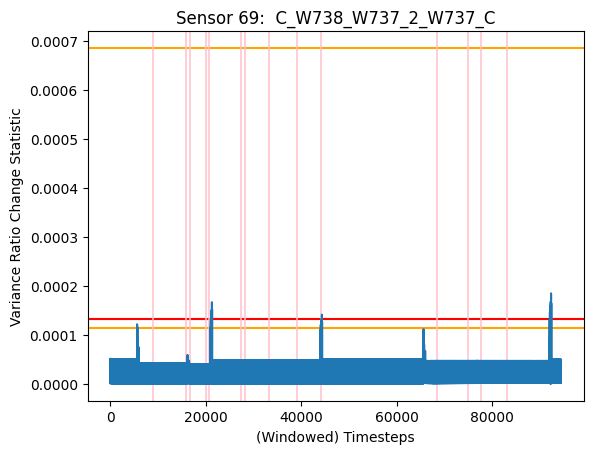

***********************************************************************************************
Sensor 70:  V_W738_AN
DD = None


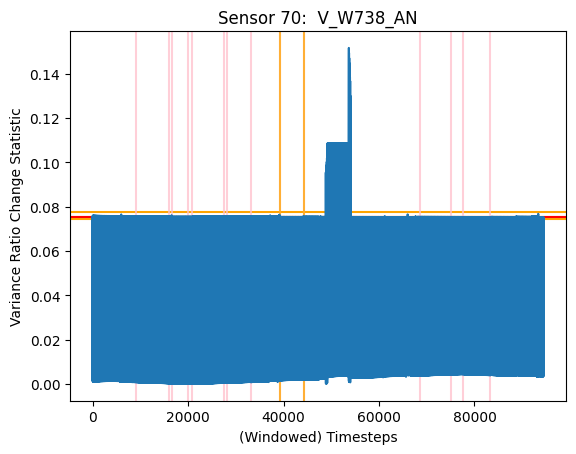

***********************************************************************************************
Sensor 71:  V_W738_BN
DD = None


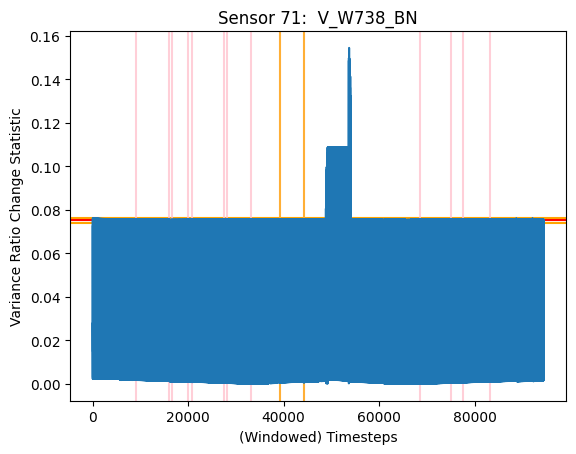

***********************************************************************************************
Sensor 72:  V_W738_CN
DD = None
DD = None


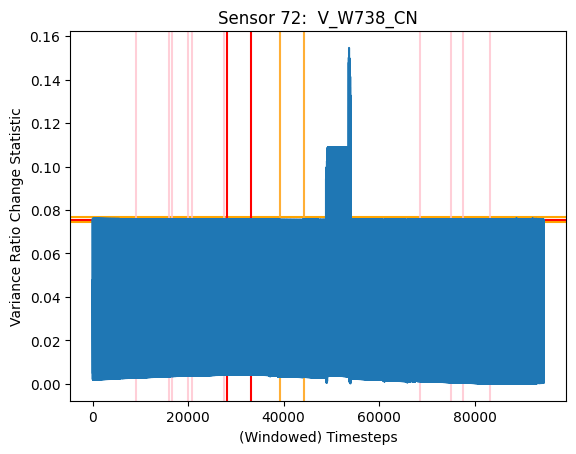

***********************************************************************************************
Sensor 73:  C_W747_W748_2_W747_A
DD = None


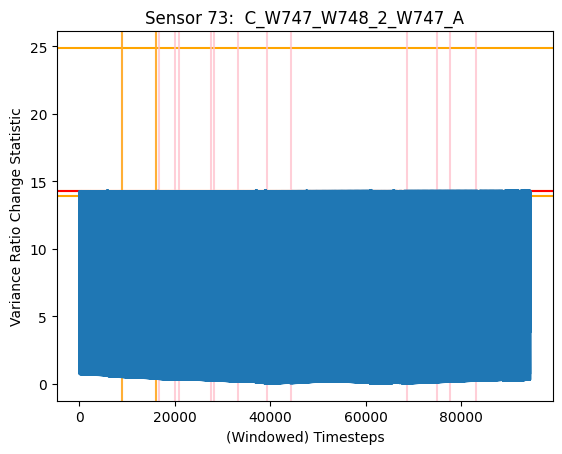

***********************************************************************************************
Sensor 74:  C_W747_W748_2_W747_B
DD = None


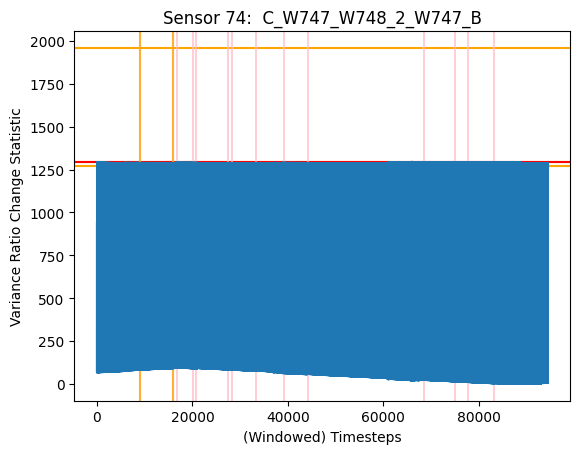

***********************************************************************************************
Sensor 75:  C_W747_W748_2_W747_C
DD = None


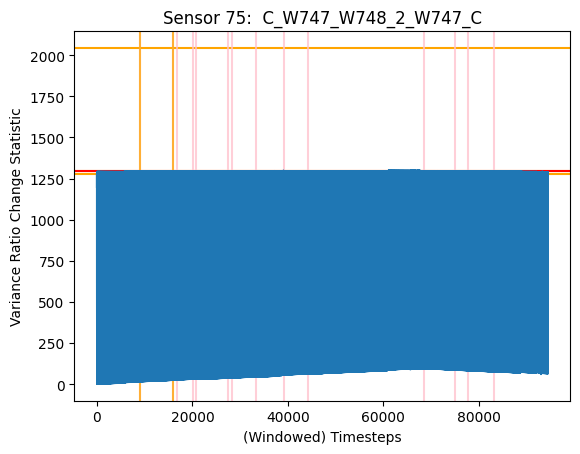

***********************************************************************************************
Sensor 76:  V_W748_AN
DD = None
DD = None
DD = None


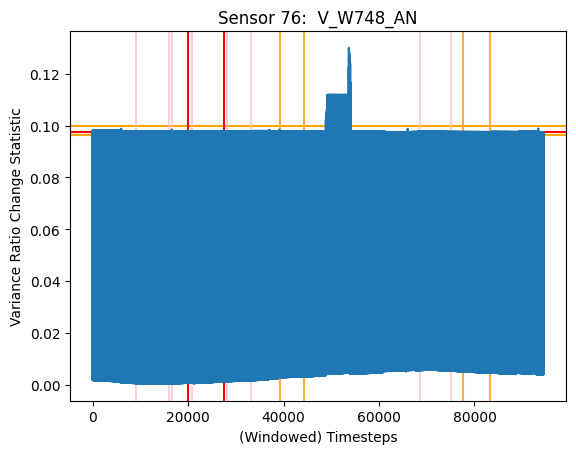

***********************************************************************************************
Sensor 77:  V_W748_BN
DD = None
DD = None
DD = None


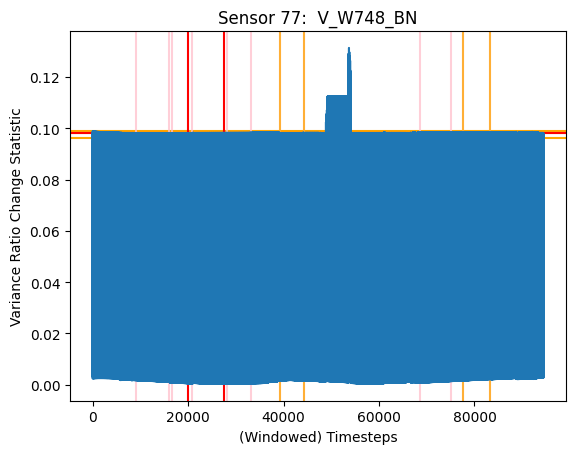

***********************************************************************************************
Sensor 78:  V_W748_CN
DD = None
DD = None
DD = None


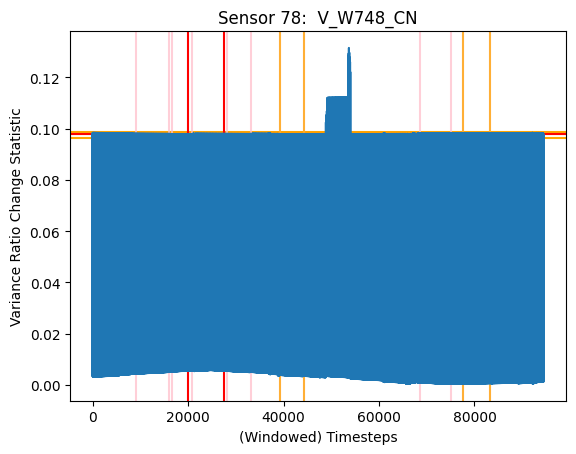

***********************************************************************************************
Sensor 79:  C_W787_W788_2_W787_A
DD = None


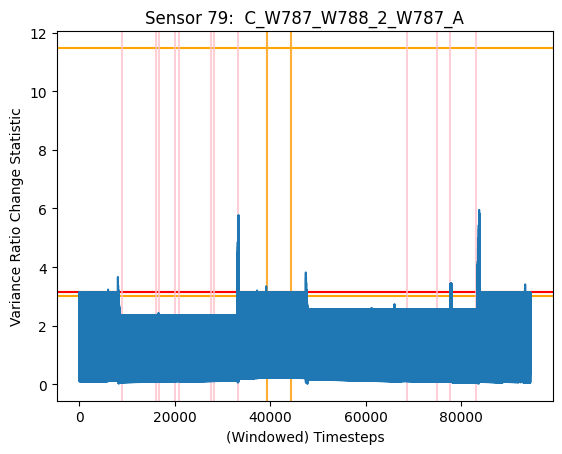

***********************************************************************************************
Sensor 80:  C_W787_W788_2_W787_B
DD = None


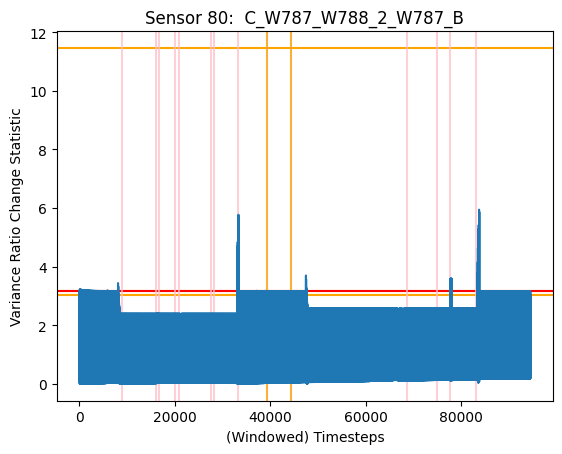

***********************************************************************************************
Sensor 81:  C_W787_W788_2_W787_C
DD = None


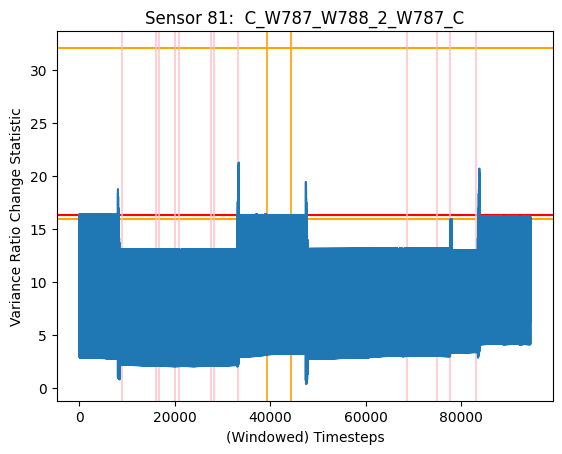

***********************************************************************************************
Sensor 82:  V_W788_AN
DD = None


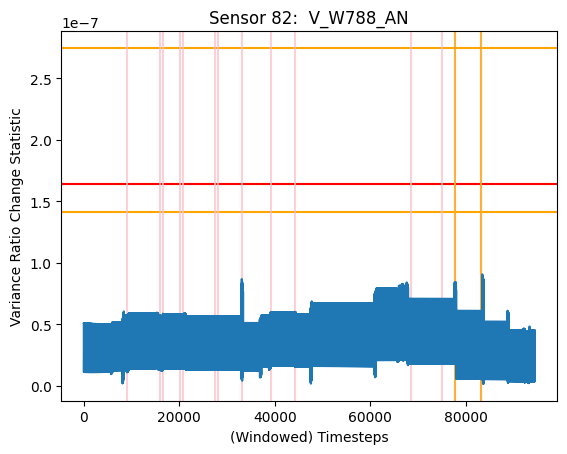

***********************************************************************************************
Sensor 83:  V_W788_BN
DD = 8


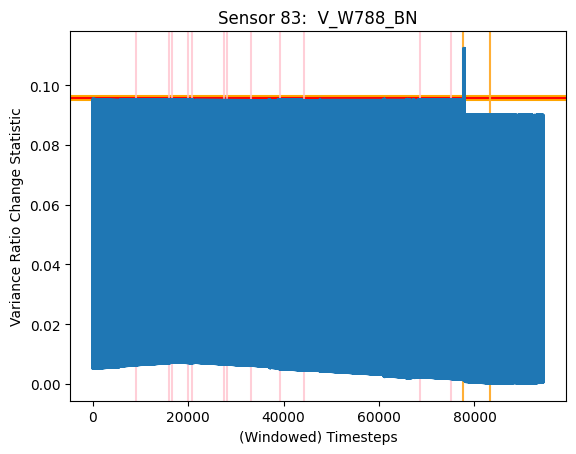

***********************************************************************************************
Sensor 84:  V_W788_CN
DD = 14


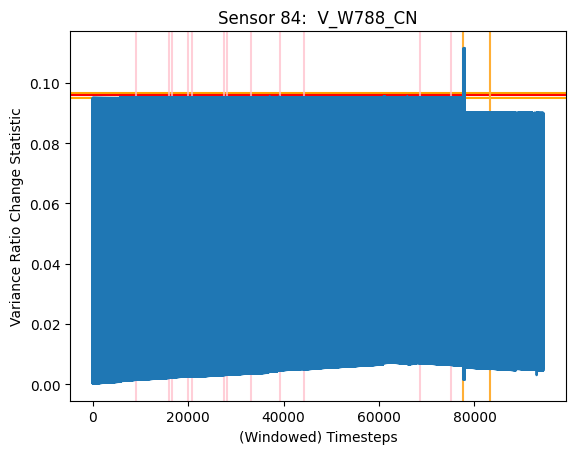

***********************************************************************************************
Sensor 85:  C_W797_W798_2_W797_B


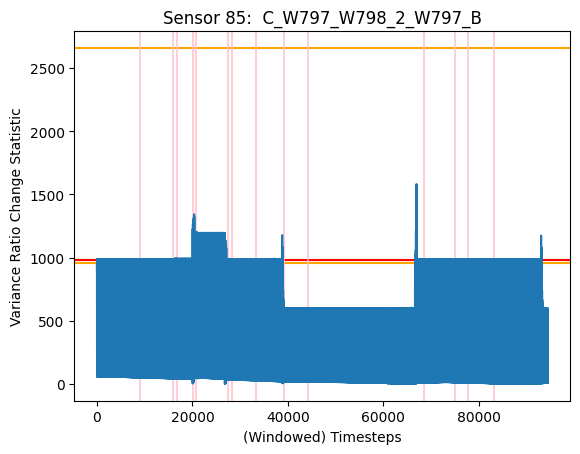

***********************************************************************************************
Sensor 86:  C_W797_W798_2_W797_C


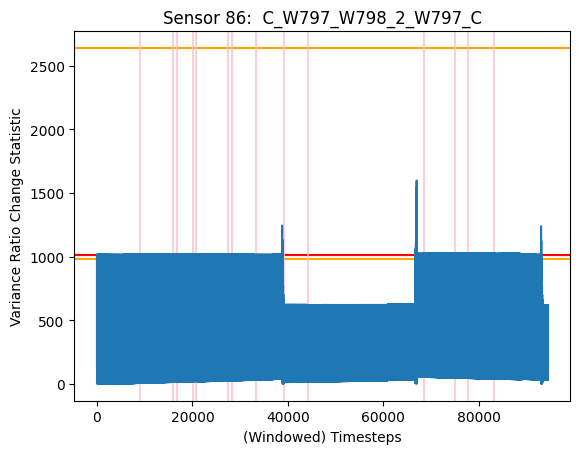

***********************************************************************************************
Sensor 87:  C_W797_W798_2_W797_N
DD = None


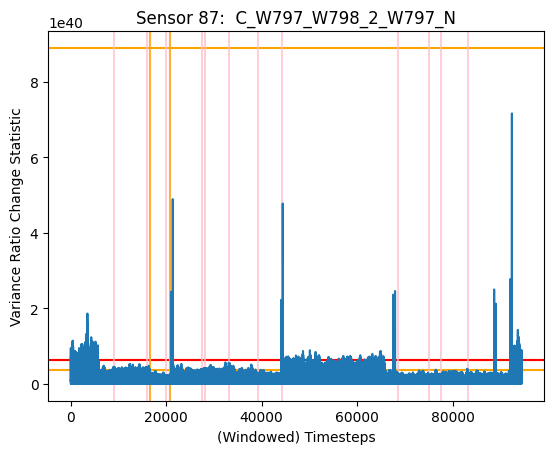

***********************************************************************************************
Sensor 88:  C_FD2B2_FD2B1_1_FD2B1_B
DD = None


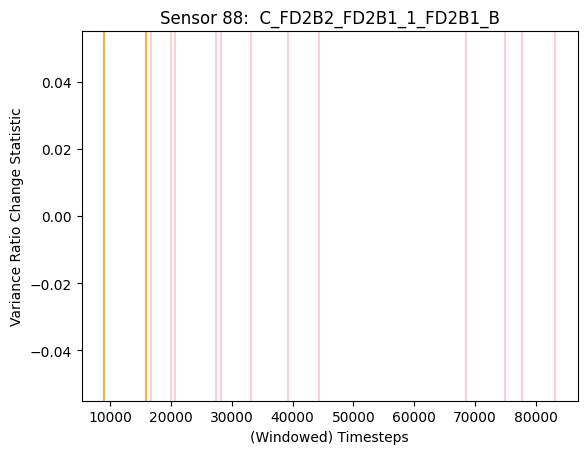

***********************************************************************************************
Sensor 89:  C_FD2B2_FD2B1_1_FD2B1_C
DD = None


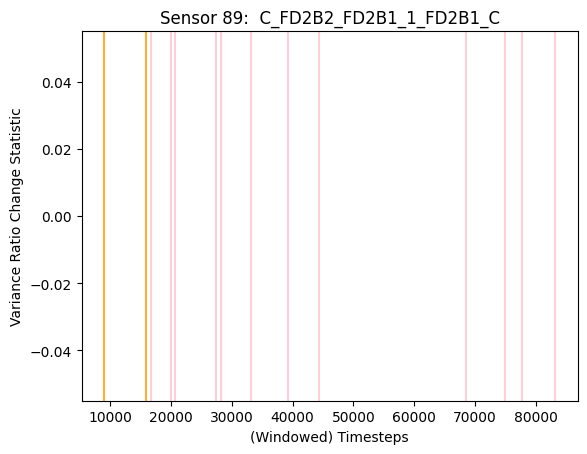

***********************************************************************************************
Sensor 90:  C_FD2B2_FD2B1_1_FD2B1_N
DD = None


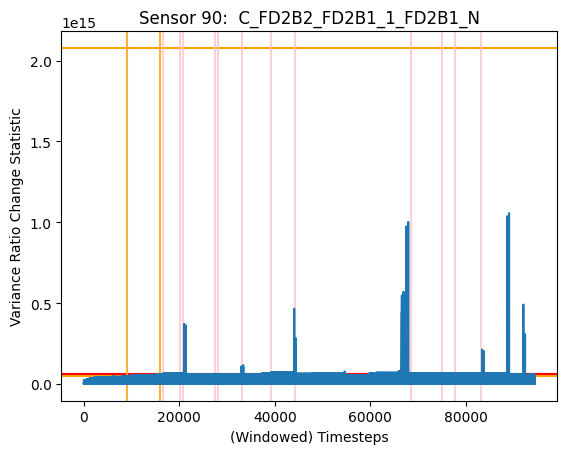

***********************************************************************************************
Sensor 91:  C_FD2B5_FD2B6_1_FD2B5_B
DD = None


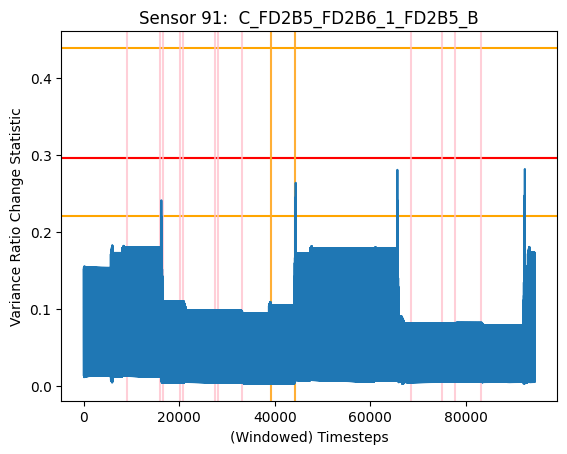

***********************************************************************************************
Sensor 92:  C_FD2B5_FD2B6_1_FD2B5_C
DD = None


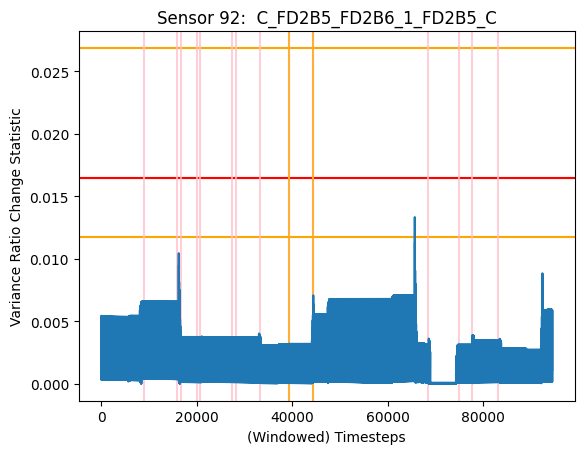

***********************************************************************************************
Sensor 93:  C_FD2B5_FD2B6_1_FD2B5_N
DD = 4808


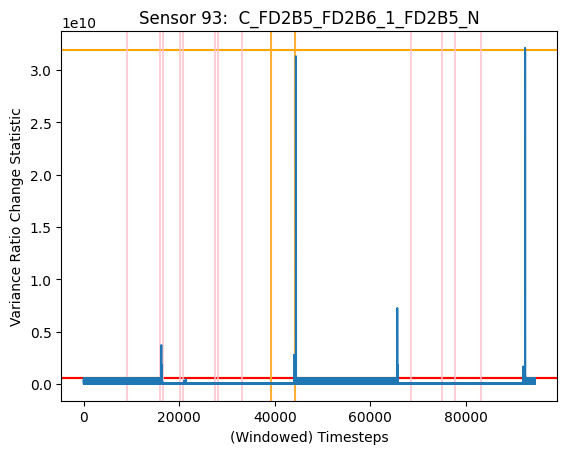

[None, None, None, None, None, None, None, None, None, None, None, None, 211, None, 238, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, 1118, None, None, None, None, None, None, None, None, None, 4816, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, 8, 14, None, None, None, None, None, None, 4808]


In [66]:
LD_var = []
at_neighbor = {}

rsum_list = rsum_list_var
threshold = thresholds_var_99
t_list = [thresholds_var, thresholds_var_99, thresholds_var_95]
persistency = 5

for index, i in enumerate(rsum_list):
    print("***********************************************************************************************")
    attack_in = (i > threshold[index]).nonzero()

    violations = (rsum_list > threshold.reshape(-1, 1))

    print(f"Sensor {things[index]}: {cols[things[index]-1]}")
    at_neighbor[things[index]] = attack_in
    plt.title(f"Sensor {things[index]}: {cols[things[index]-1]}")
    plt.xlabel("(Windowed) Timesteps")
    plt.ylabel("Variance Ratio Change Statistic")

    for t in t_list:
        plt.axhline(t[index], color='orange')

    plt.axhline(threshold[index], color='red')

    if things[index] in attack_dict:
        #if sensor is being attacked

        # ground truth
        attack_indices = df_test.index[
            (df_test['Time'] >= attack_dict[things[index]][0] * 1e6) &
            (df_test['Time'] <= attack_dict[things[index]][1] * 1e6)] - 1201

        for start, end in sorted(list(all_attack_indices)):

            # if this is the attack time of the sensor, plot solid red lines
            if attack_indices[0] == start:
                DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                LD_var.append(DD)
                print(f"DD = {DD}")
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='red')
                plt.axvline(end_w, color='red')

            # otherwise, plot pink lines
            else:
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='pink', alpha=0.75)
                plt.axvline(end_w, color='pink', alpha=0.75)

                start_w = start-window-w
                end_w = end+window+w-1
                for starts, ate in attack_i.items():
                  if starts == start and things[index] in ate:
                    DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                    LD_var.append(DD)
                    print(f"DD = {DD}")
                    plt.axvline(start_w, color='orange', alpha=0.75)
                    plt.axvline(end_w, color='orange', alpha=0.75)

    else:
         for start, end in sorted(list(all_attack_indices)):
            start_w = start-window-w
            end_w = end+window+w-1
            plt.axvline(start_w, color='pink', alpha=0.75)
            plt.axvline(end_w, color='pink', alpha=0.75)
            for starts, ate in attack_i.items():
              if starts == start:
                if things[index] in ate:
#                   print(things[index])
                  DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                  LD_var.append(DD)
                  print(f"DD = {DD}")
                  plt.axvline(start_w, color='orange', alpha=0.75)
                  plt.axvline(end_w, color='orange', alpha=0.75)

    plt.plot(i)
    plt.show()

print(LD_var)

Summary:

In [67]:
n = 0
flr = []
violation = np.logical_or((rsum_list_corr > t_corr[1].reshape(-1, 1)), (rsum_list_var > t_var[1].reshape(-1, 1)))
attack_pred = violation.nonzero()

for i, (start, end) in enumerate(sorted(all_attack_indice)):
    print("***********************************************************************************************")
    print(f'For the {order_attack[n]} attack starting at index: {start} and ending at index: {end}')
    localisation_idx = []
#         print(start, end)
    start_w = start - window - w + 1
    end_w = end + window + w - 1
    # get all indices that are after the start of attack
    indices = np.logical_and((attack_pred[1] >= start_w), (attack_pred[1] <= end_w))
    #         print(idx.sum())
    #         print(attack_pred.shape())
    attack_window = attack_pred[1][indices]
    attack_sensors = attack_pred[0][indices]

    sensor_list = attacks_shifted_index[attack_start_times[i]]
    sensors_attacked = [s for sensor_l in sensor_list for s in sensor_l]

    false_localised_sensors = 0
    false_localised_sensors_list = []

    for sensor in np.unique(attack_sensors):
        if sensor not in sensors_attacked:
            sensor_indices = (attack_sensors == sensor)
            sensor_attack_window = np.sort(attack_window[sensor_indices])

            # check for persistency
            idx = persistency_check(sensor_attack_window, persistency)
            if idx is not None:
                false_localised_sensors += 1
                false_localised_sensors_list.append(sensor)

    print(f'1 Hop: {sensors_attacked}')
    print(f'False Localisations: {false_localised_sensors_list}')

    flr.append(false_localised_sensors/len(sensors_attacked))
    n += 1
flr

***********************************************************************************************
For the CT attack starting at index: 9360 and ending at index: 15599
1 Hop: [48, 87, 45, 72, 57, 49, 58, 46, 73, 88, 50, 89, 47, 74, 59]
False Localisations: [12, 13, 14, 28, 29, 33, 34, 35]
***********************************************************************************************
For the Cphase attack starting at index: 17040 and ending at index: 20399
1 Hop: [41, 86, 53, 62]
False Localisations: [2, 16, 17, 28, 29, 34, 35, 83, 84]
***********************************************************************************************
For the PT attack starting at index: 20400 and ending at index: 27119
1 Hop: [75, 54, 3, 9, 63, 15, 42, 21, 76, 55, 4, 10, 64, 16, 43, 22, 77, 56, 5, 11, 65, 17, 44, 23]
False Localisations: [2, 18, 24, 28, 29, 30, 34, 35, 36, 37, 40, 41, 45, 46, 47, 50, 51, 53, 57, 59, 60, 61, 66, 67, 68, 74, 79, 81, 83, 84, 86, 89, 91, 92]
***************************************

[0.5333333333333333,
 2.25,
 1.4166666666666667,
 3.75,
 0.4666666666666667,
 2.0,
 0.8888888888888888]

In [68]:
np.mean(flr), np.std(flr)

(1.6150793650793651, 1.0800079784705716)

In [69]:
np.mean(df_test['Time'][df_test['Time'] > 0.25e6].diff())

208.3319937132791